# Atividade 07 - Agrupamento - KMeans

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
pd.set_option('display.max_columns', 21)

In [2]:
sns.set()

In [3]:
data = pd.read_csv("telecom-churn.csv")

In [4]:
data.head()

,State,Account Length,Area Code,Phone Number,International Plan,Voice mail Plan,Num of Voice mail Messages,Total Day Minutes,Total Day Calls,Total day Charge,Total Eve Minutes,Total Eve Calls,Total Eve Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total International Minutes,Total Intl Calls,Total Intl Charge,Number Customer Service calls,Churn
0,KS,128,415.0,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91.0,11.01,10.0,3,2.70,1.0,False.
1,OH,107,415.0,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103.0,11.45,13.7,3,3.70,1.0,False.
2,NJ,137,415.0,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104.0,7.32,12.2,5,3.29,0.0,False.
3,OH,84,408.0,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89.0,8.86,6.6,7,1.78,2.0,False.
4,OK,75,415.0,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121.0,8.41,10.1,3,2.73,3.0,False.


### 1. Selecionar as amostras: estamos interessados apenas em clientes que mantém seus contratos, por isso devem ser selecionadas as amostras correspondentes a tais clientes;

In [5]:
for col in data.columns:
    if not np.issubdtype(data[col].dtype, np.number):
        if len(data[col].unique()) < 11:
            _dat = pd.get_dummies(data[col], prefix=col).iloc[:,1:]
            data = pd.concat([data, _dat], 1)
            data = data.drop(col, 1)
        else:
            if "Charges" in col:
                data[col] = pd.to_numeric(data[col].replace(" ", 0))

In [6]:
# Verificando quantidade de clientes que mantém os seus contratos
print(data.groupby('Churn_ True.')['Phone Number'].count())

Churn_ True.
0    4293
1     707
Name: Phone Number, dtype: int64


In [7]:
# Calculando a taxa de Churn da amostra
clientes_churn_true = data["Churn_ True."][data["Churn_ True."] == True]
print("Taxa de Churn = "+str( (clientes_churn_true.shape[0] / data["Churn_ True."].shape[0]) * 100 ))

Taxa de Churn = 14.14


In [8]:
# Capturando os clientes que mantiveram os contratos
df = data[data['Churn_ True.'] == False]

In [9]:
print(len(data) - len(df))

707


In [10]:
# Atribuindo o rótulo de taxa de churn
Y = df["Churn_ True."]

### 2. Selecionar os atributos: estamos interessados apenas em atributos numéricos (dos tipos integer ou numeric). Note que você deverá analisar o significado dos dados e não apenas suas representações no Pandas, pois alguns dados categóricos podem estar representados como inteiros;

In [11]:
df.head()

,State,Account Length,Area Code,Phone Number,Num of Voice mail Messages,Total Day Minutes,Total Day Calls,Total day Charge,Total Eve Minutes,Total Eve Calls,Total Eve Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total International Minutes,Total Intl Calls,Total Intl Charge,Number Customer Service calls,International Plan_ yes,Voice mail Plan_ yes,Churn_ True.
0,KS,128,415.0,382-4657,25,265.1,110,45.07,197.4,99,16.78,244.7,91.0,11.01,10.0,3,2.70,1.0,0,1,0
1,OH,107,415.0,371-7191,26,161.6,123,27.47,195.5,103,16.62,254.4,103.0,11.45,13.7,3,3.70,1.0,0,1,0
2,NJ,137,415.0,358-1921,0,243.4,114,41.38,121.2,110,10.30,162.6,104.0,7.32,12.2,5,3.29,0.0,0,0,0
3,OH,84,408.0,375-9999,0,299.4,71,50.90,61.9,88,5.26,196.9,89.0,8.86,6.6,7,1.78,2.0,1,0,0
4,OK,75,415.0,330-6626,0,166.7,113,28.34,148.3,122,12.61,186.9,121.0,8.41,10.1,3,2.73,3.0,1,0,0


In [29]:
# Correlação dos atributos
data.corr()['Churn_ True.'].sort_values()

Voice mail Plan_ yes             -0.110698
Num of Voice mail Messages       -0.097633
Total Intl  Calls                -0.046893
Total Night Calls                -0.006861
Total Eve Calls                  -0.006284
Area Code                         0.010099
Total Day Calls                   0.016130
Account Length                    0.021203
Total Night Charge                0.045673
Total Night Minutes               0.045677
Total Intl Charge                 0.063166
Total International Minutes       0.063324
Total Eve Minutes                 0.089222
Total Eve Charge                  0.089305
Total day Charge                  0.207664
Total Day Minutes                 0.207705
Number Customer Service calls     0.212913
International Plan_ yes           0.259123
Churn_ True.                      1.000000
Name: Churn_ True., dtype: float64

In [12]:
X = df.drop(["Churn_ True.", "State", "Area Code", "Phone Number", "International Plan_ yes", "Voice mail Plan_ yes", "Num of Voice mail Messages"], 1)
labels = np.asarray(["Churn_ True."])

In [13]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4293 entries, 0 to 4999
Data columns (total 14 columns):
Account Length                    4293 non-null int64
Total Day Minutes                 4293 non-null float64
Total Day Calls                   4293 non-null int64
Total day Charge                  4292 non-null float64
Total Eve Minutes                 4293 non-null float64
Total Eve Calls                   4293 non-null int64
Total Eve Charge                  4293 non-null float64
Total Night Minutes               4293 non-null float64
Total Night Calls                 4292 non-null float64
Total Night Charge                4293 non-null float64
Total International Minutes       4292 non-null float64
Total Intl  Calls                 4293 non-null int64
Total Intl Charge                 4291 non-null float64
Number Customer Service calls     4293 non-null float64
dtypes: float64(10), int64(4)
memory usage: 503.1 KB


### 3. Tratar dados incompletos: amostras incompletas deverão ser tratadas, e você deve escolher a forma que achar mais adequada. Considere como uma amostra incompleta uma linha que faltam dados em alguma das colunas selecionadas anteriormente.

In [14]:
# Verifica se existe valores nulos no dataset
limpo = X.dropna()
print('Qtde de linhas com alguma anotação nula: %d' %(X.shape[0]-limpo.shape[0]))

Qtde de linhas com alguma anotação nula: 5


In [15]:
# verifica quais colunas tem valore nulos 
X.isnull().sum()

Account Length                    0
Total Day Minutes                 0
Total Day Calls                   0
Total day Charge                  1
Total Eve Minutes                 0
Total Eve Calls                   0
Total Eve Charge                  0
Total Night Minutes               0
Total Night Calls                 1
Total Night Charge                0
Total International Minutes       1
Total Intl  Calls                 0
Total Intl Charge                 2
Number Customer Service calls     0
dtype: int64

In [16]:
# Por ter 9 linhas de 5.000 valores, optei por remover os nan
X.dropna(inplace=True)

In [17]:
# verifica novamente as colunas e se os valores foram removidos 
X.isnull().sum()

Account Length                    0
Total Day Minutes                 0
Total Day Calls                   0
Total day Charge                  0
Total Eve Minutes                 0
Total Eve Calls                   0
Total Eve Charge                  0
Total Night Minutes               0
Total Night Calls                 0
Total Night Charge                0
Total International Minutes       0
Total Intl  Calls                 0
Total Intl Charge                 0
Number Customer Service calls     0
dtype: int64

In [18]:
X["Total Day Minutes"] = X["Total Day Minutes"].astype(np.int64)
X["Total day Charge"] = X["Total day Charge"].astype(np.int64)
X["Total Eve Charge"] = X["Total Eve Charge"].astype(np.int64)
X["Total Night Minutes"] = X["Total Night Minutes"].astype(np.int64)
X["Total Night Charge"] = X["Total Night Charge"].astype(np.int64)
X["Total International Minutes"] = X["Total International Minutes"].astype(np.int64)
X["Total Intl Charge"] = X["Total Intl Charge"].astype(np.int64)
X["Total Night Calls "] = X["Total Night Calls "].astype(np.int64)
X["Number Customer Service calls "] = X["Number Customer Service calls "].astype(np.int64)

X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4288 entries, 0 to 4999
Data columns (total 14 columns):
Account Length                    4288 non-null int64
Total Day Minutes                 4288 non-null int64
Total Day Calls                   4288 non-null int64
Total day Charge                  4288 non-null int64
Total Eve Minutes                 4288 non-null float64
Total Eve Calls                   4288 non-null int64
Total Eve Charge                  4288 non-null int64
Total Night Minutes               4288 non-null int64
Total Night Calls                 4288 non-null int64
Total Night Charge                4288 non-null int64
Total International Minutes       4288 non-null int64
Total Intl  Calls                 4288 non-null int64
Total Intl Charge                 4288 non-null int64
Number Customer Service calls     4288 non-null int64
dtypes: float64(1), int64(13)
memory usage: 502.5 KB


In [19]:
# Tratando valores classificados como infinitos
X['Total Eve Minutes'] = np.where(np.isinf(X['Total Eve Minutes']), 0.0, X['Total Eve Minutes'])

X["Total Eve Minutes"] = X["Total Eve Minutes"].astype(np.int64)

X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4288 entries, 0 to 4999
Data columns (total 14 columns):
Account Length                    4288 non-null int64
Total Day Minutes                 4288 non-null int64
Total Day Calls                   4288 non-null int64
Total day Charge                  4288 non-null int64
Total Eve Minutes                 4288 non-null int64
Total Eve Calls                   4288 non-null int64
Total Eve Charge                  4288 non-null int64
Total Night Minutes               4288 non-null int64
Total Night Calls                 4288 non-null int64
Total Night Charge                4288 non-null int64
Total International Minutes       4288 non-null int64
Total Intl  Calls                 4288 non-null int64
Total Intl Charge                 4288 non-null int64
Number Customer Service calls     4288 non-null int64
dtypes: int64(14)
memory usage: 502.5 KB


## Agrupamento dos dados

### 4. Clusterização com diferentes k: sugiro que sejam realizadas clusterizações com k variando de 2 a 30;

In [20]:
range_n_clusters = list(range(2,30))

data_set = X

cluster_labels = list()
cluster_labels_val = list()
cluster_labels_test = list()
cluster_labels_comp = list()
kmeans = list()
silhouette_avg = list()
sample_silhouette_values = list()

for n_clusters in range_n_clusters:
    print('treinando k =',n_clusters)
    _kmeans = KMeans(n_clusters=n_clusters,
                     random_state=42,
                     verbose=1).fit(data_set)
    kmeans.append(_kmeans)
    _cluster_labels = _kmeans.fit_predict(data_set)
    cluster_labels.append(_cluster_labels)

    silhouette_avg.append(silhouette_score(data_set, _cluster_labels))
    sample_silhouette_values.append(silhouette_samples(data_set, _cluster_labels))


treinando k = 2
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 38324702.857971594
start iteration
done sorting
end inner loop
Iteration 1, inertia 37840898.831825025
start iteration
done sorting
end inner loop
Iteration 2, inertia 37671479.49989486
start iteration
done sorting
end inner loop
Iteration 3, inertia 37609760.1954125
start iteration
done sorting
end inner loop
Iteration 4, inertia 37587138.56838789
start iteration
done sorting
end inner loop
Iteration 5, inertia 37571722.80104031
start iteration
done sorting
end inner loop
Iteration 6, inertia 37558993.79902046
start iteration
done sorting
end inner loop
Iteration 7, inertia 37539077.378418
start iteration
done sorting
end inner loop
Iteration 8, inertia 37519193.51967274
start iteration
done sorting
end inner loop
Iteration 9, inertia 37493872.04001421
start iteration
done sorting
end inner loop
Iteration 10, inertia 37471237.95250461
start iteration
done sorting
end inner loop
Ite

Iteration 8, inertia 37500614.247578375
start iteration
done sorting
end inner loop
Iteration 9, inertia 37432803.937858105
start iteration
done sorting
end inner loop
Iteration 10, inertia 37396264.73464787
start iteration
done sorting
end inner loop
Iteration 11, inertia 37367720.77690798
start iteration
done sorting
end inner loop
Iteration 12, inertia 37342108.965983525
start iteration
done sorting
end inner loop
Iteration 13, inertia 37324719.49813271
start iteration
done sorting
end inner loop
Iteration 14, inertia 37310164.534701355
start iteration
done sorting
end inner loop
Iteration 15, inertia 37298077.51925967
start iteration
done sorting
end inner loop
Iteration 16, inertia 37288026.247177355
start iteration
done sorting
end inner loop
Iteration 17, inertia 37279929.31114185
start iteration
done sorting
end inner loop
Iteration 18, inertia 37273680.62794635
start iteration
done sorting
end inner loop
Iteration 19, inertia 37267680.22802285
start iteration
done sorting
end 

Iteration 11, inertia 37234250.5972769
start iteration
done sorting
end inner loop
Iteration 12, inertia 37199626.783784814
start iteration
done sorting
end inner loop
Iteration 13, inertia 37176501.12756905
start iteration
done sorting
end inner loop
Iteration 14, inertia 37161424.164857514
start iteration
done sorting
end inner loop
Iteration 15, inertia 37154549.64640116
start iteration
done sorting
end inner loop
Iteration 16, inertia 37151892.982743956
start iteration
done sorting
end inner loop
Iteration 17, inertia 37148604.50703119
start iteration
done sorting
end inner loop
Iteration 18, inertia 37146068.71549699
start iteration
done sorting
end inner loop
Iteration 19, inertia 37145501.00806446
start iteration
done sorting
end inner loop
Iteration 20, inertia 37144681.18519123
start iteration
done sorting
end inner loop
Iteration 21, inertia 37143775.65582792
start iteration
done sorting
end inner loop
Iteration 22, inertia 37143043.696857594
start iteration
done sorting
end 

Iteration 26, inertia 37130482.17777449
start iteration
done sorting
end inner loop
Iteration 27, inertia 37129401.77838486
start iteration
done sorting
end inner loop
Iteration 28, inertia 37129156.89480744
start iteration
done sorting
end inner loop
Iteration 29, inertia 37128989.87006626
start iteration
done sorting
end inner loop
Iteration 30, inertia 37128742.023651026
start iteration
done sorting
end inner loop
Iteration 31, inertia 37128678.52487603
center shift 1.657695e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 39579377.45624279
start iteration
done sorting
end inner loop
Iteration 1, inertia 38954925.73886869
start iteration
done sorting
end inner loop
Iteration 2, inertia 38587382.55387254
start iteration
done sorting
end inner loop
Iteration 3, inertia 38339188.16027901
start iteration
done sorting
end inner loop
Iteration 4, inertia 38132051.80844545
start iteration
done sorting
end inner loop


Iteration 54, inertia 37150564.66044025
start iteration
done sorting
end inner loop
Iteration 55, inertia 37146744.04654153
start iteration
done sorting
end inner loop
Iteration 56, inertia 37143756.98119476
start iteration
done sorting
end inner loop
Iteration 57, inertia 37140589.34101574
start iteration
done sorting
end inner loop
Iteration 58, inertia 37138368.19580275
start iteration
done sorting
end inner loop
Iteration 59, inertia 37136222.91502548
start iteration
done sorting
end inner loop
Iteration 60, inertia 37134811.687943526
start iteration
done sorting
end inner loop
Iteration 61, inertia 37133988.14264351
start iteration
done sorting
end inner loop
Iteration 62, inertia 37133606.05052415
start iteration
done sorting
end inner loop
Iteration 63, inertia 37133231.36147388
start iteration
done sorting
end inner loop
Iteration 64, inertia 37132553.34392998
start iteration
done sorting
end inner loop
Iteration 65, inertia 37131470.17209052
start iteration
done sorting
end in

Iteration 24, inertia 37248380.6205616
start iteration
done sorting
end inner loop
Iteration 25, inertia 37246882.06119686
start iteration
done sorting
end inner loop
Iteration 26, inertia 37245739.143119656
start iteration
done sorting
end inner loop
Iteration 27, inertia 37244568.453532614
start iteration
done sorting
end inner loop
Iteration 28, inertia 37242722.11913932
start iteration
done sorting
end inner loop
Iteration 29, inertia 37240739.31989037
start iteration
done sorting
end inner loop
Iteration 30, inertia 37237622.221422635
start iteration
done sorting
end inner loop
Iteration 31, inertia 37230546.03715427
start iteration
done sorting
end inner loop
Iteration 32, inertia 37219531.36308778
start iteration
done sorting
end inner loop
Iteration 33, inertia 37202931.06255194
start iteration
done sorting
end inner loop
Iteration 34, inertia 37188416.15839846
start iteration
done sorting
end inner loop
Iteration 35, inertia 37178554.96448376
start iteration
done sorting
end i

end inner loop
Iteration 18, inertia 37130524.51827103
start iteration
done sorting
end inner loop
Iteration 19, inertia 37129887.046642184
start iteration
done sorting
end inner loop
Iteration 20, inertia 37128848.25411853
start iteration
done sorting
end inner loop
Iteration 21, inertia 37128059.26974033
start iteration
done sorting
end inner loop
Iteration 22, inertia 37127708.35288256
start iteration
done sorting
end inner loop
Iteration 23, inertia 37127556.864089005
center shift 2.667796e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 41797999.10898613
start iteration
done sorting
end inner loop
Iteration 1, inertia 40692155.369882256
start iteration
done sorting
end inner loop
Iteration 2, inertia 39937336.40646059
start iteration
done sorting
end inner loop
Iteration 3, inertia 39310128.732533805
start iteration
done sorting
end inner loop
Iteration 4, inertia 38781281.51780159
start iteration
done sorti

treinando k = 3
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 33641298.129973345
start iteration
done sorting
end inner loop
Iteration 1, inertia 32745785.183821794
start iteration
done sorting
end inner loop
Iteration 2, inertia 32501943.654558405
start iteration
done sorting
end inner loop
Iteration 3, inertia 32413929.181945574
start iteration
done sorting
end inner loop
Iteration 4, inertia 32369480.08939632
start iteration
done sorting
end inner loop
Iteration 5, inertia 32345494.24628754
start iteration
done sorting
end inner loop
Iteration 6, inertia 32330259.00976494
start iteration
done sorting
end inner loop
Iteration 7, inertia 32314864.955174297
start iteration
done sorting
end inner loop
Iteration 8, inertia 32298051.40217664
start iteration
done sorting
end inner loop
Iteration 9, inertia 32284844.947409775
start iteration
done sorting
end inner loop
Iteration 10, inertia 32270704.772735905
start iteration
done sorting
end inner 

Iteration 6, inertia 33364206.572109465
start iteration
done sorting
end inner loop
Iteration 7, inertia 33061540.696148872
start iteration
done sorting
end inner loop
Iteration 8, inertia 32861777.049167503
start iteration
done sorting
end inner loop
Iteration 9, inertia 32690276.215666734
start iteration
done sorting
end inner loop
Iteration 10, inertia 32550492.89398665
start iteration
done sorting
end inner loop
Iteration 11, inertia 32459370.78293143
start iteration
done sorting
end inner loop
Iteration 12, inertia 32386134.750763245
start iteration
done sorting
end inner loop
Iteration 13, inertia 32333798.024645805
start iteration
done sorting
end inner loop
Iteration 14, inertia 32304305.45120852
start iteration
done sorting
end inner loop
Iteration 15, inertia 32281708.865699165
start iteration
done sorting
end inner loop
Iteration 16, inertia 32254992.826347526
start iteration
done sorting
end inner loop
Iteration 17, inertia 32226845.496956237
start iteration
done sorting
en

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 34343630.36793387
start iteration
done sorting
end inner loop
Iteration 1, inertia 33274162.4843106
start iteration
done sorting
end inner loop
Iteration 2, inertia 32936616.81692817
start iteration
done sorting
end inner loop
Iteration 3, inertia 32783959.882270694
start iteration
done sorting
end inner loop
Iteration 4, inertia 32700365.887756158
start iteration
done sorting
end inner loop
Iteration 5, inertia 32626748.666156616
start iteration
done sorting
end inner loop
Iteration 6, inertia 32568084.684578322
start iteration
done sorting
end inner loop
Iteration 7, inertia 32495923.180177942
start iteration
done sorting
end inner loop
Iteration 8, inertia 32443794.4957835
start iteration
done sorting
end inner loop
Iteration 9, inertia 32389363.888766743
start iteration
done sorting
end inner loop
Iteration 10, inertia 32357050.015739754
start iteration
done sorting
end inner loop
Iteration 11,

Iteration 25, inertia 32743948.303449877
start iteration
done sorting
end inner loop
Iteration 26, inertia 32743610.65982662
start iteration
done sorting
end inner loop
Iteration 27, inertia 32743352.118791293
start iteration
done sorting
end inner loop
Iteration 28, inertia 32743231.57149331
start iteration
done sorting
end inner loop
Iteration 29, inertia 32743192.710949857
center shift 1.950380e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 33641298.129973345
start iteration
done sorting
end inner loop
Iteration 1, inertia 32745785.183821794
start iteration
done sorting
end inner loop
Iteration 2, inertia 32501943.654558405
start iteration
done sorting
end inner loop
Iteration 3, inertia 32413929.181945574
start iteration
done sorting
end inner loop
Iteration 4, inertia 32369480.08939632
start iteration
done sorting
end inner loop
Iteration 5, inertia 32345494.24628754
start iteration
done sorting
end inner 

Iteration 34, inertia 32376888.70398309
start iteration
done sorting
end inner loop
Iteration 35, inertia 32376048.918981105
start iteration
done sorting
end inner loop
Iteration 36, inertia 32374862.24569586
start iteration
done sorting
end inner loop
Iteration 37, inertia 32374196.76073083
start iteration
done sorting
end inner loop
Iteration 38, inertia 32373572.464020625
start iteration
done sorting
end inner loop
Iteration 39, inertia 32372883.429175116
start iteration
done sorting
end inner loop
Iteration 40, inertia 32372272.597950406
start iteration
done sorting
end inner loop
Iteration 41, inertia 32371876.021722563
start iteration
done sorting
end inner loop
Iteration 42, inertia 32371618.714346614
start iteration
done sorting
end inner loop
Iteration 43, inertia 32370974.862870783
start iteration
done sorting
end inner loop
Iteration 44, inertia 32370527.967913546
start iteration
done sorting
end inner loop
Iteration 45, inertia 32370081.414735116
start iteration
done sortin

Iteration 23, inertia 32246600.561162766
start iteration
done sorting
end inner loop
Iteration 24, inertia 32244170.760520056
start iteration
done sorting
end inner loop
Iteration 25, inertia 32241704.9972587
start iteration
done sorting
end inner loop
Iteration 26, inertia 32240205.401053768
start iteration
done sorting
end inner loop
Iteration 27, inertia 32239560.012876578
start iteration
done sorting
end inner loop
Iteration 28, inertia 32239108.78773796
start iteration
done sorting
end inner loop
Iteration 29, inertia 32238111.158086494
start iteration
done sorting
end inner loop
Iteration 30, inertia 32237686.041766427
start iteration
done sorting
end inner loop
Iteration 31, inertia 32237461.580177978
start iteration
done sorting
end inner loop
Iteration 32, inertia 32237421.460449427
center shift 1.640887e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 33842369.88182162
start iteration
done sorting
end i

Iteration 26, inertia 32743610.65982662
start iteration
done sorting
end inner loop
Iteration 27, inertia 32743352.118791293
start iteration
done sorting
end inner loop
Iteration 28, inertia 32743231.57149331
start iteration
done sorting
end inner loop
Iteration 29, inertia 32743192.710949857
center shift 1.950380e-01 within tolerance 7.440032e-02
treinando k = 4
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 32158824.45475495
start iteration
done sorting
end inner loop
Iteration 1, inertia 30804250.73121192
start iteration
done sorting
end inner loop
Iteration 2, inertia 30237902.48927695
start iteration
done sorting
end inner loop
Iteration 3, inertia 29919709.302904394
start iteration
done sorting
end inner loop
Iteration 4, inertia 29695306.654993374
start iteration
done sorting
end inner loop
Iteration 5, inertia 29566405.76003911
start iteration
done sorting
end inner loop
Iteration 6, inertia 29474337.450348917
start iteration
done sorti

Iteration 6, inertia 29032304.423410147
start iteration
done sorting
end inner loop
Iteration 7, inertia 29010240.113075398
start iteration
done sorting
end inner loop
Iteration 8, inertia 28998092.012267075
start iteration
done sorting
end inner loop
Iteration 9, inertia 28988974.878818553
start iteration
done sorting
end inner loop
Iteration 10, inertia 28980348.61089965
start iteration
done sorting
end inner loop
Iteration 11, inertia 28972530.103469852
start iteration
done sorting
end inner loop
Iteration 12, inertia 28966505.702696785
start iteration
done sorting
end inner loop
Iteration 13, inertia 28959722.33393362
start iteration
done sorting
end inner loop
Iteration 14, inertia 28953862.798165455
start iteration
done sorting
end inner loop
Iteration 15, inertia 28948772.319969315
start iteration
done sorting
end inner loop
Iteration 16, inertia 28944097.491215784
start iteration
done sorting
end inner loop
Iteration 17, inertia 28939584.95378111
start iteration
done sorting
en

Iteration 33, inertia 28745113.27655578
start iteration
done sorting
end inner loop
Iteration 34, inertia 28744996.544006012
start iteration
done sorting
end inner loop
Iteration 35, inertia 28744965.24438986
center shift 2.625334e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 31277467.504068203
start iteration
done sorting
end inner loop
Iteration 1, inertia 29670859.928718247
start iteration
done sorting
end inner loop
Iteration 2, inertia 29209976.84322597
start iteration
done sorting
end inner loop
Iteration 3, inertia 29040099.06585731
start iteration
done sorting
end inner loop
Iteration 4, inertia 28939661.494828112
start iteration
done sorting
end inner loop
Iteration 5, inertia 28893009.76143727
start iteration
done sorting
end inner loop
Iteration 6, inertia 28868163.500664193
start iteration
done sorting
end inner loop
Iteration 7, inertia 28849302.28260359
start iteration
done sorting
end inner loop

Iteration 12, inertia 28737100.602109917
start iteration
done sorting
end inner loop
Iteration 13, inertia 28733634.596601367
start iteration
done sorting
end inner loop
Iteration 14, inertia 28731707.76625906
start iteration
done sorting
end inner loop
Iteration 15, inertia 28731199.14250534
start iteration
done sorting
end inner loop
Iteration 16, inertia 28731089.677937888
start iteration
done sorting
end inner loop
Iteration 17, inertia 28731040.508020274
start iteration
done sorting
end inner loop
Iteration 18, inertia 28731011.799521096
center shift 1.691314e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 32158824.45475495
start iteration
done sorting
end inner loop
Iteration 1, inertia 30804250.73121192
start iteration
done sorting
end inner loop
Iteration 2, inertia 30237902.48927695
start iteration
done sorting
end inner loop
Iteration 3, inertia 29919709.302904394
start iteration
done sorting
end inner

Iteration 24, inertia 28710987.320298545
start iteration
done sorting
end inner loop
Iteration 25, inertia 28710903.257161155
start iteration
done sorting
end inner loop
Iteration 26, inertia 28710903.257161155
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 31483208.408220507
start iteration
done sorting
end inner loop
Iteration 1, inertia 30088903.933825128
start iteration
done sorting
end inner loop
Iteration 2, inertia 29609806.797237888
start iteration
done sorting
end inner loop
Iteration 3, inertia 29355673.1179146
start iteration
done sorting
end inner loop
Iteration 4, inertia 29189750.116595335
start iteration
done sorting
end inner loop
Iteration 5, inertia 29083253.07465779
start iteration
done sorting
end inner loop
Iteration 6, inertia 29032304.423410147
start iteration
done sorting
end inner loop
Iteration 7, inertia 29010240.113075398
start iteration
done sorting
end inner l

Iteration 4, inertia 29340396.770910237
start iteration
done sorting
end inner loop
Iteration 5, inertia 29176460.814781427
start iteration
done sorting
end inner loop
Iteration 6, inertia 29087625.696054623
start iteration
done sorting
end inner loop
Iteration 7, inertia 29031511.95056691
start iteration
done sorting
end inner loop
Iteration 8, inertia 28997938.669558987
start iteration
done sorting
end inner loop
Iteration 9, inertia 28957475.09498707
start iteration
done sorting
end inner loop
Iteration 10, inertia 28918745.453611262
start iteration
done sorting
end inner loop
Iteration 11, inertia 28891716.701348256
start iteration
done sorting
end inner loop
Iteration 12, inertia 28867637.454484742
start iteration
done sorting
end inner loop
Iteration 13, inertia 28853860.630680963
start iteration
done sorting
end inner loop
Iteration 14, inertia 28839952.85130389
start iteration
done sorting
end inner loop
Iteration 15, inertia 28825388.967359208
start iteration
done sorting
end 

Iteration 27, inertia 28807152.393347386
start iteration
done sorting
end inner loop
Iteration 28, inertia 28806968.263627823
start iteration
done sorting
end inner loop
Iteration 29, inertia 28806850.38929283
start iteration
done sorting
end inner loop
Iteration 30, inertia 28806832.85721375
center shift 1.202415e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 31136114.250737056
start iteration
done sorting
end inner loop
Iteration 1, inertia 29696561.120295517
start iteration
done sorting
end inner loop
Iteration 2, inertia 29306550.60290777
start iteration
done sorting
end inner loop
Iteration 3, inertia 29148154.07131235
start iteration
done sorting
end inner loop
Iteration 4, inertia 29032660.762510885
start iteration
done sorting
end inner loop
Iteration 5, inertia 28950094.837615307
start iteration
done sorting
end inner loop
Iteration 6, inertia 28900529.383947115
start iteration
done sorting
end inner l

Iteration 67, inertia 26655237.933435027
start iteration
done sorting
end inner loop
Iteration 68, inertia 26654505.710958034
start iteration
done sorting
end inner loop
Iteration 69, inertia 26653802.774442516
start iteration
done sorting
end inner loop
Iteration 70, inertia 26652953.048313845
start iteration
done sorting
end inner loop
Iteration 71, inertia 26652596.34132153
start iteration
done sorting
end inner loop
Iteration 72, inertia 26652060.376167297
start iteration
done sorting
end inner loop
Iteration 73, inertia 26651440.686874192
start iteration
done sorting
end inner loop
Iteration 74, inertia 26650670.455576364
start iteration
done sorting
end inner loop
Iteration 75, inertia 26649054.404512696
start iteration
done sorting
end inner loop
Iteration 76, inertia 26647841.617026232
start iteration
done sorting
end inner loop
Iteration 77, inertia 26646064.167928033
start iteration
done sorting
end inner loop
Iteration 78, inertia 26644977.154427286
start iteration
done sort

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 30409227.127639707
start iteration
done sorting
end inner loop
Iteration 1, inertia 28791453.451103956
start iteration
done sorting
end inner loop
Iteration 2, inertia 27989450.24782772
start iteration
done sorting
end inner loop
Iteration 3, inertia 27416509.993984032
start iteration
done sorting
end inner loop
Iteration 4, inertia 27216569.986022808
start iteration
done sorting
end inner loop
Iteration 5, inertia 27140510.10496578
start iteration
done sorting
end inner loop
Iteration 6, inertia 27101959.135707855
start iteration
done sorting
end inner loop
Iteration 7, inertia 27075802.4631218
start iteration
done sorting
end inner loop
Iteration 8, inertia 27058955.15218259
start iteration
done sorting
end inner loop
Iteration 9, inertia 27044269.779354475
start iteration
done sorting
end inner loop
Iteration 10, inertia 27034209.605797224
start iteration
done sorting
end inner loop
Iteration 11

Iteration 5, inertia 27215938.571771674
start iteration
done sorting
end inner loop
Iteration 6, inertia 27191897.755433127
start iteration
done sorting
end inner loop
Iteration 7, inertia 27175926.579535197
start iteration
done sorting
end inner loop
Iteration 8, inertia 27161193.786691744
start iteration
done sorting
end inner loop
Iteration 9, inertia 27147324.298606195
start iteration
done sorting
end inner loop
Iteration 10, inertia 27136419.26100434
start iteration
done sorting
end inner loop
Iteration 11, inertia 27127605.495811146
start iteration
done sorting
end inner loop
Iteration 12, inertia 27119356.060632087
start iteration
done sorting
end inner loop
Iteration 13, inertia 27113544.83498569
start iteration
done sorting
end inner loop
Iteration 14, inertia 27110736.971221812
start iteration
done sorting
end inner loop
Iteration 15, inertia 27107526.59795223
start iteration
done sorting
end inner loop
Iteration 16, inertia 27105548.847071856
start iteration
done sorting
end

Iteration 45, inertia 26794628.918192673
start iteration
done sorting
end inner loop
Iteration 46, inertia 26781775.205967143
start iteration
done sorting
end inner loop
Iteration 47, inertia 26768525.316017583
start iteration
done sorting
end inner loop
Iteration 48, inertia 26755234.33042953
start iteration
done sorting
end inner loop
Iteration 49, inertia 26737173.209316444
start iteration
done sorting
end inner loop
Iteration 50, inertia 26722934.10830606
start iteration
done sorting
end inner loop
Iteration 51, inertia 26711964.736960065
start iteration
done sorting
end inner loop
Iteration 52, inertia 26700552.56826771
start iteration
done sorting
end inner loop
Iteration 53, inertia 26689959.019624695
start iteration
done sorting
end inner loop
Iteration 54, inertia 26683880.51844774
start iteration
done sorting
end inner loop
Iteration 55, inertia 26681620.292807303
start iteration
done sorting
end inner loop
Iteration 56, inertia 26680142.198465057
start iteration
done sorting

Iteration 8, inertia 27058955.15218259
start iteration
done sorting
end inner loop
Iteration 9, inertia 27044269.779354475
start iteration
done sorting
end inner loop
Iteration 10, inertia 27034209.605797224
start iteration
done sorting
end inner loop
Iteration 11, inertia 27028907.147558488
start iteration
done sorting
end inner loop
Iteration 12, inertia 27023470.03321694
start iteration
done sorting
end inner loop
Iteration 13, inertia 27019585.978734206
start iteration
done sorting
end inner loop
Iteration 14, inertia 27012347.544311732
start iteration
done sorting
end inner loop
Iteration 15, inertia 27005263.98843839
start iteration
done sorting
end inner loop
Iteration 16, inertia 26999067.27079873
start iteration
done sorting
end inner loop
Iteration 17, inertia 26994754.35171202
start iteration
done sorting
end inner loop
Iteration 18, inertia 26989206.639304128
start iteration
done sorting
end inner loop
Iteration 19, inertia 26984080.907680996
start iteration
done sorting
en

done sorting
end inner loop
Iteration 11, inertia 26840623.828877598
start iteration
done sorting
end inner loop
Iteration 12, inertia 26825968.44527526
start iteration
done sorting
end inner loop
Iteration 13, inertia 26814799.305209726
start iteration
done sorting
end inner loop
Iteration 14, inertia 26805210.620679494
start iteration
done sorting
end inner loop
Iteration 15, inertia 26799513.91596106
start iteration
done sorting
end inner loop
Iteration 16, inertia 26794875.51615173
start iteration
done sorting
end inner loop
Iteration 17, inertia 26788800.83954172
start iteration
done sorting
end inner loop
Iteration 18, inertia 26784982.23584505
start iteration
done sorting
end inner loop
Iteration 19, inertia 26783864.847345732
start iteration
done sorting
end inner loop
Iteration 20, inertia 26782419.607153956
start iteration
done sorting
end inner loop
Iteration 21, inertia 26781012.479735207
start iteration
done sorting
end inner loop
Iteration 22, inertia 26780116.455368813
s

start iteration
done sorting
end inner loop
Iteration 46, inertia 25085211.36280978
start iteration
done sorting
end inner loop
Iteration 47, inertia 25083789.058530048
start iteration
done sorting
end inner loop
Iteration 48, inertia 25082718.43201761
start iteration
done sorting
end inner loop
Iteration 49, inertia 25081659.984717898
start iteration
done sorting
end inner loop
Iteration 50, inertia 25080942.806970708
start iteration
done sorting
end inner loop
Iteration 51, inertia 25080530.47950726
start iteration
done sorting
end inner loop
Iteration 52, inertia 25080223.067293502
start iteration
done sorting
end inner loop
Iteration 53, inertia 25079981.7343873
start iteration
done sorting
end inner loop
Iteration 54, inertia 25079826.46011712
start iteration
done sorting
end inner loop
Iteration 55, inertia 25079729.80205171
start iteration
done sorting
end inner loop
Iteration 56, inertia 25079702.094805174
center shift 2.538023e-01 within tolerance 7.440032e-02
Initialization c

Iteration 29, inertia 25129146.163706142
start iteration
done sorting
end inner loop
Iteration 30, inertia 25128861.0688927
start iteration
done sorting
end inner loop
Iteration 31, inertia 25128743.665038146
start iteration
done sorting
end inner loop
Iteration 32, inertia 25128614.593984902
start iteration
done sorting
end inner loop
Iteration 33, inertia 25128561.16558286
start iteration
done sorting
end inner loop
Iteration 34, inertia 25128561.16558286
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 28292281.434734
start iteration
done sorting
end inner loop
Iteration 1, inertia 26348507.547376603
start iteration
done sorting
end inner loop
Iteration 2, inertia 25818914.251923714
start iteration
done sorting
end inner loop
Iteration 3, inertia 25585077.875760365
start iteration
done sorting
end inner loop
Iteration 4, inertia 25452904.524229474
start iteration
done sorting
end inner lo

Iteration 105, inertia 25075059.316702135
start iteration
done sorting
end inner loop
Iteration 106, inertia 25075026.745025646
center shift 1.964714e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 28309908.708195314
start iteration
done sorting
end inner loop
Iteration 1, inertia 26329532.18303329
start iteration
done sorting
end inner loop
Iteration 2, inertia 25661969.006347224
start iteration
done sorting
end inner loop
Iteration 3, inertia 25413851.418714374
start iteration
done sorting
end inner loop
Iteration 4, inertia 25309446.599739354
start iteration
done sorting
end inner loop
Iteration 5, inertia 25255949.148304883
start iteration
done sorting
end inner loop
Iteration 6, inertia 25233132.963052154
start iteration
done sorting
end inner loop
Iteration 7, inertia 25220994.580952015
start iteration
done sorting
end inner loop
Iteration 8, inertia 25213427.47519927
start iteration
done sorting
end inner

Iteration 9, inertia 25352041.905489612
start iteration
done sorting
end inner loop
Iteration 10, inertia 25342780.872564353
start iteration
done sorting
end inner loop
Iteration 11, inertia 25327621.631881263
start iteration
done sorting
end inner loop
Iteration 12, inertia 25313726.73201292
start iteration
done sorting
end inner loop
Iteration 13, inertia 25303873.391437
start iteration
done sorting
end inner loop
Iteration 14, inertia 25293756.618106373
start iteration
done sorting
end inner loop
Iteration 15, inertia 25287033.788204845
start iteration
done sorting
end inner loop
Iteration 16, inertia 25281535.360603575
start iteration
done sorting
end inner loop
Iteration 17, inertia 25273563.512568492
start iteration
done sorting
end inner loop
Iteration 18, inertia 25268212.50684157
start iteration
done sorting
end inner loop
Iteration 19, inertia 25258816.876616657
start iteration
done sorting
end inner loop
Iteration 20, inertia 25249399.991472736
start iteration
done sorting
e

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 28041899.507528093
start iteration
done sorting
end inner loop
Iteration 1, inertia 26449350.12053156
start iteration
done sorting
end inner loop
Iteration 2, inertia 25946483.795514267
start iteration
done sorting
end inner loop
Iteration 3, inertia 25673910.498740118
start iteration
done sorting
end inner loop
Iteration 4, inertia 25498328.256044403
start iteration
done sorting
end inner loop
Iteration 5, inertia 25380218.113244306
start iteration
done sorting
end inner loop
Iteration 6, inertia 25302831.373365693
start iteration
done sorting
end inner loop
Iteration 7, inertia 25254764.35805965
start iteration
done sorting
end inner loop
Iteration 8, inertia 25219227.746180236
start iteration
done sorting
end inner loop
Iteration 9, inertia 25184548.229577057
start iteration
done sorting
end inner loop
Iteration 10, inertia 25158262.423636865
start iteration
done sorting
end inner loop
Iteration

Iteration 19, inertia 25250964.855274078
start iteration
done sorting
end inner loop
Iteration 20, inertia 25243308.1212229
start iteration
done sorting
end inner loop
Iteration 21, inertia 25235787.25846322
start iteration
done sorting
end inner loop
Iteration 22, inertia 25226847.09467985
start iteration
done sorting
end inner loop
Iteration 23, inertia 25220442.015273333
start iteration
done sorting
end inner loop
Iteration 24, inertia 25217450.72345735
start iteration
done sorting
end inner loop
Iteration 25, inertia 25215601.896789744
start iteration
done sorting
end inner loop
Iteration 26, inertia 25214123.020772655
start iteration
done sorting
end inner loop
Iteration 27, inertia 25213018.07994935
start iteration
done sorting
end inner loop
Iteration 28, inertia 25210860.49290628
start iteration
done sorting
end inner loop
Iteration 29, inertia 25208003.271009427
start iteration
done sorting
end inner loop
Iteration 30, inertia 25204416.151243035
start iteration
done sorting
en

treinando k = 7
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 26330006.910788048
start iteration
done sorting
end inner loop
Iteration 1, inertia 24930638.63917361
start iteration
done sorting
end inner loop
Iteration 2, inertia 24404489.390686512
start iteration
done sorting
end inner loop
Iteration 3, inertia 24126103.415108178
start iteration
done sorting
end inner loop
Iteration 4, inertia 24029363.581671085
start iteration
done sorting
end inner loop
Iteration 5, inertia 23984984.559187617
start iteration
done sorting
end inner loop
Iteration 6, inertia 23955248.50817739
start iteration
done sorting
end inner loop
Iteration 7, inertia 23932172.135859378
start iteration
done sorting
end inner loop
Iteration 8, inertia 23915495.277282268
start iteration
done sorting
end inner loop
Iteration 9, inertia 23904376.503308162
start iteration
done sorting
end inner loop
Iteration 10, inertia 23896549.049154747
start iteration
done sorting
end inne

Iteration 53, inertia 23765541.29167441
start iteration
done sorting
end inner loop
Iteration 54, inertia 23765430.855165374
start iteration
done sorting
end inner loop
Iteration 55, inertia 23765345.864234466
start iteration
done sorting
end inner loop
Iteration 56, inertia 23765139.167368308
start iteration
done sorting
end inner loop
Iteration 57, inertia 23765006.121187516
start iteration
done sorting
end inner loop
Iteration 58, inertia 23764786.175981876
start iteration
done sorting
end inner loop
Iteration 59, inertia 23764683.82736121
start iteration
done sorting
end inner loop
Iteration 60, inertia 23764683.82736121
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 26374974.808908492
start iteration
done sorting
end inner loop
Iteration 1, inertia 25282911.2464069
start iteration
done sorting
end inner loop
Iteration 2, inertia 24888525.818892427
start iteration
done sorting
end inne

end inner loop
Iteration 33, inertia 23747199.143483516
start iteration
done sorting
end inner loop
Iteration 34, inertia 23746582.69834384
start iteration
done sorting
end inner loop
Iteration 35, inertia 23745926.516676024
start iteration
done sorting
end inner loop
Iteration 36, inertia 23744812.873205774
start iteration
done sorting
end inner loop
Iteration 37, inertia 23744225.407818016
start iteration
done sorting
end inner loop
Iteration 38, inertia 23743683.319386765
start iteration
done sorting
end inner loop
Iteration 39, inertia 23743503.317738753
start iteration
done sorting
end inner loop
Iteration 40, inertia 23743163.42857655
start iteration
done sorting
end inner loop
Iteration 41, inertia 23743082.38830538
start iteration
done sorting
end inner loop
Iteration 42, inertia 23743082.38830538
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 26013494.892848264
start iteration
don

Iteration 15, inertia 24000024.880562294
start iteration
done sorting
end inner loop
Iteration 16, inertia 23992795.92849912
start iteration
done sorting
end inner loop
Iteration 17, inertia 23986431.92407445
start iteration
done sorting
end inner loop
Iteration 18, inertia 23980946.689681362
start iteration
done sorting
end inner loop
Iteration 19, inertia 23976252.76682764
start iteration
done sorting
end inner loop
Iteration 20, inertia 23968206.655483745
start iteration
done sorting
end inner loop
Iteration 21, inertia 23961158.88063281
start iteration
done sorting
end inner loop
Iteration 22, inertia 23955274.705877982
start iteration
done sorting
end inner loop
Iteration 23, inertia 23950130.89561077
start iteration
done sorting
end inner loop
Iteration 24, inertia 23943452.118681353
start iteration
done sorting
end inner loop
Iteration 25, inertia 23937214.62679006
start iteration
done sorting
end inner loop
Iteration 26, inertia 23933375.18731831
start iteration
done sorting
en

Iteration 20, inertia 23995198.192168716
start iteration
done sorting
end inner loop
Iteration 21, inertia 23991476.939724777
start iteration
done sorting
end inner loop
Iteration 22, inertia 23987592.924550448
start iteration
done sorting
end inner loop
Iteration 23, inertia 23984872.6830686
start iteration
done sorting
end inner loop
Iteration 24, inertia 23981787.055817846
start iteration
done sorting
end inner loop
Iteration 25, inertia 23979222.25535024
start iteration
done sorting
end inner loop
Iteration 26, inertia 23977074.38711307
start iteration
done sorting
end inner loop
Iteration 27, inertia 23975004.773240324
start iteration
done sorting
end inner loop
Iteration 28, inertia 23972209.108890288
start iteration
done sorting
end inner loop
Iteration 29, inertia 23969078.172615543
start iteration
done sorting
end inner loop
Iteration 30, inertia 23966674.55064738
start iteration
done sorting
end inner loop
Iteration 31, inertia 23964666.54370651
start iteration
done sorting
e

end inner loop
Iteration 86, inertia 23758804.493506014
start iteration
done sorting
end inner loop
Iteration 87, inertia 23755824.31331391
start iteration
done sorting
end inner loop
Iteration 88, inertia 23753240.591553587
start iteration
done sorting
end inner loop
Iteration 89, inertia 23750091.549834613
start iteration
done sorting
end inner loop
Iteration 90, inertia 23748853.93684432
start iteration
done sorting
end inner loop
Iteration 91, inertia 23747847.10350522
start iteration
done sorting
end inner loop
Iteration 92, inertia 23746921.75410041
start iteration
done sorting
end inner loop
Iteration 93, inertia 23746140.134924337
start iteration
done sorting
end inner loop
Iteration 94, inertia 23745208.015770987
start iteration
done sorting
end inner loop
Iteration 95, inertia 23744823.55146765
start iteration
done sorting
end inner loop
Iteration 96, inertia 23743990.265356977
start iteration
done sorting
end inner loop
Iteration 97, inertia 23742324.050744805
start iteratio

Iteration 73, inertia 23775145.61831741
start iteration
done sorting
end inner loop
Iteration 74, inertia 23774709.893286783
start iteration
done sorting
end inner loop
Iteration 75, inertia 23774280.949377075
start iteration
done sorting
end inner loop
Iteration 76, inertia 23773859.51322784
start iteration
done sorting
end inner loop
Iteration 77, inertia 23773441.594554257
start iteration
done sorting
end inner loop
Iteration 78, inertia 23773102.076571852
start iteration
done sorting
end inner loop
Iteration 79, inertia 23772953.123151653
start iteration
done sorting
end inner loop
Iteration 80, inertia 23772588.569718096
start iteration
done sorting
end inner loop
Iteration 81, inertia 23772290.275222898
start iteration
done sorting
end inner loop
Iteration 82, inertia 23771913.53625095
start iteration
done sorting
end inner loop
Iteration 83, inertia 23771675.30327056
start iteration
done sorting
end inner loop
Iteration 84, inertia 23771610.63965676
start iteration
done sorting


Iteration 33, inertia 23729930.885736585
start iteration
done sorting
end inner loop
Iteration 34, inertia 23726805.69016958
start iteration
done sorting
end inner loop
Iteration 35, inertia 23723397.363016378
start iteration
done sorting
end inner loop
Iteration 36, inertia 23720684.492687896
start iteration
done sorting
end inner loop
Iteration 37, inertia 23717045.189545356
start iteration
done sorting
end inner loop
Iteration 38, inertia 23714395.65001181
start iteration
done sorting
end inner loop
Iteration 39, inertia 23712633.24242323
start iteration
done sorting
end inner loop
Iteration 40, inertia 23711065.737210248
start iteration
done sorting
end inner loop
Iteration 41, inertia 23709080.729970835
start iteration
done sorting
end inner loop
Iteration 42, inertia 23707215.4133145
start iteration
done sorting
end inner loop
Iteration 43, inertia 23705840.188967433
start iteration
done sorting
end inner loop
Iteration 44, inertia 23703859.86848135
start iteration
done sorting
e

Iteration 31, inertia 23844903.386802055
start iteration
done sorting
end inner loop
Iteration 32, inertia 23843674.31720223
start iteration
done sorting
end inner loop
Iteration 33, inertia 23842804.277767446
start iteration
done sorting
end inner loop
Iteration 34, inertia 23841238.10585701
start iteration
done sorting
end inner loop
Iteration 35, inertia 23837959.749324843
start iteration
done sorting
end inner loop
Iteration 36, inertia 23834855.104439683
start iteration
done sorting
end inner loop
Iteration 37, inertia 23832752.846761875
start iteration
done sorting
end inner loop
Iteration 38, inertia 23831724.345572606
start iteration
done sorting
end inner loop
Iteration 39, inertia 23831180.46972804
start iteration
done sorting
end inner loop
Iteration 40, inertia 23830745.920568716
start iteration
done sorting
end inner loop
Iteration 41, inertia 23830369.164770696
start iteration
done sorting
end inner loop
Iteration 42, inertia 23830026.171209384
start iteration
done sortin

treinando k = 8
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 25273297.920365855
start iteration
done sorting
end inner loop
Iteration 1, inertia 23584728.148349226
start iteration
done sorting
end inner loop
Iteration 2, inertia 23262689.59209992
start iteration
done sorting
end inner loop
Iteration 3, inertia 23142782.50833137
start iteration
done sorting
end inner loop
Iteration 4, inertia 23081304.853387028
start iteration
done sorting
end inner loop
Iteration 5, inertia 23038448.43656646
start iteration
done sorting
end inner loop
Iteration 6, inertia 22980459.85287227
start iteration
done sorting
end inner loop
Iteration 7, inertia 22925181.64893654
start iteration
done sorting
end inner loop
Iteration 8, inertia 22888442.017783813
start iteration
done sorting
end inner loop
Iteration 9, inertia 22854369.12696026
start iteration
done sorting
end inner loop
Iteration 10, inertia 22825875.34887301
start iteration
done sorting
end inner loo

Iteration 51, inertia 22694337.955636684
start iteration
done sorting
end inner loop
Iteration 52, inertia 22693810.223920617
start iteration
done sorting
end inner loop
Iteration 53, inertia 22693415.571593642
start iteration
done sorting
end inner loop
Iteration 54, inertia 22692882.280229695
start iteration
done sorting
end inner loop
Iteration 55, inertia 22691628.328037813
start iteration
done sorting
end inner loop
Iteration 56, inertia 22690645.185261842
start iteration
done sorting
end inner loop
Iteration 57, inertia 22690441.53456891
start iteration
done sorting
end inner loop
Iteration 58, inertia 22690220.988304246
start iteration
done sorting
end inner loop
Iteration 59, inertia 22690050.389486086
start iteration
done sorting
end inner loop
Iteration 60, inertia 22689882.37126002
start iteration
done sorting
end inner loop
Iteration 61, inertia 22689694.9668413
start iteration
done sorting
end inner loop
Iteration 62, inertia 22689498.52756381
start iteration
done sorting


Iteration 62, inertia 22702911.327329814
start iteration
done sorting
end inner loop
Iteration 63, inertia 22702650.657587286
start iteration
done sorting
end inner loop
Iteration 64, inertia 22702353.051214013
start iteration
done sorting
end inner loop
Iteration 65, inertia 22702068.259047076
start iteration
done sorting
end inner loop
Iteration 66, inertia 22701856.189318154
start iteration
done sorting
end inner loop
Iteration 67, inertia 22701811.792490363
start iteration
done sorting
end inner loop
Iteration 68, inertia 22701724.33955898
start iteration
done sorting
end inner loop
Iteration 69, inertia 22701693.982544757
center shift 2.594241e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 25890629.703126878
start iteration
done sorting
end inner loop
Iteration 1, inertia 24346607.394643284
start iteration
done sorting
end inner loop
Iteration 2, inertia 23748315.008593585
start iteration
done sorting
end 

Iteration 39, inertia 22744160.003577825
start iteration
done sorting
end inner loop
Iteration 40, inertia 22744073.880216356
start iteration
done sorting
end inner loop
Iteration 41, inertia 22743960.658709407
start iteration
done sorting
end inner loop
Iteration 42, inertia 22743749.12874233
start iteration
done sorting
end inner loop
Iteration 43, inertia 22743593.43695347
start iteration
done sorting
end inner loop
Iteration 44, inertia 22743534.489693608
start iteration
done sorting
end inner loop
Iteration 45, inertia 22743513.533674255
center shift 2.414174e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 25454867.64197358
start iteration
done sorting
end inner loop
Iteration 1, inertia 24009634.95990688
start iteration
done sorting
end inner loop
Iteration 2, inertia 23602372.635252174
start iteration
done sorting
end inner loop
Iteration 3, inertia 23352097.311551366
start iteration
done sorting
end inne

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 25833700.901414398
start iteration
done sorting
end inner loop
Iteration 1, inertia 23910330.748837363
start iteration
done sorting
end inner loop
Iteration 2, inertia 23343231.323715623
start iteration
done sorting
end inner loop
Iteration 3, inertia 23108018.56393517
start iteration
done sorting
end inner loop
Iteration 4, inertia 23015838.515119962
start iteration
done sorting
end inner loop
Iteration 5, inertia 22969829.19933232
start iteration
done sorting
end inner loop
Iteration 6, inertia 22938661.57499962
start iteration
done sorting
end inner loop
Iteration 7, inertia 22917151.180104043
start iteration
done sorting
end inner loop
Iteration 8, inertia 22900960.165869236
start iteration
done sorting
end inner loop
Iteration 9, inertia 22885185.304339137
start iteration
done sorting
end inner loop
Iteration 10, inertia 22871926.75334923
start iteration
done sorting
end inner loop
Iteration 1

Iteration 44, inertia 22739599.386664852
start iteration
done sorting
end inner loop
Iteration 45, inertia 22738214.120327618
start iteration
done sorting
end inner loop
Iteration 46, inertia 22737863.450692117
start iteration
done sorting
end inner loop
Iteration 47, inertia 22737589.758031573
start iteration
done sorting
end inner loop
Iteration 48, inertia 22737380.09861459
start iteration
done sorting
end inner loop
Iteration 49, inertia 22736954.88071283
start iteration
done sorting
end inner loop
Iteration 50, inertia 22736159.31806912
start iteration
done sorting
end inner loop
Iteration 51, inertia 22735004.010663357
start iteration
done sorting
end inner loop
Iteration 52, inertia 22734353.419100605
start iteration
done sorting
end inner loop
Iteration 53, inertia 22733888.7386684
start iteration
done sorting
end inner loop
Iteration 54, inertia 22733472.965464503
start iteration
done sorting
end inner loop
Iteration 55, inertia 22733079.959422324
start iteration
done sorting


end inner loop
Iteration 32, inertia 22697558.205517583
start iteration
done sorting
end inner loop
Iteration 33, inertia 22697357.97483545
start iteration
done sorting
end inner loop
Iteration 34, inertia 22697274.409156505
start iteration
done sorting
end inner loop
Iteration 35, inertia 22697159.845792554
start iteration
done sorting
end inner loop
Iteration 36, inertia 22697092.611787338
start iteration
done sorting
end inner loop
Iteration 37, inertia 22697074.696941417
center shift 2.539143e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 27126136.29256445
start iteration
done sorting
end inner loop
Iteration 1, inertia 24993446.11839417
start iteration
done sorting
end inner loop
Iteration 2, inertia 23672022.929750413
start iteration
done sorting
end inner loop
Iteration 3, inertia 23244160.1065983
start iteration
done sorting
end inner loop
Iteration 4, inertia 23062972.35220337
start iteration
done sort

Iteration 70, inertia 22661256.168777533
start iteration
done sorting
end inner loop
Iteration 71, inertia 22661099.785583608
start iteration
done sorting
end inner loop
Iteration 72, inertia 22660916.722248215
start iteration
done sorting
end inner loop
Iteration 73, inertia 22660223.355126806
start iteration
done sorting
end inner loop
Iteration 74, inertia 22659707.315336447
start iteration
done sorting
end inner loop
Iteration 75, inertia 22659503.388463486
start iteration
done sorting
end inner loop
Iteration 76, inertia 22659368.41351421
start iteration
done sorting
end inner loop
Iteration 77, inertia 22659219.775288627
start iteration
done sorting
end inner loop
Iteration 78, inertia 22659151.54029033
start iteration
done sorting
end inner loop
Iteration 79, inertia 22658990.100765437
start iteration
done sorting
end inner loop
Iteration 80, inertia 22658840.371563844
start iteration
done sorting
end inner loop
Iteration 81, inertia 22658689.253453087
start iteration
done sorti

Iteration 42, inertia 21684519.547617026
start iteration
done sorting
end inner loop
Iteration 43, inertia 21681122.42627123
start iteration
done sorting
end inner loop
Iteration 44, inertia 21679275.238458414
start iteration
done sorting
end inner loop
Iteration 45, inertia 21677664.797466412
start iteration
done sorting
end inner loop
Iteration 46, inertia 21676541.382012855
start iteration
done sorting
end inner loop
Iteration 47, inertia 21675878.685527116
start iteration
done sorting
end inner loop
Iteration 48, inertia 21674932.54078822
start iteration
done sorting
end inner loop
Iteration 49, inertia 21674257.773653876
start iteration
done sorting
end inner loop
Iteration 50, inertia 21672923.486382738
start iteration
done sorting
end inner loop
Iteration 51, inertia 21671579.59427642
start iteration
done sorting
end inner loop
Iteration 52, inertia 21670081.000266224
start iteration
done sorting
end inner loop
Iteration 53, inertia 21668382.59878753
start iteration
done sorting

Iteration 0, inertia 24097732.168523546
start iteration
done sorting
end inner loop
Iteration 1, inertia 22647339.790334582
start iteration
done sorting
end inner loop
Iteration 2, inertia 22292552.009230636
start iteration
done sorting
end inner loop
Iteration 3, inertia 22165323.372529868
start iteration
done sorting
end inner loop
Iteration 4, inertia 22099850.431635343
start iteration
done sorting
end inner loop
Iteration 5, inertia 22061687.863816302
start iteration
done sorting
end inner loop
Iteration 6, inertia 22033780.136707246
start iteration
done sorting
end inner loop
Iteration 7, inertia 22019479.231797658
start iteration
done sorting
end inner loop
Iteration 8, inertia 22005855.900477897
start iteration
done sorting
end inner loop
Iteration 9, inertia 21995142.085087426
start iteration
done sorting
end inner loop
Iteration 10, inertia 21987997.725056995
start iteration
done sorting
end inner loop
Iteration 11, inertia 21982903.6422567
start iteration
done sorting
end inn

Iteration 36, inertia 21952140.709744632
start iteration
done sorting
end inner loop
Iteration 37, inertia 21951345.733553473
start iteration
done sorting
end inner loop
Iteration 38, inertia 21951189.539165564
start iteration
done sorting
end inner loop
Iteration 39, inertia 21951189.539165564
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 23689450.563090883
start iteration
done sorting
end inner loop
Iteration 1, inertia 22633811.78779818
start iteration
done sorting
end inner loop
Iteration 2, inertia 22391876.094642177
start iteration
done sorting
end inner loop
Iteration 3, inertia 22289837.05432409
start iteration
done sorting
end inner loop
Iteration 4, inertia 22234073.103583306
start iteration
done sorting
end inner loop
Iteration 5, inertia 22193725.496451437
start iteration
done sorting
end inner loop
Iteration 6, inertia 22165100.60598213
start iteration
done sorting
end inner 

Iteration 7, inertia 22025632.373823475
start iteration
done sorting
end inner loop
Iteration 8, inertia 21989401.56729087
start iteration
done sorting
end inner loop
Iteration 9, inertia 21958148.84232234
start iteration
done sorting
end inner loop
Iteration 10, inertia 21933162.994667806
start iteration
done sorting
end inner loop
Iteration 11, inertia 21911470.506487653
start iteration
done sorting
end inner loop
Iteration 12, inertia 21892004.84764039
start iteration
done sorting
end inner loop
Iteration 13, inertia 21878669.419266526
start iteration
done sorting
end inner loop
Iteration 14, inertia 21866223.256102383
start iteration
done sorting
end inner loop
Iteration 15, inertia 21854641.154240854
start iteration
done sorting
end inner loop
Iteration 16, inertia 21847501.26844454
start iteration
done sorting
end inner loop
Iteration 17, inertia 21842967.394190747
start iteration
done sorting
end inner loop
Iteration 18, inertia 21839274.46406773
start iteration
done sorting
end

Iteration 34, inertia 21949963.835172404
start iteration
done sorting
end inner loop
Iteration 35, inertia 21946719.7084503
start iteration
done sorting
end inner loop
Iteration 36, inertia 21945090.32361795
start iteration
done sorting
end inner loop
Iteration 37, inertia 21944049.649418693
start iteration
done sorting
end inner loop
Iteration 38, inertia 21943033.767164577
start iteration
done sorting
end inner loop
Iteration 39, inertia 21942464.509663984
start iteration
done sorting
end inner loop
Iteration 40, inertia 21941780.193811286
start iteration
done sorting
end inner loop
Iteration 41, inertia 21940910.74231594
start iteration
done sorting
end inner loop
Iteration 42, inertia 21939701.97901055
start iteration
done sorting
end inner loop
Iteration 43, inertia 21938579.96195511
start iteration
done sorting
end inner loop
Iteration 44, inertia 21938075.841076627
start iteration
done sorting
end inner loop
Iteration 45, inertia 21937713.375144377
start iteration
done sorting
e

Iteration 35, inertia 21684631.413613107
start iteration
done sorting
end inner loop
Iteration 36, inertia 21677962.650252152
start iteration
done sorting
end inner loop
Iteration 37, inertia 21674111.872066095
start iteration
done sorting
end inner loop
Iteration 38, inertia 21670186.881093234
start iteration
done sorting
end inner loop
Iteration 39, inertia 21667914.890149612
start iteration
done sorting
end inner loop
Iteration 40, inertia 21665630.4702712
start iteration
done sorting
end inner loop
Iteration 41, inertia 21664145.753660984
start iteration
done sorting
end inner loop
Iteration 42, inertia 21661899.63545599
start iteration
done sorting
end inner loop
Iteration 43, inertia 21659778.150060702
start iteration
done sorting
end inner loop
Iteration 44, inertia 21658956.067213498
start iteration
done sorting
end inner loop
Iteration 45, inertia 21658756.519204274
start iteration
done sorting
end inner loop
Iteration 46, inertia 21658676.066065904
start iteration
done sortin

Iteration 14, inertia 21899832.705387797
start iteration
done sorting
end inner loop
Iteration 15, inertia 21880893.32103423
start iteration
done sorting
end inner loop
Iteration 16, inertia 21861584.302028142
start iteration
done sorting
end inner loop
Iteration 17, inertia 21846207.120257646
start iteration
done sorting
end inner loop
Iteration 18, inertia 21830775.534242593
start iteration
done sorting
end inner loop
Iteration 19, inertia 21820137.710938253
start iteration
done sorting
end inner loop
Iteration 20, inertia 21814792.76403736
start iteration
done sorting
end inner loop
Iteration 21, inertia 21812323.111266356
start iteration
done sorting
end inner loop
Iteration 22, inertia 21810834.86492388
start iteration
done sorting
end inner loop
Iteration 23, inertia 21809428.717536036
start iteration
done sorting
end inner loop
Iteration 24, inertia 21807494.42094917
start iteration
done sorting
end inner loop
Iteration 25, inertia 21805767.581968892
start iteration
done sorting

Iteration 40, inertia 21034988.07301995
start iteration
done sorting
end inner loop
Iteration 41, inertia 21033456.681537956
start iteration
done sorting
end inner loop
Iteration 42, inertia 21031265.677169595
start iteration
done sorting
end inner loop
Iteration 43, inertia 21029098.193364713
start iteration
done sorting
end inner loop
Iteration 44, inertia 21025611.912409253
start iteration
done sorting
end inner loop
Iteration 45, inertia 21023597.96480817
start iteration
done sorting
end inner loop
Iteration 46, inertia 21022398.69144119
start iteration
done sorting
end inner loop
Iteration 47, inertia 21020280.4269852
start iteration
done sorting
end inner loop
Iteration 48, inertia 21018839.3737309
start iteration
done sorting
end inner loop
Iteration 49, inertia 21017633.062182248
start iteration
done sorting
end inner loop
Iteration 50, inertia 21016395.540452752
start iteration
done sorting
end inner loop
Iteration 51, inertia 21014396.56923461
start iteration
done sorting
end

Iteration 22, inertia 21147457.228937723
start iteration
done sorting
end inner loop
Iteration 23, inertia 21141633.50409406
start iteration
done sorting
end inner loop
Iteration 24, inertia 21136591.609495897
start iteration
done sorting
end inner loop
Iteration 25, inertia 21133754.273144163
start iteration
done sorting
end inner loop
Iteration 26, inertia 21129795.60208208
start iteration
done sorting
end inner loop
Iteration 27, inertia 21127389.122110553
start iteration
done sorting
end inner loop
Iteration 28, inertia 21124954.683508027
start iteration
done sorting
end inner loop
Iteration 29, inertia 21121816.104544993
start iteration
done sorting
end inner loop
Iteration 30, inertia 21117505.48845634
start iteration
done sorting
end inner loop
Iteration 31, inertia 21114500.04828213
start iteration
done sorting
end inner loop
Iteration 32, inertia 21112025.53741185
start iteration
done sorting
end inner loop
Iteration 33, inertia 21109156.674413826
start iteration
done sorting


Iteration 49, inertia 20886129.78283189
start iteration
done sorting
end inner loop
Iteration 50, inertia 20884881.494859543
start iteration
done sorting
end inner loop
Iteration 51, inertia 20883353.359024342
start iteration
done sorting
end inner loop
Iteration 52, inertia 20880664.77454196
start iteration
done sorting
end inner loop
Iteration 53, inertia 20879052.061992884
start iteration
done sorting
end inner loop
Iteration 54, inertia 20877161.14179609
start iteration
done sorting
end inner loop
Iteration 55, inertia 20875488.891464837
start iteration
done sorting
end inner loop
Iteration 56, inertia 20874568.58652909
start iteration
done sorting
end inner loop
Iteration 57, inertia 20873181.14890544
start iteration
done sorting
end inner loop
Iteration 58, inertia 20872346.550042767
start iteration
done sorting
end inner loop
Iteration 59, inertia 20871798.623426247
start iteration
done sorting
end inner loop
Iteration 60, inertia 20871297.951226044
start iteration
done sorting


Iteration 6, inertia 21261444.59497936
start iteration
done sorting
end inner loop
Iteration 7, inertia 21212842.66394954
start iteration
done sorting
end inner loop
Iteration 8, inertia 21170449.126644578
start iteration
done sorting
end inner loop
Iteration 9, inertia 21135733.24382052
start iteration
done sorting
end inner loop
Iteration 10, inertia 21106396.02462595
start iteration
done sorting
end inner loop
Iteration 11, inertia 21088516.899784163
start iteration
done sorting
end inner loop
Iteration 12, inertia 21070468.01156371
start iteration
done sorting
end inner loop
Iteration 13, inertia 21051619.65217754
start iteration
done sorting
end inner loop
Iteration 14, inertia 21031698.65237859
start iteration
done sorting
end inner loop
Iteration 15, inertia 21014545.48751962
start iteration
done sorting
end inner loop
Iteration 16, inertia 21000998.217274256
start iteration
done sorting
end inner loop
Iteration 17, inertia 20990854.23731917
start iteration
done sorting
end inne

end inner loop
Iteration 25, inertia 21050446.25656416
start iteration
done sorting
end inner loop
Iteration 26, inertia 21046844.52938088
start iteration
done sorting
end inner loop
Iteration 27, inertia 21043664.089919366
start iteration
done sorting
end inner loop
Iteration 28, inertia 21040637.89737973
start iteration
done sorting
end inner loop
Iteration 29, inertia 21037553.927827723
start iteration
done sorting
end inner loop
Iteration 30, inertia 21034792.46640977
start iteration
done sorting
end inner loop
Iteration 31, inertia 21032790.108360868
start iteration
done sorting
end inner loop
Iteration 32, inertia 21031208.730530053
start iteration
done sorting
end inner loop
Iteration 33, inertia 21029186.062718138
start iteration
done sorting
end inner loop
Iteration 34, inertia 21026764.235994276
start iteration
done sorting
end inner loop
Iteration 35, inertia 21024786.664712746
start iteration
done sorting
end inner loop
Iteration 36, inertia 21022386.83949594
start iteratio

Iteration 28, inertia 20970695.859996732
start iteration
done sorting
end inner loop
Iteration 29, inertia 20962880.143841784
start iteration
done sorting
end inner loop
Iteration 30, inertia 20955499.53392995
start iteration
done sorting
end inner loop
Iteration 31, inertia 20947471.215809204
start iteration
done sorting
end inner loop
Iteration 32, inertia 20943438.63066324
start iteration
done sorting
end inner loop
Iteration 33, inertia 20940734.147063315
start iteration
done sorting
end inner loop
Iteration 34, inertia 20938129.25773118
start iteration
done sorting
end inner loop
Iteration 35, inertia 20935332.766181145
start iteration
done sorting
end inner loop
Iteration 36, inertia 20931481.837862846
start iteration
done sorting
end inner loop
Iteration 37, inertia 20926047.05146027
start iteration
done sorting
end inner loop
Iteration 38, inertia 20920137.99571405
start iteration
done sorting
end inner loop
Iteration 39, inertia 20915547.424531814
start iteration
done sorting


end inner loop
Iteration 53, inertia 21072082.789772805
start iteration
done sorting
end inner loop
Iteration 54, inertia 21072028.83808171
start iteration
done sorting
end inner loop
Iteration 55, inertia 21071981.978519935
start iteration
done sorting
end inner loop
Iteration 56, inertia 21071911.85531768
start iteration
done sorting
end inner loop
Iteration 57, inertia 21071755.064213127
start iteration
done sorting
end inner loop
Iteration 58, inertia 21071725.013862967
start iteration
done sorting
end inner loop
Iteration 59, inertia 21071676.371037986
start iteration
done sorting
end inner loop
Iteration 60, inertia 21071609.10895436
start iteration
done sorting
end inner loop
Iteration 61, inertia 21071440.62736915
start iteration
done sorting
end inner loop
Iteration 62, inertia 21071115.06639471
start iteration
done sorting
end inner loop
Iteration 63, inertia 21070596.862427294
start iteration
done sorting
end inner loop
Iteration 64, inertia 21069894.55459783
start iteration

Iteration 50, inertia 21011772.28891114
start iteration
done sorting
end inner loop
Iteration 51, inertia 21011167.099782586
start iteration
done sorting
end inner loop
Iteration 52, inertia 21010116.21208423
start iteration
done sorting
end inner loop
Iteration 53, inertia 21008099.486511316
start iteration
done sorting
end inner loop
Iteration 54, inertia 21005826.67486478
start iteration
done sorting
end inner loop
Iteration 55, inertia 21003717.764332097
start iteration
done sorting
end inner loop
Iteration 56, inertia 21001130.240204263
start iteration
done sorting
end inner loop
Iteration 57, inertia 20999986.139704376
start iteration
done sorting
end inner loop
Iteration 58, inertia 20999060.89763754
start iteration
done sorting
end inner loop
Iteration 59, inertia 20998411.21412764
start iteration
done sorting
end inner loop
Iteration 60, inertia 20997504.699328948
start iteration
done sorting
end inner loop
Iteration 61, inertia 20997347.054459862
start iteration
done sorting


treinando k = 11
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 22690049.147289846
start iteration
done sorting
end inner loop
Iteration 1, inertia 21297833.89165569
start iteration
done sorting
end inner loop
Iteration 2, inertia 21068005.82008755
start iteration
done sorting
end inner loop
Iteration 3, inertia 20971091.196255445
start iteration
done sorting
end inner loop
Iteration 4, inertia 20886340.700216703
start iteration
done sorting
end inner loop
Iteration 5, inertia 20790161.82293117
start iteration
done sorting
end inner loop
Iteration 6, inertia 20700093.332529973
start iteration
done sorting
end inner loop
Iteration 7, inertia 20623385.460108075
start iteration
done sorting
end inner loop
Iteration 8, inertia 20578155.61933934
start iteration
done sorting
end inner loop
Iteration 9, inertia 20541098.88338862
start iteration
done sorting
end inner loop
Iteration 10, inertia 20512097.711266752
start iteration
done sorting
end inner 

Iteration 35, inertia 20289983.434914567
start iteration
done sorting
end inner loop
Iteration 36, inertia 20289348.983338498
start iteration
done sorting
end inner loop
Iteration 37, inertia 20288766.13919004
start iteration
done sorting
end inner loop
Iteration 38, inertia 20288105.67698066
start iteration
done sorting
end inner loop
Iteration 39, inertia 20287192.414145175
start iteration
done sorting
end inner loop
Iteration 40, inertia 20285898.9304723
start iteration
done sorting
end inner loop
Iteration 41, inertia 20284210.16365891
start iteration
done sorting
end inner loop
Iteration 42, inertia 20281789.58920467
start iteration
done sorting
end inner loop
Iteration 43, inertia 20280220.17363878
start iteration
done sorting
end inner loop
Iteration 44, inertia 20279276.980133004
start iteration
done sorting
end inner loop
Iteration 45, inertia 20278968.14162489
start iteration
done sorting
end inner loop
Iteration 46, inertia 20278695.839391816
start iteration
done sorting
end

Iteration 34, inertia 20412312.294976
start iteration
done sorting
end inner loop
Iteration 35, inertia 20409909.469821896
start iteration
done sorting
end inner loop
Iteration 36, inertia 20407534.37536705
start iteration
done sorting
end inner loop
Iteration 37, inertia 20404151.332263492
start iteration
done sorting
end inner loop
Iteration 38, inertia 20401728.545598745
start iteration
done sorting
end inner loop
Iteration 39, inertia 20400343.552670415
start iteration
done sorting
end inner loop
Iteration 40, inertia 20399659.07351145
start iteration
done sorting
end inner loop
Iteration 41, inertia 20399084.916900605
start iteration
done sorting
end inner loop
Iteration 42, inertia 20398698.309662893
start iteration
done sorting
end inner loop
Iteration 43, inertia 20398207.079620756
start iteration
done sorting
end inner loop
Iteration 44, inertia 20397372.592867922
start iteration
done sorting
end inner loop
Iteration 45, inertia 20396701.12865626
start iteration
done sorting
e

Iteration 13, inertia 20395471.396782078
start iteration
done sorting
end inner loop
Iteration 14, inertia 20387723.323245812
start iteration
done sorting
end inner loop
Iteration 15, inertia 20380042.226544637
start iteration
done sorting
end inner loop
Iteration 16, inertia 20374504.197677765
start iteration
done sorting
end inner loop
Iteration 17, inertia 20369439.68289231
start iteration
done sorting
end inner loop
Iteration 18, inertia 20366458.84705082
start iteration
done sorting
end inner loop
Iteration 19, inertia 20363551.081029113
start iteration
done sorting
end inner loop
Iteration 20, inertia 20361393.33483741
start iteration
done sorting
end inner loop
Iteration 21, inertia 20359039.37906997
start iteration
done sorting
end inner loop
Iteration 22, inertia 20358108.841386545
start iteration
done sorting
end inner loop
Iteration 23, inertia 20356738.779689033
start iteration
done sorting
end inner loop
Iteration 24, inertia 20355159.46775874
start iteration
done sorting


Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 22690049.147289846
start iteration
done sorting
end inner loop
Iteration 1, inertia 21297833.89165569
start iteration
done sorting
end inner loop
Iteration 2, inertia 21068005.82008755
start iteration
done sorting
end inner loop
Iteration 3, inertia 20971091.196255445
start iteration
done sorting
end inner loop
Iteration 4, inertia 20886340.700216703
start iteration
done sorting
end inner loop
Iteration 5, inertia 20790161.82293117
start iteration
done sorting
end inner loop
Iteration 6, inertia 20700093.332529973
start iteration
done sorting
end inner loop
Iteration 7, inertia 20623385.460108075
start iteration
done sorting
end inner loop
Iteration 8, inertia 20578155.61933934
start iteration
done sorting
end inner loop
Iteration 9, inertia 20541098.88338862
start iteration
done sorting
end inner loop
Iteration 10, inertia 20512097.711266752
start iteration
done sorting
end inner loop
Iteration 11

Iteration 34, inertia 20291053.156770695
start iteration
done sorting
end inner loop
Iteration 35, inertia 20289983.434914567
start iteration
done sorting
end inner loop
Iteration 36, inertia 20289348.983338498
start iteration
done sorting
end inner loop
Iteration 37, inertia 20288766.13919004
start iteration
done sorting
end inner loop
Iteration 38, inertia 20288105.67698066
start iteration
done sorting
end inner loop
Iteration 39, inertia 20287192.414145175
start iteration
done sorting
end inner loop
Iteration 40, inertia 20285898.9304723
start iteration
done sorting
end inner loop
Iteration 41, inertia 20284210.16365891
start iteration
done sorting
end inner loop
Iteration 42, inertia 20281789.58920467
start iteration
done sorting
end inner loop
Iteration 43, inertia 20280220.17363878
start iteration
done sorting
end inner loop
Iteration 44, inertia 20279276.980133004
start iteration
done sorting
end inner loop
Iteration 45, inertia 20278968.14162489
start iteration
done sorting
end

Iteration 33, inertia 20415012.758994997
start iteration
done sorting
end inner loop
Iteration 34, inertia 20412312.294976
start iteration
done sorting
end inner loop
Iteration 35, inertia 20409909.469821896
start iteration
done sorting
end inner loop
Iteration 36, inertia 20407534.37536705
start iteration
done sorting
end inner loop
Iteration 37, inertia 20404151.332263492
start iteration
done sorting
end inner loop
Iteration 38, inertia 20401728.545598745
start iteration
done sorting
end inner loop
Iteration 39, inertia 20400343.552670415
start iteration
done sorting
end inner loop
Iteration 40, inertia 20399659.07351145
start iteration
done sorting
end inner loop
Iteration 41, inertia 20399084.916900605
start iteration
done sorting
end inner loop
Iteration 42, inertia 20398698.309662893
start iteration
done sorting
end inner loop
Iteration 43, inertia 20398207.079620756
start iteration
done sorting
end inner loop
Iteration 44, inertia 20397372.592867922
start iteration
done sorting


Iteration 23, inertia 20356738.779689033
start iteration
done sorting
end inner loop
Iteration 24, inertia 20355159.46775874
start iteration
done sorting
end inner loop
Iteration 25, inertia 20354549.138518997
start iteration
done sorting
end inner loop
Iteration 26, inertia 20354220.650264658
start iteration
done sorting
end inner loop
Iteration 27, inertia 20354030.228710514
start iteration
done sorting
end inner loop
Iteration 28, inertia 20353931.809352018
start iteration
done sorting
end inner loop
Iteration 29, inertia 20353912.293763764
center shift 2.690961e-01 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 22206983.73905095
start iteration
done sorting
end inner loop
Iteration 1, inertia 21120288.15307721
start iteration
done sorting
end inner loop
Iteration 2, inertia 20913407.612235807
start iteration
done sorting
end inner loop
Iteration 3, inertia 20846178.259375498
start iteration
done sorting
end inn

treinando k = 12
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 21883185.581742316
start iteration
done sorting
end inner loop
Iteration 1, inertia 20520001.08243197
start iteration
done sorting
end inner loop
Iteration 2, inertia 20304100.7742154
start iteration
done sorting
end inner loop
Iteration 3, inertia 20204153.721394666
start iteration
done sorting
end inner loop
Iteration 4, inertia 20144883.85749489
start iteration
done sorting
end inner loop
Iteration 5, inertia 20087191.064830936
start iteration
done sorting
end inner loop
Iteration 6, inertia 20041656.299877062
start iteration
done sorting
end inner loop
Iteration 7, inertia 19988679.06919759
start iteration
done sorting
end inner loop
Iteration 8, inertia 19946893.009224392
start iteration
done sorting
end inner loop
Iteration 9, inertia 19913504.00113668
start iteration
done sorting
end inner loop
Iteration 10, inertia 19880077.45230757
start iteration
done sorting
end inner lo

Iteration 41, inertia 19783409.49591622
start iteration
done sorting
end inner loop
Iteration 42, inertia 19783409.49591622
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 22189368.739394296
start iteration
done sorting
end inner loop
Iteration 1, inertia 20858069.278964184
start iteration
done sorting
end inner loop
Iteration 2, inertia 20460697.027216207
start iteration
done sorting
end inner loop
Iteration 3, inertia 20281188.6239517
start iteration
done sorting
end inner loop
Iteration 4, inertia 20172737.45535061
start iteration
done sorting
end inner loop
Iteration 5, inertia 20101880.137538385
start iteration
done sorting
end inner loop
Iteration 6, inertia 20064944.10992123
start iteration
done sorting
end inner loop
Iteration 7, inertia 20040614.856942363
start iteration
done sorting
end inner loop
Iteration 8, inertia 20019715.135644104
start iteration
done sorting
end inner loop


Iteration 107, inertia 19737986.94516945
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 22764232.682222668
start iteration
done sorting
end inner loop
Iteration 1, inertia 20964859.53103015
start iteration
done sorting
end inner loop
Iteration 2, inertia 20413390.829598207
start iteration
done sorting
end inner loop
Iteration 3, inertia 20211530.7036313
start iteration
done sorting
end inner loop
Iteration 4, inertia 20100671.415754262
start iteration
done sorting
end inner loop
Iteration 5, inertia 20031973.63223619
start iteration
done sorting
end inner loop
Iteration 6, inertia 19981804.64624253
start iteration
done sorting
end inner loop
Iteration 7, inertia 19950563.438311618
start iteration
done sorting
end inner loop
Iteration 8, inertia 19928042.104642678
start iteration
done sorting
end inner loop
Iteration 9, inertia 19905965.55445487
start iteration
done sorting
end inner loop
I

Iteration 38, inertia 19709320.01114541
start iteration
done sorting
end inner loop
Iteration 39, inertia 19709089.630886566
start iteration
done sorting
end inner loop
Iteration 40, inertia 19708890.313141845
start iteration
done sorting
end inner loop
Iteration 41, inertia 19708714.528823428
start iteration
done sorting
end inner loop
Iteration 42, inertia 19708554.797390133
start iteration
done sorting
end inner loop
Iteration 43, inertia 19708498.860511187
start iteration
done sorting
end inner loop
Iteration 44, inertia 19708498.860511187
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 22186138.040080406
start iteration
done sorting
end inner loop
Iteration 1, inertia 20629587.422970388
start iteration
done sorting
end inner loop
Iteration 2, inertia 20324529.98501027
start iteration
done sorting
end inner loop
Iteration 3, inertia 20210396.761014435
start iteration
done sorting
end in

Iteration 25, inertia 19734157.29515167
start iteration
done sorting
end inner loop
Iteration 26, inertia 19730355.707501035
start iteration
done sorting
end inner loop
Iteration 27, inertia 19728623.115906958
start iteration
done sorting
end inner loop
Iteration 28, inertia 19727250.69351215
start iteration
done sorting
end inner loop
Iteration 29, inertia 19726352.387584146
start iteration
done sorting
end inner loop
Iteration 30, inertia 19725478.157582704
start iteration
done sorting
end inner loop
Iteration 31, inertia 19724481.94184224
start iteration
done sorting
end inner loop
Iteration 32, inertia 19723882.61370346
start iteration
done sorting
end inner loop
Iteration 33, inertia 19723525.12697155
start iteration
done sorting
end inner loop
Iteration 34, inertia 19722915.017450202
start iteration
done sorting
end inner loop
Iteration 35, inertia 19722487.764136475
start iteration
done sorting
end inner loop
Iteration 36, inertia 19722243.13644876
start iteration
done sorting
e

Iteration 13, inertia 19962211.82651444
start iteration
done sorting
end inner loop
Iteration 14, inertia 19959429.138393715
start iteration
done sorting
end inner loop
Iteration 15, inertia 19957544.997489534
start iteration
done sorting
end inner loop
Iteration 16, inertia 19956738.68538436
start iteration
done sorting
end inner loop
Iteration 17, inertia 19955906.01359996
start iteration
done sorting
end inner loop
Iteration 18, inertia 19955070.610194422
start iteration
done sorting
end inner loop
Iteration 19, inertia 19953978.94307578
start iteration
done sorting
end inner loop
Iteration 20, inertia 19952842.229342546
start iteration
done sorting
end inner loop
Iteration 21, inertia 19951851.537378035
start iteration
done sorting
end inner loop
Iteration 22, inertia 19950748.522549607
start iteration
done sorting
end inner loop
Iteration 23, inertia 19949774.21360794
start iteration
done sorting
end inner loop
Iteration 24, inertia 19948079.0149747
start iteration
done sorting
en

Iteration 16, inertia 19844281.10046775
start iteration
done sorting
end inner loop
Iteration 17, inertia 19838052.542963035
start iteration
done sorting
end inner loop
Iteration 18, inertia 19832688.92455126
start iteration
done sorting
end inner loop
Iteration 19, inertia 19828266.898207426
start iteration
done sorting
end inner loop
Iteration 20, inertia 19825219.126973767
start iteration
done sorting
end inner loop
Iteration 21, inertia 19822867.29249436
start iteration
done sorting
end inner loop
Iteration 22, inertia 19820857.812325623
start iteration
done sorting
end inner loop
Iteration 23, inertia 19818752.01947039
start iteration
done sorting
end inner loop
Iteration 24, inertia 19816229.39132724
start iteration
done sorting
end inner loop
Iteration 25, inertia 19813287.85784335
start iteration
done sorting
end inner loop
Iteration 26, inertia 19811243.727351405
start iteration
done sorting
end inner loop
Iteration 27, inertia 19809136.329321563
start iteration
done sorting
e

done sorting
end inner loop
Iteration 8, inertia 20032781.221928388
start iteration
done sorting
end inner loop
Iteration 9, inertia 20010275.07785578
start iteration
done sorting
end inner loop
Iteration 10, inertia 19995127.235027384
start iteration
done sorting
end inner loop
Iteration 11, inertia 19981575.040762067
start iteration
done sorting
end inner loop
Iteration 12, inertia 19973348.365328584
start iteration
done sorting
end inner loop
Iteration 13, inertia 19962229.488225963
start iteration
done sorting
end inner loop
Iteration 14, inertia 19955417.346953847
start iteration
done sorting
end inner loop
Iteration 15, inertia 19946302.34156601
start iteration
done sorting
end inner loop
Iteration 16, inertia 19934836.70184392
start iteration
done sorting
end inner loop
Iteration 17, inertia 19920688.63230445
start iteration
done sorting
end inner loop
Iteration 18, inertia 19905876.652117446
start iteration
done sorting
end inner loop
Iteration 19, inertia 19898027.90999432
sta

Iteration 23, inertia 19440059.79768067
start iteration
done sorting
end inner loop
Iteration 24, inertia 19435154.017630037
start iteration
done sorting
end inner loop
Iteration 25, inertia 19430575.901769105
start iteration
done sorting
end inner loop
Iteration 26, inertia 19425570.32122467
start iteration
done sorting
end inner loop
Iteration 27, inertia 19422791.759359773
start iteration
done sorting
end inner loop
Iteration 28, inertia 19420281.72143477
start iteration
done sorting
end inner loop
Iteration 29, inertia 19416880.196671337
start iteration
done sorting
end inner loop
Iteration 30, inertia 19415122.164565794
start iteration
done sorting
end inner loop
Iteration 31, inertia 19410479.34252756
start iteration
done sorting
end inner loop
Iteration 32, inertia 19403818.165122293
start iteration
done sorting
end inner loop
Iteration 33, inertia 19397498.320348542
start iteration
done sorting
end inner loop
Iteration 34, inertia 19390607.26908043
start iteration
done sorting


Iteration 50, inertia 19261853.768288866
start iteration
done sorting
end inner loop
Iteration 51, inertia 19260849.46442035
start iteration
done sorting
end inner loop
Iteration 52, inertia 19259346.490742605
start iteration
done sorting
end inner loop
Iteration 53, inertia 19256946.19271596
start iteration
done sorting
end inner loop
Iteration 54, inertia 19255458.85441156
start iteration
done sorting
end inner loop
Iteration 55, inertia 19254405.044939667
start iteration
done sorting
end inner loop
Iteration 56, inertia 19253555.84908978
start iteration
done sorting
end inner loop
Iteration 57, inertia 19253261.898272198
start iteration
done sorting
end inner loop
Iteration 58, inertia 19252582.76778807
start iteration
done sorting
end inner loop
Iteration 59, inertia 19251932.156835847
start iteration
done sorting
end inner loop
Iteration 60, inertia 19251594.853187732
start iteration
done sorting
end inner loop
Iteration 61, inertia 19250007.694549676
start iteration
done sorting


done sorting
end inner loop
Iteration 27, inertia 19295115.01269003
start iteration
done sorting
end inner loop
Iteration 28, inertia 19293738.818372145
start iteration
done sorting
end inner loop
Iteration 29, inertia 19292806.333019894
start iteration
done sorting
end inner loop
Iteration 30, inertia 19292073.664987788
start iteration
done sorting
end inner loop
Iteration 31, inertia 19291499.838765413
start iteration
done sorting
end inner loop
Iteration 32, inertia 19290881.9479198
start iteration
done sorting
end inner loop
Iteration 33, inertia 19290561.442737598
start iteration
done sorting
end inner loop
Iteration 34, inertia 19290289.93743232
start iteration
done sorting
end inner loop
Iteration 35, inertia 19290121.059600573
start iteration
done sorting
end inner loop
Iteration 36, inertia 19289836.481715683
start iteration
done sorting
end inner loop
Iteration 37, inertia 19289123.77927619
start iteration
done sorting
end inner loop
Iteration 38, inertia 19288333.15651202
st

Iteration 16, inertia 19344208.092994332
start iteration
done sorting
end inner loop
Iteration 17, inertia 19338967.467582226
start iteration
done sorting
end inner loop
Iteration 18, inertia 19335056.751294315
start iteration
done sorting
end inner loop
Iteration 19, inertia 19328520.0011942
start iteration
done sorting
end inner loop
Iteration 20, inertia 19322840.289055318
start iteration
done sorting
end inner loop
Iteration 21, inertia 19318979.837680493
start iteration
done sorting
end inner loop
Iteration 22, inertia 19316613.698343296
start iteration
done sorting
end inner loop
Iteration 23, inertia 19314412.270443015
start iteration
done sorting
end inner loop
Iteration 24, inertia 19311915.931246787
start iteration
done sorting
end inner loop
Iteration 25, inertia 19309413.217658848
start iteration
done sorting
end inner loop
Iteration 26, inertia 19306318.046093903
start iteration
done sorting
end inner loop
Iteration 27, inertia 19302818.64099371
start iteration
done sortin

Iteration 53, inertia 19252589.67879522
start iteration
done sorting
end inner loop
Iteration 54, inertia 19251512.942307044
start iteration
done sorting
end inner loop
Iteration 55, inertia 19250737.894769862
start iteration
done sorting
end inner loop
Iteration 56, inertia 19250468.938610878
start iteration
done sorting
end inner loop
Iteration 57, inertia 19249706.214767434
start iteration
done sorting
end inner loop
Iteration 58, inertia 19249294.302547913
start iteration
done sorting
end inner loop
Iteration 59, inertia 19248689.507337928
start iteration
done sorting
end inner loop
Iteration 60, inertia 19248175.078286268
start iteration
done sorting
end inner loop
Iteration 61, inertia 19247281.39761295
start iteration
done sorting
end inner loop
Iteration 62, inertia 19247201.55351397
start iteration
done sorting
end inner loop
Iteration 63, inertia 19247201.55351397
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end 

Iteration 7, inertia 19490745.176448442
start iteration
done sorting
end inner loop
Iteration 8, inertia 19471274.21800781
start iteration
done sorting
end inner loop
Iteration 9, inertia 19451764.409882914
start iteration
done sorting
end inner loop
Iteration 10, inertia 19435983.686052795
start iteration
done sorting
end inner loop
Iteration 11, inertia 19423413.144217473
start iteration
done sorting
end inner loop
Iteration 12, inertia 19406498.663458355
start iteration
done sorting
end inner loop
Iteration 13, inertia 19395619.84231328
start iteration
done sorting
end inner loop
Iteration 14, inertia 19388432.959130436
start iteration
done sorting
end inner loop
Iteration 15, inertia 19382626.901555393
start iteration
done sorting
end inner loop
Iteration 16, inertia 19373882.6707073
start iteration
done sorting
end inner loop
Iteration 17, inertia 19364576.901475977
start iteration
done sorting
end inner loop
Iteration 18, inertia 19357266.043509495
start iteration
done sorting
en

Iteration 39, inertia 19274992.25843607
start iteration
done sorting
end inner loop
Iteration 40, inertia 19274459.557603244
start iteration
done sorting
end inner loop
Iteration 41, inertia 19273711.605652753
start iteration
done sorting
end inner loop
Iteration 42, inertia 19272971.82834344
start iteration
done sorting
end inner loop
Iteration 43, inertia 19272784.372675084
start iteration
done sorting
end inner loop
Iteration 44, inertia 19272682.400182173
start iteration
done sorting
end inner loop
Iteration 45, inertia 19272558.52223545
start iteration
done sorting
end inner loop
Iteration 46, inertia 19272452.156145707
start iteration
done sorting
end inner loop
Iteration 47, inertia 19272452.156145707
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 21030002.232995186
start iteration
done sorting
end inner loop
Iteration 1, inertia 20123483.17928583
start iteration
done sorting
end in

Iteration 26, inertia 19307143.148297112
start iteration
done sorting
end inner loop
Iteration 27, inertia 19306243.494559087
start iteration
done sorting
end inner loop
Iteration 28, inertia 19304776.846466575
start iteration
done sorting
end inner loop
Iteration 29, inertia 19303157.782068443
start iteration
done sorting
end inner loop
Iteration 30, inertia 19301574.89358726
start iteration
done sorting
end inner loop
Iteration 31, inertia 19300286.13776173
start iteration
done sorting
end inner loop
Iteration 32, inertia 19298738.20920524
start iteration
done sorting
end inner loop
Iteration 33, inertia 19296636.22045142
start iteration
done sorting
end inner loop
Iteration 34, inertia 19294558.760952
start iteration
done sorting
end inner loop
Iteration 35, inertia 19293085.729016062
start iteration
done sorting
end inner loop
Iteration 36, inertia 19292099.95012473
start iteration
done sorting
end inner loop
Iteration 37, inertia 19290765.345193453
start iteration
done sorting
end

Iteration 34, inertia 18768966.316856943
start iteration
done sorting
end inner loop
Iteration 35, inertia 18768052.585508104
start iteration
done sorting
end inner loop
Iteration 36, inertia 18767673.49578612
start iteration
done sorting
end inner loop
Iteration 37, inertia 18767462.461582907
start iteration
done sorting
end inner loop
Iteration 38, inertia 18767376.709180105
start iteration
done sorting
end inner loop
Iteration 39, inertia 18767235.3880713
start iteration
done sorting
end inner loop
Iteration 40, inertia 18767210.49026838
start iteration
done sorting
end inner loop
Iteration 41, inertia 18767124.56246671
start iteration
done sorting
end inner loop
Iteration 42, inertia 18767038.064504065
start iteration
done sorting
end inner loop
Iteration 43, inertia 18766981.925511364
start iteration
done sorting
end inner loop
Iteration 44, inertia 18766981.925511364
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end i

Iteration 43, inertia 18766267.190620203
start iteration
done sorting
end inner loop
Iteration 44, inertia 18765653.17371346
start iteration
done sorting
end inner loop
Iteration 45, inertia 18764986.477705944
start iteration
done sorting
end inner loop
Iteration 46, inertia 18764198.277887456
start iteration
done sorting
end inner loop
Iteration 47, inertia 18763631.610600952
start iteration
done sorting
end inner loop
Iteration 48, inertia 18763164.05702316
start iteration
done sorting
end inner loop
Iteration 49, inertia 18762871.827503726
start iteration
done sorting
end inner loop
Iteration 50, inertia 18762632.702730715
start iteration
done sorting
end inner loop
Iteration 51, inertia 18762530.555029865
start iteration
done sorting
end inner loop
Iteration 52, inertia 18762513.126091704
start iteration
done sorting
end inner loop
Iteration 53, inertia 18762513.126091704
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
en

Iteration 31, inertia 18946512.22213491
start iteration
done sorting
end inner loop
Iteration 32, inertia 18943015.896361947
start iteration
done sorting
end inner loop
Iteration 33, inertia 18940229.708849978
start iteration
done sorting
end inner loop
Iteration 34, inertia 18934822.32231611
start iteration
done sorting
end inner loop
Iteration 35, inertia 18928261.299339145
start iteration
done sorting
end inner loop
Iteration 36, inertia 18923406.0601742
start iteration
done sorting
end inner loop
Iteration 37, inertia 18916622.954480555
start iteration
done sorting
end inner loop
Iteration 38, inertia 18913187.54438212
start iteration
done sorting
end inner loop
Iteration 39, inertia 18910591.996816855
start iteration
done sorting
end inner loop
Iteration 40, inertia 18908546.620056994
start iteration
done sorting
end inner loop
Iteration 41, inertia 18907182.49423303
start iteration
done sorting
end inner loop
Iteration 42, inertia 18906289.357341044
start iteration
done sorting
e

Iteration 37, inertia 18858278.84233705
start iteration
done sorting
end inner loop
Iteration 38, inertia 18856884.781796183
start iteration
done sorting
end inner loop
Iteration 39, inertia 18855571.65994997
start iteration
done sorting
end inner loop
Iteration 40, inertia 18854786.950651675
start iteration
done sorting
end inner loop
Iteration 41, inertia 18854699.30685292
start iteration
done sorting
end inner loop
Iteration 42, inertia 18854435.176498055
start iteration
done sorting
end inner loop
Iteration 43, inertia 18853876.114013895
start iteration
done sorting
end inner loop
Iteration 44, inertia 18853472.433784183
start iteration
done sorting
end inner loop
Iteration 45, inertia 18853222.1241228
start iteration
done sorting
end inner loop
Iteration 46, inertia 18853099.82754829
start iteration
done sorting
end inner loop
Iteration 47, inertia 18852865.35743813
start iteration
done sorting
end inner loop
Iteration 48, inertia 18852686.5626195
start iteration
done sorting
end 

done sorting
end inner loop
Iteration 19, inertia 18760416.200293887
start iteration
done sorting
end inner loop
Iteration 20, inertia 18751480.940738816
start iteration
done sorting
end inner loop
Iteration 21, inertia 18746322.417921398
start iteration
done sorting
end inner loop
Iteration 22, inertia 18741808.816876806
start iteration
done sorting
end inner loop
Iteration 23, inertia 18739030.38046197
start iteration
done sorting
end inner loop
Iteration 24, inertia 18736920.943327084
start iteration
done sorting
end inner loop
Iteration 25, inertia 18735877.368231624
start iteration
done sorting
end inner loop
Iteration 26, inertia 18734977.26954329
start iteration
done sorting
end inner loop
Iteration 27, inertia 18734090.614626087
start iteration
done sorting
end inner loop
Iteration 28, inertia 18733408.588543538
start iteration
done sorting
end inner loop
Iteration 29, inertia 18732595.641062744
start iteration
done sorting
end inner loop
Iteration 30, inertia 18732130.4419926


end inner loop
Iteration 1, inertia 19673709.232039075
start iteration
done sorting
end inner loop
Iteration 2, inertia 19378135.06067829
start iteration
done sorting
end inner loop
Iteration 3, inertia 19276483.356661823
start iteration
done sorting
end inner loop
Iteration 4, inertia 19210810.722571872
start iteration
done sorting
end inner loop
Iteration 5, inertia 19158100.32496065
start iteration
done sorting
end inner loop
Iteration 6, inertia 19120662.477815628
start iteration
done sorting
end inner loop
Iteration 7, inertia 19090726.903913036
start iteration
done sorting
end inner loop
Iteration 8, inertia 19063591.03711909
start iteration
done sorting
end inner loop
Iteration 9, inertia 19040966.1513501
start iteration
done sorting
end inner loop
Iteration 10, inertia 19024391.981150404
start iteration
done sorting
end inner loop
Iteration 11, inertia 19017051.828255296
start iteration
done sorting
end inner loop
Iteration 12, inertia 19011346.80099384
start iteration
done sor

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 21286674.1560542
start iteration
done sorting
end inner loop
Iteration 1, inertia 19795997.920505967
start iteration
done sorting
end inner loop
Iteration 2, inertia 19382437.238685593
start iteration
done sorting
end inner loop
Iteration 3, inertia 19178341.743366625
start iteration
done sorting
end inner loop
Iteration 4, inertia 19047723.17613301
start iteration
done sorting
end inner loop
Iteration 5, inertia 18977204.709943376
start iteration
done sorting
end inner loop
Iteration 6, inertia 18938824.19680927
start iteration
done sorting
end inner loop
Iteration 7, inertia 18911718.379474442
start iteration
done sorting
end inner loop
Iteration 8, inertia 18895894.82323781
start iteration
done sorting
end inner loop
Iteration 9, inertia 18888098.137328144
start iteration
done sorting
end inner loop
Iteration 10, inertia 18880651.078534096
start iteration
done sorting
end inner loop
Iteration 11

Iteration 15, inertia 18906482.32472148
start iteration
done sorting
end inner loop
Iteration 16, inertia 18901395.37400117
start iteration
done sorting
end inner loop
Iteration 17, inertia 18899265.197912615
start iteration
done sorting
end inner loop
Iteration 18, inertia 18896734.403665327
start iteration
done sorting
end inner loop
Iteration 19, inertia 18893830.311655656
start iteration
done sorting
end inner loop
Iteration 20, inertia 18891327.11520156
start iteration
done sorting
end inner loop
Iteration 21, inertia 18887761.93830138
start iteration
done sorting
end inner loop
Iteration 22, inertia 18885363.263764087
start iteration
done sorting
end inner loop
Iteration 23, inertia 18883433.085011516
start iteration
done sorting
end inner loop
Iteration 24, inertia 18881015.05218522
start iteration
done sorting
end inner loop
Iteration 25, inertia 18878169.2564533
start iteration
done sorting
end inner loop
Iteration 26, inertia 18875016.67129922
start iteration
done sorting
end

Iteration 17, inertia 18941508.552460827
start iteration
done sorting
end inner loop
Iteration 18, inertia 18931409.54703823
start iteration
done sorting
end inner loop
Iteration 19, inertia 18924432.026958074
start iteration
done sorting
end inner loop
Iteration 20, inertia 18919912.615937755
start iteration
done sorting
end inner loop
Iteration 21, inertia 18917506.73479025
start iteration
done sorting
end inner loop
Iteration 22, inertia 18914966.83620684
start iteration
done sorting
end inner loop
Iteration 23, inertia 18909998.066029884
start iteration
done sorting
end inner loop
Iteration 24, inertia 18904338.032687817
start iteration
done sorting
end inner loop
Iteration 25, inertia 18902483.304444883
start iteration
done sorting
end inner loop
Iteration 26, inertia 18900111.7538156
start iteration
done sorting
end inner loop
Iteration 27, inertia 18898708.905169334
start iteration
done sorting
end inner loop
Iteration 28, inertia 18897637.21474194
start iteration
done sorting
e

Iteration 10, inertia 18479226.830850042
start iteration
done sorting
end inner loop
Iteration 11, inertia 18465042.450287502
start iteration
done sorting
end inner loop
Iteration 12, inertia 18453626.216151983
start iteration
done sorting
end inner loop
Iteration 13, inertia 18447342.796865173
start iteration
done sorting
end inner loop
Iteration 14, inertia 18439300.829183795
start iteration
done sorting
end inner loop
Iteration 15, inertia 18433846.764367502
start iteration
done sorting
end inner loop
Iteration 16, inertia 18429160.125225544
start iteration
done sorting
end inner loop
Iteration 17, inertia 18424834.407771014
start iteration
done sorting
end inner loop
Iteration 18, inertia 18419858.471804354
start iteration
done sorting
end inner loop
Iteration 19, inertia 18416762.904998064
start iteration
done sorting
end inner loop
Iteration 20, inertia 18414486.08918381
start iteration
done sorting
end inner loop
Iteration 21, inertia 18412765.14325393
start iteration
done sorti

done sorting
end inner loop
Iteration 74, inertia 18310948.031369787
start iteration
done sorting
end inner loop
Iteration 75, inertia 18310840.257900003
start iteration
done sorting
end inner loop
Iteration 76, inertia 18310315.898701344
start iteration
done sorting
end inner loop
Iteration 77, inertia 18309660.11506907
start iteration
done sorting
end inner loop
Iteration 78, inertia 18308952.39116821
start iteration
done sorting
end inner loop
Iteration 79, inertia 18308315.452076398
start iteration
done sorting
end inner loop
Iteration 80, inertia 18308120.28862997
start iteration
done sorting
end inner loop
Iteration 81, inertia 18307911.487942327
start iteration
done sorting
end inner loop
Iteration 82, inertia 18307659.163924016
start iteration
done sorting
end inner loop
Iteration 83, inertia 18307583.652790926
start iteration
done sorting
end inner loop
Iteration 84, inertia 18307424.095970582
start iteration
done sorting
end inner loop
Iteration 85, inertia 18307263.8302907
s

Iteration 13, inertia 18402315.324040614
start iteration
done sorting
end inner loop
Iteration 14, inertia 18392600.47223896
start iteration
done sorting
end inner loop
Iteration 15, inertia 18387226.11923628
start iteration
done sorting
end inner loop
Iteration 16, inertia 18383034.6823848
start iteration
done sorting
end inner loop
Iteration 17, inertia 18379464.346488643
start iteration
done sorting
end inner loop
Iteration 18, inertia 18374206.341833584
start iteration
done sorting
end inner loop
Iteration 19, inertia 18370459.27075204
start iteration
done sorting
end inner loop
Iteration 20, inertia 18368177.643727858
start iteration
done sorting
end inner loop
Iteration 21, inertia 18366399.13786727
start iteration
done sorting
end inner loop
Iteration 22, inertia 18364257.546249565
start iteration
done sorting
end inner loop
Iteration 23, inertia 18361784.142545424
start iteration
done sorting
end inner loop
Iteration 24, inertia 18360482.804638557
start iteration
done sorting
e

Iteration 10, inertia 18676595.556068547
start iteration
done sorting
end inner loop
Iteration 11, inertia 18652096.179659784
start iteration
done sorting
end inner loop
Iteration 12, inertia 18634904.53490004
start iteration
done sorting
end inner loop
Iteration 13, inertia 18622402.271810763
start iteration
done sorting
end inner loop
Iteration 14, inertia 18614682.12952472
start iteration
done sorting
end inner loop
Iteration 15, inertia 18606472.609666623
start iteration
done sorting
end inner loop
Iteration 16, inertia 18599369.122772057
start iteration
done sorting
end inner loop
Iteration 17, inertia 18593372.400346722
start iteration
done sorting
end inner loop
Iteration 18, inertia 18588611.581767984
start iteration
done sorting
end inner loop
Iteration 19, inertia 18585773.73615583
start iteration
done sorting
end inner loop
Iteration 20, inertia 18581730.590957675
start iteration
done sorting
end inner loop
Iteration 21, inertia 18577028.712325495
start iteration
done sortin

Iteration 11, inertia 18471942.62250005
start iteration
done sorting
end inner loop
Iteration 12, inertia 18457169.694595728
start iteration
done sorting
end inner loop
Iteration 13, inertia 18442640.303857338
start iteration
done sorting
end inner loop
Iteration 14, inertia 18427606.723316014
start iteration
done sorting
end inner loop
Iteration 15, inertia 18411933.284993775
start iteration
done sorting
end inner loop
Iteration 16, inertia 18396826.2251473
start iteration
done sorting
end inner loop
Iteration 17, inertia 18380408.761274047
start iteration
done sorting
end inner loop
Iteration 18, inertia 18365151.54369371
start iteration
done sorting
end inner loop
Iteration 19, inertia 18354184.853588175
start iteration
done sorting
end inner loop
Iteration 20, inertia 18346804.166985825
start iteration
done sorting
end inner loop
Iteration 21, inertia 18340317.50356386
start iteration
done sorting
end inner loop
Iteration 22, inertia 18335086.516258165
start iteration
done sorting


Iteration 24, inertia 18407891.291231927
start iteration
done sorting
end inner loop
Iteration 25, inertia 18406394.420450024
start iteration
done sorting
end inner loop
Iteration 26, inertia 18404172.406765237
start iteration
done sorting
end inner loop
Iteration 27, inertia 18402073.695334256
start iteration
done sorting
end inner loop
Iteration 28, inertia 18399092.945430238
start iteration
done sorting
end inner loop
Iteration 29, inertia 18396056.223070037
start iteration
done sorting
end inner loop
Iteration 30, inertia 18391570.217490844
start iteration
done sorting
end inner loop
Iteration 31, inertia 18388390.961845182
start iteration
done sorting
end inner loop
Iteration 32, inertia 18386359.04021331
start iteration
done sorting
end inner loop
Iteration 33, inertia 18384431.446820747
start iteration
done sorting
end inner loop
Iteration 34, inertia 18382688.245204974
start iteration
done sorting
end inner loop
Iteration 35, inertia 18380812.33051454
start iteration
done sorti

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 20675074.8769673
start iteration
done sorting
end inner loop
Iteration 1, inertia 19430464.4219437
start iteration
done sorting
end inner loop
Iteration 2, inertia 19094494.05477534
start iteration
done sorting
end inner loop
Iteration 3, inertia 18937865.57073802
start iteration
done sorting
end inner loop
Iteration 4, inertia 18834317.70087136
start iteration
done sorting
end inner loop
Iteration 5, inertia 18753372.14944567
start iteration
done sorting
end inner loop
Iteration 6, inertia 18672954.569523104
start iteration
done sorting
end inner loop
Iteration 7, inertia 18603278.477525637
start iteration
done sorting
end inner loop
Iteration 8, inertia 18561394.358847704
start iteration
done sorting
end inner loop
Iteration 9, inertia 18530081.92554397
start iteration
done sorting
end inner loop
Iteration 10, inertia 18507841.49659779
start iteration
done sorting
end inner loop
Iteration 11, ine

start iteration
done sorting
end inner loop
Iteration 29, inertia 18351350.17294908
start iteration
done sorting
end inner loop
Iteration 30, inertia 18348599.382377274
start iteration
done sorting
end inner loop
Iteration 31, inertia 18346091.89532252
start iteration
done sorting
end inner loop
Iteration 32, inertia 18343655.9288284
start iteration
done sorting
end inner loop
Iteration 33, inertia 18342256.64590742
start iteration
done sorting
end inner loop
Iteration 34, inertia 18341359.758029416
start iteration
done sorting
end inner loop
Iteration 35, inertia 18340507.28370229
start iteration
done sorting
end inner loop
Iteration 36, inertia 18339727.125948414
start iteration
done sorting
end inner loop
Iteration 37, inertia 18338631.50936193
start iteration
done sorting
end inner loop
Iteration 38, inertia 18337552.469385386
start iteration
done sorting
end inner loop
Iteration 39, inertia 18335286.94343499
start iteration
done sorting
end inner loop
Iteration 40, inertia 1833278

Iteration 15, inertia 18606472.609666623
start iteration
done sorting
end inner loop
Iteration 16, inertia 18599369.122772057
start iteration
done sorting
end inner loop
Iteration 17, inertia 18593372.400346722
start iteration
done sorting
end inner loop
Iteration 18, inertia 18588611.581767984
start iteration
done sorting
end inner loop
Iteration 19, inertia 18585773.73615583
start iteration
done sorting
end inner loop
Iteration 20, inertia 18581730.590957675
start iteration
done sorting
end inner loop
Iteration 21, inertia 18577028.712325495
start iteration
done sorting
end inner loop
Iteration 22, inertia 18572450.628919624
start iteration
done sorting
end inner loop
Iteration 23, inertia 18567421.64779698
start iteration
done sorting
end inner loop
Iteration 24, inertia 18562325.6248929
start iteration
done sorting
end inner loop
Iteration 25, inertia 18559257.19891165
start iteration
done sorting
end inner loop
Iteration 26, inertia 18556130.24441373
start iteration
done sorting
e

treinando k = 16
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 19888404.82747629
start iteration
done sorting
end inner loop
Iteration 1, inertia 18672227.949025497
start iteration
done sorting
end inner loop
Iteration 2, inertia 18425845.728298225
start iteration
done sorting
end inner loop
Iteration 3, inertia 18334362.88023932
start iteration
done sorting
end inner loop
Iteration 4, inertia 18273175.448507916
start iteration
done sorting
end inner loop
Iteration 5, inertia 18225579.97474881
start iteration
done sorting
end inner loop
Iteration 6, inertia 18188464.24572923
start iteration
done sorting
end inner loop
Iteration 7, inertia 18164615.641633745
start iteration
done sorting
end inner loop
Iteration 8, inertia 18146226.799252238
start iteration
done sorting
end inner loop
Iteration 9, inertia 18131019.673815984
start iteration
done sorting
end inner loop
Iteration 10, inertia 18119614.873776782
start iteration
done sorting
end inner

Iteration 37, inertia 18063386.18565741
start iteration
done sorting
end inner loop
Iteration 38, inertia 18060607.77307083
start iteration
done sorting
end inner loop
Iteration 39, inertia 18058549.730296105
start iteration
done sorting
end inner loop
Iteration 40, inertia 18056633.56623987
start iteration
done sorting
end inner loop
Iteration 41, inertia 18055421.63037452
start iteration
done sorting
end inner loop
Iteration 42, inertia 18054261.24352184
start iteration
done sorting
end inner loop
Iteration 43, inertia 18052131.355278093
start iteration
done sorting
end inner loop
Iteration 44, inertia 18049820.909556713
start iteration
done sorting
end inner loop
Iteration 45, inertia 18048497.206216943
start iteration
done sorting
end inner loop
Iteration 46, inertia 18047370.13762499
start iteration
done sorting
end inner loop
Iteration 47, inertia 18046412.454158712
start iteration
done sorting
end inner loop
Iteration 48, inertia 18045335.05786857
start iteration
done sorting
en

Iteration 32, inertia 18057218.539065797
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 20289302.064587187
start iteration
done sorting
end inner loop
Iteration 1, inertia 18943360.622346364
start iteration
done sorting
end inner loop
Iteration 2, inertia 18627593.20427717
start iteration
done sorting
end inner loop
Iteration 3, inertia 18497549.78819107
start iteration
done sorting
end inner loop
Iteration 4, inertia 18428989.807363085
start iteration
done sorting
end inner loop
Iteration 5, inertia 18378875.935698256
start iteration
done sorting
end inner loop
Iteration 6, inertia 18334518.19159887
start iteration
done sorting
end inner loop
Iteration 7, inertia 18292204.405843478
start iteration
done sorting
end inner loop
Iteration 8, inertia 18259606.449498177
start iteration
done sorting
end inner loop
Iteration 9, inertia 18230856.271772802
start iteration
done sorting
end inner loo

Iteration 7, inertia 18220074.763395645
start iteration
done sorting
end inner loop
Iteration 8, inertia 18196435.538699176
start iteration
done sorting
end inner loop
Iteration 9, inertia 18174606.50121332
start iteration
done sorting
end inner loop
Iteration 10, inertia 18154392.868805118
start iteration
done sorting
end inner loop
Iteration 11, inertia 18132338.6751711
start iteration
done sorting
end inner loop
Iteration 12, inertia 18108914.54291369
start iteration
done sorting
end inner loop
Iteration 13, inertia 18093462.390728343
start iteration
done sorting
end inner loop
Iteration 14, inertia 18082793.121047053
start iteration
done sorting
end inner loop
Iteration 15, inertia 18072854.11716837
start iteration
done sorting
end inner loop
Iteration 16, inertia 18065196.96456138
start iteration
done sorting
end inner loop
Iteration 17, inertia 18057673.61687588
start iteration
done sorting
end inner loop
Iteration 18, inertia 18049841.596554104
start iteration
done sorting
end i

done sorting
end inner loop
Iteration 27, inertia 17993016.179752197
start iteration
done sorting
end inner loop
Iteration 28, inertia 17987190.51738503
start iteration
done sorting
end inner loop
Iteration 29, inertia 17980035.054174606
start iteration
done sorting
end inner loop
Iteration 30, inertia 17970122.317572128
start iteration
done sorting
end inner loop
Iteration 31, inertia 17963978.41848379
start iteration
done sorting
end inner loop
Iteration 32, inertia 17959784.44837515
start iteration
done sorting
end inner loop
Iteration 33, inertia 17956926.308067292
start iteration
done sorting
end inner loop
Iteration 34, inertia 17954313.88503713
start iteration
done sorting
end inner loop
Iteration 35, inertia 17950228.77233971
start iteration
done sorting
end inner loop
Iteration 36, inertia 17948292.39784709
start iteration
done sorting
end inner loop
Iteration 37, inertia 17945906.519986063
start iteration
done sorting
end inner loop
Iteration 38, inertia 17943842.20772392
sta

Iteration 6, inertia 18276466.555933125
start iteration
done sorting
end inner loop
Iteration 7, inertia 18244953.579725955
start iteration
done sorting
end inner loop
Iteration 8, inertia 18218262.75488471
start iteration
done sorting
end inner loop
Iteration 9, inertia 18193258.404217396
start iteration
done sorting
end inner loop
Iteration 10, inertia 18177266.1618384
start iteration
done sorting
end inner loop
Iteration 11, inertia 18166861.168778803
start iteration
done sorting
end inner loop
Iteration 12, inertia 18158719.987216692
start iteration
done sorting
end inner loop
Iteration 13, inertia 18153218.50588247
start iteration
done sorting
end inner loop
Iteration 14, inertia 18147822.335046172
start iteration
done sorting
end inner loop
Iteration 15, inertia 18140754.104619123
start iteration
done sorting
end inner loop
Iteration 16, inertia 18131511.253921732
start iteration
done sorting
end inner loop
Iteration 17, inertia 18122774.720768623
start iteration
done sorting
end

done sorting
end inner loop
Iteration 1, inertia 18737476.340625305
start iteration
done sorting
end inner loop
Iteration 2, inertia 18431257.58699103
start iteration
done sorting
end inner loop
Iteration 3, inertia 18304145.134068742
start iteration
done sorting
end inner loop
Iteration 4, inertia 18243432.058258522
start iteration
done sorting
end inner loop
Iteration 5, inertia 18212955.651875693
start iteration
done sorting
end inner loop
Iteration 6, inertia 18191927.643671185
start iteration
done sorting
end inner loop
Iteration 7, inertia 18180379.672565285
start iteration
done sorting
end inner loop
Iteration 8, inertia 18172047.53681161
start iteration
done sorting
end inner loop
Iteration 9, inertia 18162046.08555597
start iteration
done sorting
end inner loop
Iteration 10, inertia 18152133.299035344
start iteration
done sorting
end inner loop
Iteration 11, inertia 18140625.681482226
start iteration
done sorting
end inner loop
Iteration 12, inertia 18126631.143758737
start it

done sorting
end inner loop
Iteration 29, inertia 17937539.174691387
start iteration
done sorting
end inner loop
Iteration 30, inertia 17936118.683837745
start iteration
done sorting
end inner loop
Iteration 31, inertia 17935007.40995848
start iteration
done sorting
end inner loop
Iteration 32, inertia 17933568.26993792
start iteration
done sorting
end inner loop
Iteration 33, inertia 17932333.954458833
start iteration
done sorting
end inner loop
Iteration 34, inertia 17931648.011106253
start iteration
done sorting
end inner loop
Iteration 35, inertia 17931184.161144685
start iteration
done sorting
end inner loop
Iteration 36, inertia 17930789.820145052
start iteration
done sorting
end inner loop
Iteration 37, inertia 17930277.35548566
start iteration
done sorting
end inner loop
Iteration 38, inertia 17929629.67432554
start iteration
done sorting
end inner loop
Iteration 39, inertia 17928886.550155297
start iteration
done sorting
end inner loop
Iteration 40, inertia 17927656.47942811
s

Iteration 23, inertia 17702032.15174616
start iteration
done sorting
end inner loop
Iteration 24, inertia 17699087.423753172
start iteration
done sorting
end inner loop
Iteration 25, inertia 17698008.393493026
start iteration
done sorting
end inner loop
Iteration 26, inertia 17697714.082227815
start iteration
done sorting
end inner loop
Iteration 27, inertia 17697123.51698981
start iteration
done sorting
end inner loop
Iteration 28, inertia 17696285.995214645
start iteration
done sorting
end inner loop
Iteration 29, inertia 17695666.658332415
start iteration
done sorting
end inner loop
Iteration 30, inertia 17695177.132807232
start iteration
done sorting
end inner loop
Iteration 31, inertia 17694476.40947212
start iteration
done sorting
end inner loop
Iteration 32, inertia 17693625.799394656
start iteration
done sorting
end inner loop
Iteration 33, inertia 17692951.979932074
start iteration
done sorting
end inner loop
Iteration 34, inertia 17692335.412113477
start iteration
done sortin

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 19292050.352658346
start iteration
done sorting
end inner loop
Iteration 1, inertia 18221734.796654474
start iteration
done sorting
end inner loop
Iteration 2, inertia 17952443.405763976
start iteration
done sorting
end inner loop
Iteration 3, inertia 17814996.469626635
start iteration
done sorting
end inner loop
Iteration 4, inertia 17735398.372084703
start iteration
done sorting
end inner loop
Iteration 5, inertia 17689465.947258037
start iteration
done sorting
end inner loop
Iteration 6, inertia 17665107.869657684
start iteration
done sorting
end inner loop
Iteration 7, inertia 17648257.71481682
start iteration
done sorting
end inner loop
Iteration 8, inertia 17634646.097291872
start iteration
done sorting
end inner loop
Iteration 9, inertia 17622186.768843904
start iteration
done sorting
end inner loop
Iteration 10, inertia 17612693.531464677
start iteration
done sorting
end inner loop
Iteratio

Iteration 60, inertia 17590588.637986235
start iteration
done sorting
end inner loop
Iteration 61, inertia 17590588.637986235
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 20063620.573804885
start iteration
done sorting
end inner loop
Iteration 1, inertia 18772469.81994455
start iteration
done sorting
end inner loop
Iteration 2, inertia 18413446.8351745
start iteration
done sorting
end inner loop
Iteration 3, inertia 18218888.6468662
start iteration
done sorting
end inner loop
Iteration 4, inertia 18075883.281899877
start iteration
done sorting
end inner loop
Iteration 5, inertia 17972738.420315888
start iteration
done sorting
end inner loop
Iteration 6, inertia 17892085.11174301
start iteration
done sorting
end inner loop
Iteration 7, inertia 17834188.7428171
start iteration
done sorting
end inner loop
Iteration 8, inertia 17783026.291076712
start iteration
done sorting
end inner loop
It

Iteration 6, inertia 17909513.918106243
start iteration
done sorting
end inner loop
Iteration 7, inertia 17859929.351765357
start iteration
done sorting
end inner loop
Iteration 8, inertia 17821189.03167047
start iteration
done sorting
end inner loop
Iteration 9, inertia 17790753.2794643
start iteration
done sorting
end inner loop
Iteration 10, inertia 17766392.853447836
start iteration
done sorting
end inner loop
Iteration 11, inertia 17750135.982848436
start iteration
done sorting
end inner loop
Iteration 12, inertia 17733147.68843118
start iteration
done sorting
end inner loop
Iteration 13, inertia 17715838.55870071
start iteration
done sorting
end inner loop
Iteration 14, inertia 17702143.875283152
start iteration
done sorting
end inner loop
Iteration 15, inertia 17689452.66968661
start iteration
done sorting
end inner loop
Iteration 16, inertia 17680387.628185064
start iteration
done sorting
end inner loop
Iteration 17, inertia 17672889.54862616
start iteration
done sorting
end in

Iteration 2, inertia 18357695.057296988
start iteration
done sorting
end inner loop
Iteration 3, inertia 18178837.44146381
start iteration
done sorting
end inner loop
Iteration 4, inertia 18096222.492952794
start iteration
done sorting
end inner loop
Iteration 5, inertia 18043908.748581693
start iteration
done sorting
end inner loop
Iteration 6, inertia 18009793.35969357
start iteration
done sorting
end inner loop
Iteration 7, inertia 17980335.26334236
start iteration
done sorting
end inner loop
Iteration 8, inertia 17958010.941109076
start iteration
done sorting
end inner loop
Iteration 9, inertia 17935753.496666245
start iteration
done sorting
end inner loop
Iteration 10, inertia 17915105.419900972
start iteration
done sorting
end inner loop
Iteration 11, inertia 17890672.911376074
start iteration
done sorting
end inner loop
Iteration 12, inertia 17865545.479481596
start iteration
done sorting
end inner loop
Iteration 13, inertia 17843742.318595264
start iteration
done sorting
end in

Iteration 27, inertia 17619604.172393486
start iteration
done sorting
end inner loop
Iteration 28, inertia 17618891.834933788
start iteration
done sorting
end inner loop
Iteration 29, inertia 17618182.30598799
start iteration
done sorting
end inner loop
Iteration 30, inertia 17617438.2095501
start iteration
done sorting
end inner loop
Iteration 31, inertia 17616581.305656828
start iteration
done sorting
end inner loop
Iteration 32, inertia 17615327.987436216
start iteration
done sorting
end inner loop
Iteration 33, inertia 17614324.046976134
start iteration
done sorting
end inner loop
Iteration 34, inertia 17614150.196258917
start iteration
done sorting
end inner loop
Iteration 35, inertia 17613714.72490687
start iteration
done sorting
end inner loop
Iteration 36, inertia 17613549.712403484
start iteration
done sorting
end inner loop
Iteration 37, inertia 17613452.92852501
start iteration
done sorting
end inner loop
Iteration 38, inertia 17613452.92852501
center shift 0.000000e+00 with

Iteration 7, inertia 17815553.060985003
start iteration
done sorting
end inner loop
Iteration 8, inertia 17800454.393734507
start iteration
done sorting
end inner loop
Iteration 9, inertia 17781920.88865405
start iteration
done sorting
end inner loop
Iteration 10, inertia 17770091.744457405
start iteration
done sorting
end inner loop
Iteration 11, inertia 17760759.905687626
start iteration
done sorting
end inner loop
Iteration 12, inertia 17751675.497895837
start iteration
done sorting
end inner loop
Iteration 13, inertia 17740851.224830337
start iteration
done sorting
end inner loop
Iteration 14, inertia 17729120.091006473
start iteration
done sorting
end inner loop
Iteration 15, inertia 17715454.477583915
start iteration
done sorting
end inner loop
Iteration 16, inertia 17700654.091710255
start iteration
done sorting
end inner loop
Iteration 17, inertia 17686236.47554639
start iteration
done sorting
end inner loop
Iteration 18, inertia 17671307.162983272
start iteration
done sorting


done sorting
end inner loop
Iteration 27, inertia 17764694.507684875
start iteration
done sorting
end inner loop
Iteration 28, inertia 17764398.911095932
start iteration
done sorting
end inner loop
Iteration 29, inertia 17763872.351188514
start iteration
done sorting
end inner loop
Iteration 30, inertia 17763601.722352702
start iteration
done sorting
end inner loop
Iteration 31, inertia 17763122.553804297
start iteration
done sorting
end inner loop
Iteration 32, inertia 17762847.09093468
start iteration
done sorting
end inner loop
Iteration 33, inertia 17762428.664369278
start iteration
done sorting
end inner loop
Iteration 34, inertia 17761865.4451975
start iteration
done sorting
end inner loop
Iteration 35, inertia 17761159.900734354
start iteration
done sorting
end inner loop
Iteration 36, inertia 17760598.22103865
start iteration
done sorting
end inner loop
Iteration 37, inertia 17760258.792438056
start iteration
done sorting
end inner loop
Iteration 38, inertia 17759074.674534336


treinando k = 18
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 19298588.956457574
start iteration
done sorting
end inner loop
Iteration 1, inertia 18045768.859453127
start iteration
done sorting
end inner loop
Iteration 2, inertia 17799858.282067314
start iteration
done sorting
end inner loop
Iteration 3, inertia 17690895.725297425
start iteration
done sorting
end inner loop
Iteration 4, inertia 17629134.80794755
start iteration
done sorting
end inner loop
Iteration 5, inertia 17585203.261888105
start iteration
done sorting
end inner loop
Iteration 6, inertia 17559048.04188376
start iteration
done sorting
end inner loop
Iteration 7, inertia 17542096.463975925
start iteration
done sorting
end inner loop
Iteration 8, inertia 17523398.793452356
start iteration
done sorting
end inner loop
Iteration 9, inertia 17508276.5484598
start iteration
done sorting
end inner loop
Iteration 10, inertia 17490669.379359342
start iteration
done sorting
end inner

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 20017851.35576072
start iteration
done sorting
end inner loop
Iteration 1, inertia 18521854.292861193
start iteration
done sorting
end inner loop
Iteration 2, inertia 18083567.762521222
start iteration
done sorting
end inner loop
Iteration 3, inertia 17864555.563891076
start iteration
done sorting
end inner loop
Iteration 4, inertia 17745546.101814106
start iteration
done sorting
end inner loop
Iteration 5, inertia 17675452.334632635
start iteration
done sorting
end inner loop
Iteration 6, inertia 17629687.64803733
start iteration
done sorting
end inner loop
Iteration 7, inertia 17595814.310048472
start iteration
done sorting
end inner loop
Iteration 8, inertia 17570243.686270494
start iteration
done sorting
end inner loop
Iteration 9, inertia 17551524.674901854
start iteration
done sorting
end inner loop
Iteration 10, inertia 17537344.969571486
start iteration
done sorting
end inner loop
Iteration

Iteration 20, inertia 17360235.23950032
start iteration
done sorting
end inner loop
Iteration 21, inertia 17350401.21285118
start iteration
done sorting
end inner loop
Iteration 22, inertia 17342442.679764815
start iteration
done sorting
end inner loop
Iteration 23, inertia 17335122.08153086
start iteration
done sorting
end inner loop
Iteration 24, inertia 17326132.179236922
start iteration
done sorting
end inner loop
Iteration 25, inertia 17319946.693888668
start iteration
done sorting
end inner loop
Iteration 26, inertia 17315467.697501764
start iteration
done sorting
end inner loop
Iteration 27, inertia 17311570.48881553
start iteration
done sorting
end inner loop
Iteration 28, inertia 17308212.999610424
start iteration
done sorting
end inner loop
Iteration 29, inertia 17305896.047917087
start iteration
done sorting
end inner loop
Iteration 30, inertia 17304798.116188828
start iteration
done sorting
end inner loop
Iteration 31, inertia 17304248.689955465
start iteration
done sorting

Iteration 60, inertia 17356418.465006568
start iteration
done sorting
end inner loop
Iteration 61, inertia 17356418.465006568
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 19557422.15922639
start iteration
done sorting
end inner loop
Iteration 1, inertia 18399023.40780577
start iteration
done sorting
end inner loop
Iteration 2, inertia 18041111.47198397
start iteration
done sorting
end inner loop
Iteration 3, inertia 17847217.205701575
start iteration
done sorting
end inner loop
Iteration 4, inertia 17755099.679761626
start iteration
done sorting
end inner loop
Iteration 5, inertia 17699527.158192683
start iteration
done sorting
end inner loop
Iteration 6, inertia 17662039.28169046
start iteration
done sorting
end inner loop
Iteration 7, inertia 17631451.371447627
start iteration
done sorting
end inner loop
Iteration 8, inertia 17604178.45762495
start iteration
done sorting
end inner loop

Iteration 42, inertia 17228792.029038094
start iteration
done sorting
end inner loop
Iteration 43, inertia 17228476.189766005
start iteration
done sorting
end inner loop
Iteration 44, inertia 17228366.903017383
start iteration
done sorting
end inner loop
Iteration 45, inertia 17228203.445402507
start iteration
done sorting
end inner loop
Iteration 46, inertia 17228164.46261143
start iteration
done sorting
end inner loop
Iteration 47, inertia 17228164.46261143
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 19445037.45937787
start iteration
done sorting
end inner loop
Iteration 1, inertia 18432207.42127056
start iteration
done sorting
end inner loop
Iteration 2, inertia 18045965.393601507
start iteration
done sorting
end inner loop
Iteration 3, inertia 17842014.43680086
start iteration
done sorting
end inner loop
Iteration 4, inertia 17734582.870768104
start iteration
done sorting
end inner 

end inner loop
Iteration 2, inertia 18138527.616881557
start iteration
done sorting
end inner loop
Iteration 3, inertia 17977833.327256046
start iteration
done sorting
end inner loop
Iteration 4, inertia 17868684.033052508
start iteration
done sorting
end inner loop
Iteration 5, inertia 17775440.8487565
start iteration
done sorting
end inner loop
Iteration 6, inertia 17692700.479188476
start iteration
done sorting
end inner loop
Iteration 7, inertia 17609413.12036133
start iteration
done sorting
end inner loop
Iteration 8, inertia 17543033.82892085
start iteration
done sorting
end inner loop
Iteration 9, inertia 17496069.892262794
start iteration
done sorting
end inner loop
Iteration 10, inertia 17457160.732909158
start iteration
done sorting
end inner loop
Iteration 11, inertia 17427036.73975331
start iteration
done sorting
end inner loop
Iteration 12, inertia 17399303.10372596
start iteration
done sorting
end inner loop
Iteration 13, inertia 17377684.045290988
start iteration
done so

Iteration 25, inertia 17438770.06681154
start iteration
done sorting
end inner loop
Iteration 26, inertia 17434563.35932418
start iteration
done sorting
end inner loop
Iteration 27, inertia 17431406.805665024
start iteration
done sorting
end inner loop
Iteration 28, inertia 17428378.780622143
start iteration
done sorting
end inner loop
Iteration 29, inertia 17426669.878747657
start iteration
done sorting
end inner loop
Iteration 30, inertia 17425618.903940532
start iteration
done sorting
end inner loop
Iteration 31, inertia 17424329.26540445
start iteration
done sorting
end inner loop
Iteration 32, inertia 17423332.72304048
start iteration
done sorting
end inner loop
Iteration 33, inertia 17422045.54294529
start iteration
done sorting
end inner loop
Iteration 34, inertia 17421420.610595834
start iteration
done sorting
end inner loop
Iteration 35, inertia 17420308.881159626
start iteration
done sorting
end inner loop
Iteration 36, inertia 17418440.102069285
start iteration
done sorting


start iteration
done sorting
end inner loop
Iteration 0, inertia 20034810.610874858
start iteration
done sorting
end inner loop
Iteration 1, inertia 18533660.063102484
start iteration
done sorting
end inner loop
Iteration 2, inertia 18177677.80787226
start iteration
done sorting
end inner loop
Iteration 3, inertia 18006036.331708502
start iteration
done sorting
end inner loop
Iteration 4, inertia 17891670.924025025
start iteration
done sorting
end inner loop
Iteration 5, inertia 17817965.40950082
start iteration
done sorting
end inner loop
Iteration 6, inertia 17768085.268930595
start iteration
done sorting
end inner loop
Iteration 7, inertia 17736010.663248073
start iteration
done sorting
end inner loop
Iteration 8, inertia 17709880.728913818
start iteration
done sorting
end inner loop
Iteration 9, inertia 17686806.0450329
start iteration
done sorting
end inner loop
Iteration 10, inertia 17661444.458529536
start iteration
done sorting
end inner loop
Iteration 11, inertia 17637552.0277

Iteration 62, inertia 17150304.235510997
start iteration
done sorting
end inner loop
Iteration 63, inertia 17148406.957684204
start iteration
done sorting
end inner loop
Iteration 64, inertia 17146998.031681865
start iteration
done sorting
end inner loop
Iteration 65, inertia 17146151.190934464
start iteration
done sorting
end inner loop
Iteration 66, inertia 17145577.98109888
start iteration
done sorting
end inner loop
Iteration 67, inertia 17145024.959739875
start iteration
done sorting
end inner loop
Iteration 68, inertia 17144515.131562226
start iteration
done sorting
end inner loop
Iteration 69, inertia 17143757.66987044
start iteration
done sorting
end inner loop
Iteration 70, inertia 17143238.578839503
start iteration
done sorting
end inner loop
Iteration 71, inertia 17142946.876846306
start iteration
done sorting
end inner loop
Iteration 72, inertia 17142838.072068267
start iteration
done sorting
end inner loop
Iteration 73, inertia 17142838.072068267
center shift 0.000000e+00 

treinando k = 19
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 19013949.641334884
start iteration
done sorting
end inner loop
Iteration 1, inertia 17750284.095228437
start iteration
done sorting
end inner loop
Iteration 2, inertia 17491886.33817869
start iteration
done sorting
end inner loop
Iteration 3, inertia 17385600.779592466
start iteration
done sorting
end inner loop
Iteration 4, inertia 17328256.18940859
start iteration
done sorting
end inner loop
Iteration 5, inertia 17285539.852574356
start iteration
done sorting
end inner loop
Iteration 6, inertia 17250634.401590087
start iteration
done sorting
end inner loop
Iteration 7, inertia 17226852.635752242
start iteration
done sorting
end inner loop
Iteration 8, inertia 17209215.852707006
start iteration
done sorting
end inner loop
Iteration 9, inertia 17192844.7197642
start iteration
done sorting
end inner loop
Iteration 10, inertia 17174493.14132556
start iteration
done sorting
end inner 

Iteration 33, inertia 16964992.902299207
start iteration
done sorting
end inner loop
Iteration 34, inertia 16960862.51597659
start iteration
done sorting
end inner loop
Iteration 35, inertia 16955619.41346627
start iteration
done sorting
end inner loop
Iteration 36, inertia 16951503.10527541
start iteration
done sorting
end inner loop
Iteration 37, inertia 16948900.56630051
start iteration
done sorting
end inner loop
Iteration 38, inertia 16947190.691860843
start iteration
done sorting
end inner loop
Iteration 39, inertia 16945383.838402376
start iteration
done sorting
end inner loop
Iteration 40, inertia 16944485.064364795
start iteration
done sorting
end inner loop
Iteration 41, inertia 16943948.831319664
start iteration
done sorting
end inner loop
Iteration 42, inertia 16943761.68676188
start iteration
done sorting
end inner loop
Iteration 43, inertia 16943642.2503096
start iteration
done sorting
end inner loop
Iteration 44, inertia 16943338.753887556
start iteration
done sorting
en

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 19334076.359669387
start iteration
done sorting
end inner loop
Iteration 1, inertia 17973379.583553232
start iteration
done sorting
end inner loop
Iteration 2, inertia 17631082.322859704
start iteration
done sorting
end inner loop
Iteration 3, inertia 17492841.667388212
start iteration
done sorting
end inner loop
Iteration 4, inertia 17400983.212353643
start iteration
done sorting
end inner loop
Iteration 5, inertia 17330703.294198487
start iteration
done sorting
end inner loop
Iteration 6, inertia 17283410.009660404
start iteration
done sorting
end inner loop
Iteration 7, inertia 17251373.966884825
start iteration
done sorting
end inner loop
Iteration 8, inertia 17219538.672716435
start iteration
done sorting
end inner loop
Iteration 9, inertia 17188991.033949673
start iteration
done sorting
end inner loop
Iteration 10, inertia 17171243.43234781
start iteration
done sorting
end inner loop
Iteratio

Iteration 30, inertia 17040589.640940286
start iteration
done sorting
end inner loop
Iteration 31, inertia 17030698.111769225
start iteration
done sorting
end inner loop
Iteration 32, inertia 17022513.76402467
start iteration
done sorting
end inner loop
Iteration 33, inertia 17016489.564884435
start iteration
done sorting
end inner loop
Iteration 34, inertia 17008866.033088896
start iteration
done sorting
end inner loop
Iteration 35, inertia 16999404.571371634
start iteration
done sorting
end inner loop
Iteration 36, inertia 16990863.06960176
start iteration
done sorting
end inner loop
Iteration 37, inertia 16983710.759198725
start iteration
done sorting
end inner loop
Iteration 38, inertia 16976418.297432903
start iteration
done sorting
end inner loop
Iteration 39, inertia 16967718.96783254
start iteration
done sorting
end inner loop
Iteration 40, inertia 16962308.010736864
start iteration
done sorting
end inner loop
Iteration 41, inertia 16960140.536564708
start iteration
done sortin

end inner loop
Iteration 64, inertia 16922215.4071077
start iteration
done sorting
end inner loop
Iteration 65, inertia 16920402.21529382
start iteration
done sorting
end inner loop
Iteration 66, inertia 16918965.3781982
start iteration
done sorting
end inner loop
Iteration 67, inertia 16916933.45820356
start iteration
done sorting
end inner loop
Iteration 68, inertia 16915071.36330274
start iteration
done sorting
end inner loop
Iteration 69, inertia 16914172.75646057
start iteration
done sorting
end inner loop
Iteration 70, inertia 16913961.458574455
start iteration
done sorting
end inner loop
Iteration 71, inertia 16913876.031038992
start iteration
done sorting
end inner loop
Iteration 72, inertia 16913876.031038992
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 18797997.60406673
start iteration
done sorting
end inner loop
Iteration 1, inertia 17871816.982299093
start iteration
done sort

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 19084132.261739973
start iteration
done sorting
end inner loop
Iteration 1, inertia 17869158.911092676
start iteration
done sorting
end inner loop
Iteration 2, inertia 17548113.582988232
start iteration
done sorting
end inner loop
Iteration 3, inertia 17422130.138225768
start iteration
done sorting
end inner loop
Iteration 4, inertia 17338548.424348768
start iteration
done sorting
end inner loop
Iteration 5, inertia 17279245.38426209
start iteration
done sorting
end inner loop
Iteration 6, inertia 17233550.643834464
start iteration
done sorting
end inner loop
Iteration 7, inertia 17199926.57591746
start iteration
done sorting
end inner loop
Iteration 8, inertia 17170213.1216243
start iteration
done sorting
end inner loop
Iteration 9, inertia 17150797.07297097
start iteration
done sorting
end inner loop
Iteration 10, inertia 17126121.322390765
start iteration
done sorting
end inner loop
Iteration 11

Iteration 28, inertia 17034407.785941504
start iteration
done sorting
end inner loop
Iteration 29, inertia 17027662.352361698
start iteration
done sorting
end inner loop
Iteration 30, inertia 17023243.34486853
start iteration
done sorting
end inner loop
Iteration 31, inertia 17020211.407340404
start iteration
done sorting
end inner loop
Iteration 32, inertia 17017296.529028334
start iteration
done sorting
end inner loop
Iteration 33, inertia 17014849.74788431
start iteration
done sorting
end inner loop
Iteration 34, inertia 17012777.365716565
start iteration
done sorting
end inner loop
Iteration 35, inertia 17010936.161639612
start iteration
done sorting
end inner loop
Iteration 36, inertia 17009798.600176215
start iteration
done sorting
end inner loop
Iteration 37, inertia 17008796.60013052
start iteration
done sorting
end inner loop
Iteration 38, inertia 17008196.076560024
start iteration
done sorting
end inner loop
Iteration 39, inertia 17007246.10863984
start iteration
done sorting

Iteration 39, inertia 17031935.664399017
start iteration
done sorting
end inner loop
Iteration 40, inertia 17031888.778098177
start iteration
done sorting
end inner loop
Iteration 41, inertia 17031850.0200932
start iteration
done sorting
end inner loop
Iteration 42, inertia 17031850.0200932
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 18904159.711692147
start iteration
done sorting
end inner loop
Iteration 1, inertia 17864694.951128438
start iteration
done sorting
end inner loop
Iteration 2, inertia 17496094.00064754
start iteration
done sorting
end inner loop
Iteration 3, inertia 17306362.980807096
start iteration
done sorting
end inner loop
Iteration 4, inertia 17213804.658173688
start iteration
done sorting
end inner loop
Iteration 5, inertia 17164170.351326052
start iteration
done sorting
end inner loop
Iteration 6, inertia 17131162.877951723
start iteration
done sorting
end inner lo

Iteration 73, inertia 16935187.669423897
start iteration
done sorting
end inner loop
Iteration 74, inertia 16934564.016944118
start iteration
done sorting
end inner loop
Iteration 75, inertia 16934438.388089214
start iteration
done sorting
end inner loop
Iteration 76, inertia 16934039.755097043
start iteration
done sorting
end inner loop
Iteration 77, inertia 16933723.42889421
start iteration
done sorting
end inner loop
Iteration 78, inertia 16933506.395023536
start iteration
done sorting
end inner loop
Iteration 79, inertia 16933162.63715198
start iteration
done sorting
end inner loop
Iteration 80, inertia 16933114.022752587
start iteration
done sorting
end inner loop
Iteration 81, inertia 16933059.309931304
start iteration
done sorting
end inner loop
Iteration 82, inertia 16933006.789577857
start iteration
done sorting
end inner loop
Iteration 83, inertia 16933006.789577857
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
en

Iteration 31, inertia 17011182.434448197
start iteration
done sorting
end inner loop
Iteration 32, inertia 17009075.701777264
start iteration
done sorting
end inner loop
Iteration 33, inertia 17007558.96965712
start iteration
done sorting
end inner loop
Iteration 34, inertia 17004829.188041653
start iteration
done sorting
end inner loop
Iteration 35, inertia 17002042.480606124
start iteration
done sorting
end inner loop
Iteration 36, inertia 16999386.64382452
start iteration
done sorting
end inner loop
Iteration 37, inertia 16996659.05715204
start iteration
done sorting
end inner loop
Iteration 38, inertia 16995108.78673736
start iteration
done sorting
end inner loop
Iteration 39, inertia 16992787.879406553
start iteration
done sorting
end inner loop
Iteration 40, inertia 16988650.503130946
start iteration
done sorting
end inner loop
Iteration 41, inertia 16980512.58598001
start iteration
done sorting
end inner loop
Iteration 42, inertia 16973400.448690586
start iteration
done sorting


Iteration 72, inertia 16657590.483141925
start iteration
done sorting
end inner loop
Iteration 73, inertia 16657590.483141925
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 19105245.49969424
start iteration
done sorting
end inner loop
Iteration 1, inertia 17902968.52297137
start iteration
done sorting
end inner loop
Iteration 2, inertia 17462853.93690603
start iteration
done sorting
end inner loop
Iteration 3, inertia 17197644.227766775
start iteration
done sorting
end inner loop
Iteration 4, inertia 17048037.937680896
start iteration
done sorting
end inner loop
Iteration 5, inertia 16953854.271554198
start iteration
done sorting
end inner loop
Iteration 6, inertia 16872738.507827155
start iteration
done sorting
end inner loop
Iteration 7, inertia 16828765.93107395
start iteration
done sorting
end inner loop
Iteration 8, inertia 16793771.098959655
start iteration
done sorting
end inner loo

start iteration
done sorting
end inner loop
Iteration 0, inertia 18589287.02273117
start iteration
done sorting
end inner loop
Iteration 1, inertia 17619572.815266468
start iteration
done sorting
end inner loop
Iteration 2, inertia 17317599.410562042
start iteration
done sorting
end inner loop
Iteration 3, inertia 17164905.803550243
start iteration
done sorting
end inner loop
Iteration 4, inertia 17072528.061535202
start iteration
done sorting
end inner loop
Iteration 5, inertia 17021938.11431398
start iteration
done sorting
end inner loop
Iteration 6, inertia 16985612.91983425
start iteration
done sorting
end inner loop
Iteration 7, inertia 16959026.731570832
start iteration
done sorting
end inner loop
Iteration 8, inertia 16935021.696114056
start iteration
done sorting
end inner loop
Iteration 9, inertia 16910447.911165416
start iteration
done sorting
end inner loop
Iteration 10, inertia 16893610.089446794
start iteration
done sorting
end inner loop
Iteration 11, inertia 16877676.962

Iteration 61, inertia 16606017.638083667
start iteration
done sorting
end inner loop
Iteration 62, inertia 16604853.751342818
start iteration
done sorting
end inner loop
Iteration 63, inertia 16604068.737464696
start iteration
done sorting
end inner loop
Iteration 64, inertia 16603855.172240831
start iteration
done sorting
end inner loop
Iteration 65, inertia 16603780.983105224
start iteration
done sorting
end inner loop
Iteration 66, inertia 16603738.285165157
start iteration
done sorting
end inner loop
Iteration 67, inertia 16603696.993426077
start iteration
done sorting
end inner loop
Iteration 68, inertia 16603632.937382106
start iteration
done sorting
end inner loop
Iteration 69, inertia 16603542.535087056
start iteration
done sorting
end inner loop
Iteration 70, inertia 16603428.92519093
start iteration
done sorting
end inner loop
Iteration 71, inertia 16603325.922418226
start iteration
done sorting
end inner loop
Iteration 72, inertia 16603182.357915279
start iteration
done sort

Iteration 74, inertia 16726188.924176907
start iteration
done sorting
end inner loop
Iteration 75, inertia 16724861.90277148
start iteration
done sorting
end inner loop
Iteration 76, inertia 16724403.388387503
start iteration
done sorting
end inner loop
Iteration 77, inertia 16724270.309761332
start iteration
done sorting
end inner loop
Iteration 78, inertia 16724270.309761332
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 18920999.312271252
start iteration
done sorting
end inner loop
Iteration 1, inertia 17736091.694763035
start iteration
done sorting
end inner loop
Iteration 2, inertia 17351725.05258765
start iteration
done sorting
end inner loop
Iteration 3, inertia 17142134.27231421
start iteration
done sorting
end inner loop
Iteration 4, inertia 17029476.578288686
start iteration
done sorting
end inner loop
Iteration 5, inertia 16987276.395255998
start iteration
done sorting
end inner

Iteration 12, inertia 17014770.259823024
start iteration
done sorting
end inner loop
Iteration 13, inertia 16994792.580309376
start iteration
done sorting
end inner loop
Iteration 14, inertia 16972115.989197835
start iteration
done sorting
end inner loop
Iteration 15, inertia 16950237.655978587
start iteration
done sorting
end inner loop
Iteration 16, inertia 16925658.052396648
start iteration
done sorting
end inner loop
Iteration 17, inertia 16900139.20734683
start iteration
done sorting
end inner loop
Iteration 18, inertia 16879204.565067314
start iteration
done sorting
end inner loop
Iteration 19, inertia 16870746.176634677
start iteration
done sorting
end inner loop
Iteration 20, inertia 16864208.75010701
start iteration
done sorting
end inner loop
Iteration 21, inertia 16857925.786255397
start iteration
done sorting
end inner loop
Iteration 22, inertia 16848168.31060102
start iteration
done sorting
end inner loop
Iteration 23, inertia 16835550.071564086
start iteration
done sortin

Iteration 5, inertia 17039348.143933892
start iteration
done sorting
end inner loop
Iteration 6, inertia 16989063.56829443
start iteration
done sorting
end inner loop
Iteration 7, inertia 16948631.64087019
start iteration
done sorting
end inner loop
Iteration 8, inertia 16903766.85638655
start iteration
done sorting
end inner loop
Iteration 9, inertia 16870323.47107884
start iteration
done sorting
end inner loop
Iteration 10, inertia 16844144.596662115
start iteration
done sorting
end inner loop
Iteration 11, inertia 16828445.99943792
start iteration
done sorting
end inner loop
Iteration 12, inertia 16809890.96416554
start iteration
done sorting
end inner loop
Iteration 13, inertia 16791806.236554187
start iteration
done sorting
end inner loop
Iteration 14, inertia 16771195.033164382
start iteration
done sorting
end inner loop
Iteration 15, inertia 16751760.793100487
start iteration
done sorting
end inner loop
Iteration 16, inertia 16739390.318088582
start iteration
done sorting
end in

Iteration 1, inertia 17696553.653685242
start iteration
done sorting
end inner loop
Iteration 2, inertia 17378851.108589683
start iteration
done sorting
end inner loop
Iteration 3, inertia 17231684.473191857
start iteration
done sorting
end inner loop
Iteration 4, inertia 17120305.791721642
start iteration
done sorting
end inner loop
Iteration 5, inertia 17024524.86711188
start iteration
done sorting
end inner loop
Iteration 6, inertia 16965742.988532867
start iteration
done sorting
end inner loop
Iteration 7, inertia 16931884.54255961
start iteration
done sorting
end inner loop
Iteration 8, inertia 16908652.341247566
start iteration
done sorting
end inner loop
Iteration 9, inertia 16889634.46202012
start iteration
done sorting
end inner loop
Iteration 10, inertia 16865853.18093218
start iteration
done sorting
end inner loop
Iteration 11, inertia 16848932.80181293
start iteration
done sorting
end inner loop
Iteration 12, inertia 16836528.09901797
start iteration
done sorting
end inner 

done sorting
end inner loop
Iteration 43, inertia 16748854.944660902
start iteration
done sorting
end inner loop
Iteration 44, inertia 16748766.564206846
start iteration
done sorting
end inner loop
Iteration 45, inertia 16748531.292258179
start iteration
done sorting
end inner loop
Iteration 46, inertia 16748447.27982154
start iteration
done sorting
end inner loop
Iteration 47, inertia 16748201.047768174
start iteration
done sorting
end inner loop
Iteration 48, inertia 16748089.73018815
start iteration
done sorting
end inner loop
Iteration 49, inertia 16747970.505853765
start iteration
done sorting
end inner loop
Iteration 50, inertia 16747811.926542763
start iteration
done sorting
end inner loop
Iteration 51, inertia 16747717.344133846
start iteration
done sorting
end inner loop
Iteration 52, inertia 16747717.344133846
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 18794372.791715533
star

done sorting
end inner loop
Iteration 46, inertia 16774726.289783342
start iteration
done sorting
end inner loop
Iteration 47, inertia 16772211.68837097
start iteration
done sorting
end inner loop
Iteration 48, inertia 16769917.499517689
start iteration
done sorting
end inner loop
Iteration 49, inertia 16768396.0241506
start iteration
done sorting
end inner loop
Iteration 50, inertia 16767098.322209753
start iteration
done sorting
end inner loop
Iteration 51, inertia 16766390.524760103
start iteration
done sorting
end inner loop
Iteration 52, inertia 16765065.662232157
start iteration
done sorting
end inner loop
Iteration 53, inertia 16762400.97574421
start iteration
done sorting
end inner loop
Iteration 54, inertia 16758601.47508898
start iteration
done sorting
end inner loop
Iteration 55, inertia 16755351.782552622
start iteration
done sorting
end inner loop
Iteration 56, inertia 16754368.591472724
start iteration
done sorting
end inner loop
Iteration 57, inertia 16753327.347330887
s

Iteration 47, inertia 16358908.640522467
start iteration
done sorting
end inner loop
Iteration 48, inertia 16358464.644779952
start iteration
done sorting
end inner loop
Iteration 49, inertia 16358228.4223891
start iteration
done sorting
end inner loop
Iteration 50, inertia 16357687.9765998
start iteration
done sorting
end inner loop
Iteration 51, inertia 16357024.32265053
start iteration
done sorting
end inner loop
Iteration 52, inertia 16356576.024923863
start iteration
done sorting
end inner loop
Iteration 53, inertia 16356169.371621104
start iteration
done sorting
end inner loop
Iteration 54, inertia 16355674.943462785
start iteration
done sorting
end inner loop
Iteration 55, inertia 16354786.644214299
start iteration
done sorting
end inner loop
Iteration 56, inertia 16354259.266339352
start iteration
done sorting
end inner loop
Iteration 57, inertia 16353553.535885217
start iteration
done sorting
end inner loop
Iteration 58, inertia 16353079.24474358
start iteration
done sorting
e

Iteration 26, inertia 16534619.294523222
start iteration
done sorting
end inner loop
Iteration 27, inertia 16522623.629893297
start iteration
done sorting
end inner loop
Iteration 28, inertia 16511045.396309413
start iteration
done sorting
end inner loop
Iteration 29, inertia 16502609.58840302
start iteration
done sorting
end inner loop
Iteration 30, inertia 16495867.766825678
start iteration
done sorting
end inner loop
Iteration 31, inertia 16489451.350448038
start iteration
done sorting
end inner loop
Iteration 32, inertia 16483757.379288845
start iteration
done sorting
end inner loop
Iteration 33, inertia 16479161.617598156
start iteration
done sorting
end inner loop
Iteration 34, inertia 16472284.67316812
start iteration
done sorting
end inner loop
Iteration 35, inertia 16462998.26101884
start iteration
done sorting
end inner loop
Iteration 36, inertia 16451781.031117586
start iteration
done sorting
end inner loop
Iteration 37, inertia 16442535.384034062
start iteration
done sortin

Iteration 51, inertia 16401550.963283185
start iteration
done sorting
end inner loop
Iteration 52, inertia 16401313.547992427
start iteration
done sorting
end inner loop
Iteration 53, inertia 16401070.360090181
start iteration
done sorting
end inner loop
Iteration 54, inertia 16400927.52836784
start iteration
done sorting
end inner loop
Iteration 55, inertia 16400870.261475494
start iteration
done sorting
end inner loop
Iteration 56, inertia 16400830.928334145
start iteration
done sorting
end inner loop
Iteration 57, inertia 16400730.724274753
start iteration
done sorting
end inner loop
Iteration 58, inertia 16400703.054866098
start iteration
done sorting
end inner loop
Iteration 59, inertia 16400676.856261969
start iteration
done sorting
end inner loop
Iteration 60, inertia 16400574.658827702
start iteration
done sorting
end inner loop
Iteration 61, inertia 16400475.547668695
start iteration
done sorting
end inner loop
Iteration 62, inertia 16400287.737811342
start iteration
done sort

start iteration
done sorting
end inner loop
Iteration 32, inertia 16498661.101695485
start iteration
done sorting
end inner loop
Iteration 33, inertia 16493454.160498338
start iteration
done sorting
end inner loop
Iteration 34, inertia 16487226.192446372
start iteration
done sorting
end inner loop
Iteration 35, inertia 16483065.548700323
start iteration
done sorting
end inner loop
Iteration 36, inertia 16480910.944312438
start iteration
done sorting
end inner loop
Iteration 37, inertia 16478852.512839247
start iteration
done sorting
end inner loop
Iteration 38, inertia 16477580.223199446
start iteration
done sorting
end inner loop
Iteration 39, inertia 16476123.669338519
start iteration
done sorting
end inner loop
Iteration 40, inertia 16474869.846996656
start iteration
done sorting
end inner loop
Iteration 41, inertia 16473783.48883005
start iteration
done sorting
end inner loop
Iteration 42, inertia 16472455.934622644
start iteration
done sorting
end inner loop
Iteration 43, inertia 

Iteration 78, inertia 16373546.630269263
start iteration
done sorting
end inner loop
Iteration 79, inertia 16373546.630269263
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 18338922.575856883
start iteration
done sorting
end inner loop
Iteration 1, inertia 17335299.246521063
start iteration
done sorting
end inner loop
Iteration 2, inertia 17051829.821185656
start iteration
done sorting
end inner loop
Iteration 3, inertia 16932536.8533712
start iteration
done sorting
end inner loop
Iteration 4, inertia 16879005.85992015
start iteration
done sorting
end inner loop
Iteration 5, inertia 16848157.22746807
start iteration
done sorting
end inner loop
Iteration 6, inertia 16808237.724038318
start iteration
done sorting
end inner loop
Iteration 7, inertia 16765690.365900097
start iteration
done sorting
end inner loop
Iteration 8, inertia 16734992.3640318
start iteration
done sorting
end inner loop


Iteration 22, inertia 16518066.645038364
start iteration
done sorting
end inner loop
Iteration 23, inertia 16511988.436782327
start iteration
done sorting
end inner loop
Iteration 24, inertia 16508869.427752545
start iteration
done sorting
end inner loop
Iteration 25, inertia 16505516.621849546
start iteration
done sorting
end inner loop
Iteration 26, inertia 16502168.208589591
start iteration
done sorting
end inner loop
Iteration 27, inertia 16500035.474210795
start iteration
done sorting
end inner loop
Iteration 28, inertia 16497675.996559652
start iteration
done sorting
end inner loop
Iteration 29, inertia 16495049.27364633
start iteration
done sorting
end inner loop
Iteration 30, inertia 16489034.97505073
start iteration
done sorting
end inner loop
Iteration 31, inertia 16482917.98259186
start iteration
done sorting
end inner loop
Iteration 32, inertia 16477471.355874619
start iteration
done sorting
end inner loop
Iteration 33, inertia 16471630.332592377
start iteration
done sortin

Iteration 77, inertia 16337147.226835093
start iteration
done sorting
end inner loop
Iteration 78, inertia 16336389.201431636
start iteration
done sorting
end inner loop
Iteration 79, inertia 16335818.802467428
start iteration
done sorting
end inner loop
Iteration 80, inertia 16335321.961493084
start iteration
done sorting
end inner loop
Iteration 81, inertia 16334884.747496454
start iteration
done sorting
end inner loop
Iteration 82, inertia 16334153.268974733
start iteration
done sorting
end inner loop
Iteration 83, inertia 16333566.896833014
start iteration
done sorting
end inner loop
Iteration 84, inertia 16333172.550218806
start iteration
done sorting
end inner loop
Iteration 85, inertia 16332668.652316809
start iteration
done sorting
end inner loop
Iteration 86, inertia 16331642.602592692
start iteration
done sorting
end inner loop
Iteration 87, inertia 16330392.816159429
start iteration
done sorting
end inner loop
Iteration 88, inertia 16329634.63089188
start iteration
done sort

Iteration 57, inertia 16398576.458039476
start iteration
done sorting
end inner loop
Iteration 58, inertia 16398087.356653009
start iteration
done sorting
end inner loop
Iteration 59, inertia 16397004.92685132
start iteration
done sorting
end inner loop
Iteration 60, inertia 16395441.714657173
start iteration
done sorting
end inner loop
Iteration 61, inertia 16394684.12654304
start iteration
done sorting
end inner loop
Iteration 62, inertia 16393831.602226842
start iteration
done sorting
end inner loop
Iteration 63, inertia 16392999.046524532
start iteration
done sorting
end inner loop
Iteration 64, inertia 16392173.3069622
start iteration
done sorting
end inner loop
Iteration 65, inertia 16390626.731371952
start iteration
done sorting
end inner loop
Iteration 66, inertia 16387806.421816226
start iteration
done sorting
end inner loop
Iteration 67, inertia 16383533.017177267
start iteration
done sorting
end inner loop
Iteration 68, inertia 16380586.13980528
start iteration
done sorting


Iteration 80, inertia 16391279.190918421
start iteration
done sorting
end inner loop
Iteration 81, inertia 16390943.177371863
start iteration
done sorting
end inner loop
Iteration 82, inertia 16390884.989884852
start iteration
done sorting
end inner loop
Iteration 83, inertia 16390842.302567504
start iteration
done sorting
end inner loop
Iteration 84, inertia 16390708.94297166
start iteration
done sorting
end inner loop
Iteration 85, inertia 16390609.25652641
start iteration
done sorting
end inner loop
Iteration 86, inertia 16390525.408774255
start iteration
done sorting
end inner loop
Iteration 87, inertia 16390481.514568353
start iteration
done sorting
end inner loop
Iteration 88, inertia 16390481.514568353
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 18859508.49979027
start iteration
done sorting
end inner loop
Iteration 1, inertia 17676045.43559335
start iteration
done sorting
end in

done sorting
end inner loop
Iteration 63, inertia 16445518.105035864
start iteration
done sorting
end inner loop
Iteration 64, inertia 16445310.88902377
start iteration
done sorting
end inner loop
Iteration 65, inertia 16445267.195129693
start iteration
done sorting
end inner loop
Iteration 66, inertia 16445142.469055582
start iteration
done sorting
end inner loop
Iteration 67, inertia 16445142.469055582
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 18658542.100287
start iteration
done sorting
end inner loop
Iteration 1, inertia 17628748.30155525
start iteration
done sorting
end inner loop
Iteration 2, inertia 17256816.410361014
start iteration
done sorting
end inner loop
Iteration 3, inertia 17068342.459283113
start iteration
done sorting
end inner loop
Iteration 4, inertia 16964748.657780547
start iteration
done sorting
end inner loop
Iteration 5, inertia 16891969.191277295
start iterat

Iteration 20, inertia 16517340.005417198
start iteration
done sorting
end inner loop
Iteration 21, inertia 16506714.159965709
start iteration
done sorting
end inner loop
Iteration 22, inertia 16498174.018955186
start iteration
done sorting
end inner loop
Iteration 23, inertia 16493806.125571635
start iteration
done sorting
end inner loop
Iteration 24, inertia 16490772.013161572
start iteration
done sorting
end inner loop
Iteration 25, inertia 16488615.429588227
start iteration
done sorting
end inner loop
Iteration 26, inertia 16487169.787895802
start iteration
done sorting
end inner loop
Iteration 27, inertia 16486068.724708093
start iteration
done sorting
end inner loop
Iteration 28, inertia 16485535.401361013
start iteration
done sorting
end inner loop
Iteration 29, inertia 16484955.967172403
start iteration
done sorting
end inner loop
Iteration 30, inertia 16484409.558400815
start iteration
done sorting
end inner loop
Iteration 31, inertia 16484318.654094601
start iteration
done sor

Iteration 57, inertia 16156833.995926801
start iteration
done sorting
end inner loop
Iteration 58, inertia 16155588.415956575
start iteration
done sorting
end inner loop
Iteration 59, inertia 16153858.070373597
start iteration
done sorting
end inner loop
Iteration 60, inertia 16151562.611183273
start iteration
done sorting
end inner loop
Iteration 61, inertia 16149951.973590251
start iteration
done sorting
end inner loop
Iteration 62, inertia 16148011.990801206
start iteration
done sorting
end inner loop
Iteration 63, inertia 16144730.985802926
start iteration
done sorting
end inner loop
Iteration 64, inertia 16141670.429192903
start iteration
done sorting
end inner loop
Iteration 65, inertia 16139064.17143859
start iteration
done sorting
end inner loop
Iteration 66, inertia 16135188.06618727
start iteration
done sorting
end inner loop
Iteration 67, inertia 16131756.415978258
start iteration
done sorting
end inner loop
Iteration 68, inertia 16128536.96226607
start iteration
done sortin

Iteration 9, inertia 16309404.192220623
start iteration
done sorting
end inner loop
Iteration 10, inertia 16283427.050765447
start iteration
done sorting
end inner loop
Iteration 11, inertia 16263311.63073867
start iteration
done sorting
end inner loop
Iteration 12, inertia 16251541.385110013
start iteration
done sorting
end inner loop
Iteration 13, inertia 16234819.095139522
start iteration
done sorting
end inner loop
Iteration 14, inertia 16218608.742325393
start iteration
done sorting
end inner loop
Iteration 15, inertia 16203091.23861642
start iteration
done sorting
end inner loop
Iteration 16, inertia 16192032.972583262
start iteration
done sorting
end inner loop
Iteration 17, inertia 16181715.056148354
start iteration
done sorting
end inner loop
Iteration 18, inertia 16172947.549300514
start iteration
done sorting
end inner loop
Iteration 19, inertia 16158758.34100544
start iteration
done sorting
end inner loop
Iteration 20, inertia 16144263.698490344
start iteration
done sorting

Iteration 19, inertia 16273187.0215602
start iteration
done sorting
end inner loop
Iteration 20, inertia 16259081.294188105
start iteration
done sorting
end inner loop
Iteration 21, inertia 16243637.126886953
start iteration
done sorting
end inner loop
Iteration 22, inertia 16233836.615796473
start iteration
done sorting
end inner loop
Iteration 23, inertia 16228647.0543189
start iteration
done sorting
end inner loop
Iteration 24, inertia 16226028.315967076
start iteration
done sorting
end inner loop
Iteration 25, inertia 16220815.672353486
start iteration
done sorting
end inner loop
Iteration 26, inertia 16214556.53696925
start iteration
done sorting
end inner loop
Iteration 27, inertia 16209991.975075318
start iteration
done sorting
end inner loop
Iteration 28, inertia 16204485.033371529
start iteration
done sorting
end inner loop
Iteration 29, inertia 16199181.599685766
start iteration
done sorting
end inner loop
Iteration 30, inertia 16194734.460194536
start iteration
done sorting


Iteration 13, inertia 16307618.777463716
start iteration
done sorting
end inner loop
Iteration 14, inertia 16304061.708218489
start iteration
done sorting
end inner loop
Iteration 15, inertia 16300732.759843636
start iteration
done sorting
end inner loop
Iteration 16, inertia 16297571.99561159
start iteration
done sorting
end inner loop
Iteration 17, inertia 16294841.906758478
start iteration
done sorting
end inner loop
Iteration 18, inertia 16290740.598688956
start iteration
done sorting
end inner loop
Iteration 19, inertia 16286047.414496489
start iteration
done sorting
end inner loop
Iteration 20, inertia 16283192.900422504
start iteration
done sorting
end inner loop
Iteration 21, inertia 16280834.541866826
start iteration
done sorting
end inner loop
Iteration 22, inertia 16278104.413094074
start iteration
done sorting
end inner loop
Iteration 23, inertia 16276500.441718841
start iteration
done sorting
end inner loop
Iteration 24, inertia 16275960.668025775
start iteration
done sort

Iteration 15, inertia 16349715.64124926
start iteration
done sorting
end inner loop
Iteration 16, inertia 16339236.904851787
start iteration
done sorting
end inner loop
Iteration 17, inertia 16329806.705919532
start iteration
done sorting
end inner loop
Iteration 18, inertia 16320135.441467028
start iteration
done sorting
end inner loop
Iteration 19, inertia 16309902.47016812
start iteration
done sorting
end inner loop
Iteration 20, inertia 16295273.099637706
start iteration
done sorting
end inner loop
Iteration 21, inertia 16279748.915832315
start iteration
done sorting
end inner loop
Iteration 22, inertia 16263027.650755031
start iteration
done sorting
end inner loop
Iteration 23, inertia 16246250.279883316
start iteration
done sorting
end inner loop
Iteration 24, inertia 16235206.182120996
start iteration
done sorting
end inner loop
Iteration 25, inertia 16224455.930588331
start iteration
done sorting
end inner loop
Iteration 26, inertia 16216335.963759013
start iteration
done sorti

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17750104.657700036
start iteration
done sorting
end inner loop
Iteration 1, inertia 16853532.738668762
start iteration
done sorting
end inner loop
Iteration 2, inertia 16633795.557396682
start iteration
done sorting
end inner loop
Iteration 3, inertia 16532608.791867804
start iteration
done sorting
end inner loop
Iteration 4, inertia 16476049.215658607
start iteration
done sorting
end inner loop
Iteration 5, inertia 16440327.595422192
start iteration
done sorting
end inner loop
Iteration 6, inertia 16407212.628819859
start iteration
done sorting
end inner loop
Iteration 7, inertia 16382453.82127775
start iteration
done sorting
end inner loop
Iteration 8, inertia 16366147.225926118
start iteration
done sorting
end inner loop
Iteration 9, inertia 16351278.229952537
start iteration
done sorting
end inner loop
Iteration 10, inertia 16332352.909803823
start iteration
done sorting
end inner loop
Iteratio

Iteration 6, inertia 16541691.344817182
start iteration
done sorting
end inner loop
Iteration 7, inertia 16489490.59852731
start iteration
done sorting
end inner loop
Iteration 8, inertia 16455549.917556165
start iteration
done sorting
end inner loop
Iteration 9, inertia 16424483.694266617
start iteration
done sorting
end inner loop
Iteration 10, inertia 16399856.990355419
start iteration
done sorting
end inner loop
Iteration 11, inertia 16382496.934217349
start iteration
done sorting
end inner loop
Iteration 12, inertia 16366526.38510409
start iteration
done sorting
end inner loop
Iteration 13, inertia 16349534.734702237
start iteration
done sorting
end inner loop
Iteration 14, inertia 16334562.217345411
start iteration
done sorting
end inner loop
Iteration 15, inertia 16323193.439484566
start iteration
done sorting
end inner loop
Iteration 16, inertia 16304105.726921394
start iteration
done sorting
end inner loop
Iteration 17, inertia 16284069.14540611
start iteration
done sorting
en

Iteration 8, inertia 16257416.757525079
start iteration
done sorting
end inner loop
Iteration 9, inertia 16243466.223478748
start iteration
done sorting
end inner loop
Iteration 10, inertia 16230294.622632373
start iteration
done sorting
end inner loop
Iteration 11, inertia 16220036.639091456
start iteration
done sorting
end inner loop
Iteration 12, inertia 16212197.31140415
start iteration
done sorting
end inner loop
Iteration 13, inertia 16206521.293794224
start iteration
done sorting
end inner loop
Iteration 14, inertia 16202536.104448907
start iteration
done sorting
end inner loop
Iteration 15, inertia 16198533.10949058
start iteration
done sorting
end inner loop
Iteration 16, inertia 16192425.29549339
start iteration
done sorting
end inner loop
Iteration 17, inertia 16189479.59115621
start iteration
done sorting
end inner loop
Iteration 18, inertia 16188815.671037322
start iteration
done sorting
end inner loop
Iteration 19, inertia 16187704.454032952
start iteration
done sorting
e

Iteration 2, inertia 16822251.014797322
start iteration
done sorting
end inner loop
Iteration 3, inertia 16696891.989288434
start iteration
done sorting
end inner loop
Iteration 4, inertia 16623163.419500785
start iteration
done sorting
end inner loop
Iteration 5, inertia 16574271.946850866
start iteration
done sorting
end inner loop
Iteration 6, inertia 16534319.611592805
start iteration
done sorting
end inner loop
Iteration 7, inertia 16501718.542983554
start iteration
done sorting
end inner loop
Iteration 8, inertia 16471097.666773787
start iteration
done sorting
end inner loop
Iteration 9, inertia 16436615.746122066
start iteration
done sorting
end inner loop
Iteration 10, inertia 16403565.306394113
start iteration
done sorting
end inner loop
Iteration 11, inertia 16378940.182491226
start iteration
done sorting
end inner loop
Iteration 12, inertia 16356281.28469259
start iteration
done sorting
end inner loop
Iteration 13, inertia 16334608.067827828
start iteration
done sorting
end 

Iteration 22, inertia 16321675.751803009
start iteration
done sorting
end inner loop
Iteration 23, inertia 16303824.209981056
start iteration
done sorting
end inner loop
Iteration 24, inertia 16289844.260363605
start iteration
done sorting
end inner loop
Iteration 25, inertia 16283034.803906407
start iteration
done sorting
end inner loop
Iteration 26, inertia 16278232.876375493
start iteration
done sorting
end inner loop
Iteration 27, inertia 16275210.478100587
start iteration
done sorting
end inner loop
Iteration 28, inertia 16270790.107796747
start iteration
done sorting
end inner loop
Iteration 29, inertia 16264374.956048455
start iteration
done sorting
end inner loop
Iteration 30, inertia 16257646.28560939
start iteration
done sorting
end inner loop
Iteration 31, inertia 16248725.620492449
start iteration
done sorting
end inner loop
Iteration 32, inertia 16241073.91653955
start iteration
done sorting
end inner loop
Iteration 33, inertia 16233309.306792863
start iteration
done sorti

treinando k = 23
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 18112397.318503942
start iteration
done sorting
end inner loop
Iteration 1, inertia 17118061.55829801
start iteration
done sorting
end inner loop
Iteration 2, inertia 16738862.083922662
start iteration
done sorting
end inner loop
Iteration 3, inertia 16543596.640251813
start iteration
done sorting
end inner loop
Iteration 4, inertia 16414902.242562637
start iteration
done sorting
end inner loop
Iteration 5, inertia 16331912.63746257
start iteration
done sorting
end inner loop
Iteration 6, inertia 16280956.2043043
start iteration
done sorting
end inner loop
Iteration 7, inertia 16246312.857718328
start iteration
done sorting
end inner loop
Iteration 8, inertia 16218833.63489274
start iteration
done sorting
end inner loop
Iteration 9, inertia 16187172.368646361
start iteration
done sorting
end inner loop
Iteration 10, inertia 16150155.60583127
start iteration
done sorting
end inner l

Iteration 1, inertia 17115285.955801398
start iteration
done sorting
end inner loop
Iteration 2, inertia 16692900.92489284
start iteration
done sorting
end inner loop
Iteration 3, inertia 16487969.658260124
start iteration
done sorting
end inner loop
Iteration 4, inertia 16364178.801237997
start iteration
done sorting
end inner loop
Iteration 5, inertia 16296286.59208772
start iteration
done sorting
end inner loop
Iteration 6, inertia 16255200.39436439
start iteration
done sorting
end inner loop
Iteration 7, inertia 16225836.63786872
start iteration
done sorting
end inner loop
Iteration 8, inertia 16196942.29572725
start iteration
done sorting
end inner loop
Iteration 9, inertia 16169366.043324899
start iteration
done sorting
end inner loop
Iteration 10, inertia 16140214.001882419
start iteration
done sorting
end inner loop
Iteration 11, inertia 16117379.972082173
start iteration
done sorting
end inner loop
Iteration 12, inertia 16099698.722597742
start iteration
done sorting
end inner

Iteration 8, inertia 16242618.104338523
start iteration
done sorting
end inner loop
Iteration 9, inertia 16199393.854041813
start iteration
done sorting
end inner loop
Iteration 10, inertia 16166342.997702448
start iteration
done sorting
end inner loop
Iteration 11, inertia 16141015.907309864
start iteration
done sorting
end inner loop
Iteration 12, inertia 16120065.187582694
start iteration
done sorting
end inner loop
Iteration 13, inertia 16102770.852758603
start iteration
done sorting
end inner loop
Iteration 14, inertia 16090452.47585582
start iteration
done sorting
end inner loop
Iteration 15, inertia 16080194.145785982
start iteration
done sorting
end inner loop
Iteration 16, inertia 16068965.245119322
start iteration
done sorting
end inner loop
Iteration 17, inertia 16057978.778594188
start iteration
done sorting
end inner loop
Iteration 18, inertia 16048117.102346541
start iteration
done sorting
end inner loop
Iteration 19, inertia 16037085.09449313
start iteration
done sorting

Iteration 28, inertia 16079491.021621777
start iteration
done sorting
end inner loop
Iteration 29, inertia 16070647.202686876
start iteration
done sorting
end inner loop
Iteration 30, inertia 16064173.002479892
start iteration
done sorting
end inner loop
Iteration 31, inertia 16059019.350248592
start iteration
done sorting
end inner loop
Iteration 32, inertia 16054272.562359035
start iteration
done sorting
end inner loop
Iteration 33, inertia 16047951.531589929
start iteration
done sorting
end inner loop
Iteration 34, inertia 16040919.793830987
start iteration
done sorting
end inner loop
Iteration 35, inertia 16031815.469464557
start iteration
done sorting
end inner loop
Iteration 36, inertia 16026031.306711564
start iteration
done sorting
end inner loop
Iteration 37, inertia 16019171.58429795
start iteration
done sorting
end inner loop
Iteration 38, inertia 16016227.59612745
start iteration
done sorting
end inner loop
Iteration 39, inertia 16014193.307557799
start iteration
done sorti

Iteration 20, inertia 16030354.352817133
start iteration
done sorting
end inner loop
Iteration 21, inertia 16021930.502758704
start iteration
done sorting
end inner loop
Iteration 22, inertia 16014226.808031932
start iteration
done sorting
end inner loop
Iteration 23, inertia 16007605.812197436
start iteration
done sorting
end inner loop
Iteration 24, inertia 16002584.32754351
start iteration
done sorting
end inner loop
Iteration 25, inertia 15998732.92097692
start iteration
done sorting
end inner loop
Iteration 26, inertia 15993997.647563832
start iteration
done sorting
end inner loop
Iteration 27, inertia 15988102.517378014
start iteration
done sorting
end inner loop
Iteration 28, inertia 15983129.352732055
start iteration
done sorting
end inner loop
Iteration 29, inertia 15978991.42299308
start iteration
done sorting
end inner loop
Iteration 30, inertia 15975773.847413212
start iteration
done sorting
end inner loop
Iteration 31, inertia 15972004.123966085
start iteration
done sortin

Iteration 8, inertia 16092237.003554752
start iteration
done sorting
end inner loop
Iteration 9, inertia 16074837.361356234
start iteration
done sorting
end inner loop
Iteration 10, inertia 16062797.632395502
start iteration
done sorting
end inner loop
Iteration 11, inertia 16053201.232875722
start iteration
done sorting
end inner loop
Iteration 12, inertia 16047734.096607763
start iteration
done sorting
end inner loop
Iteration 13, inertia 16042214.628158867
start iteration
done sorting
end inner loop
Iteration 14, inertia 16036886.754061894
start iteration
done sorting
end inner loop
Iteration 15, inertia 16034535.327108065
start iteration
done sorting
end inner loop
Iteration 16, inertia 16033083.370780015
start iteration
done sorting
end inner loop
Iteration 17, inertia 16030612.52178104
start iteration
done sorting
end inner loop
Iteration 18, inertia 16027658.276422864
start iteration
done sorting
end inner loop
Iteration 19, inertia 16025550.709338287
start iteration
done sortin

Iteration 8, inertia 16076172.829318333
start iteration
done sorting
end inner loop
Iteration 9, inertia 16052500.769418027
start iteration
done sorting
end inner loop
Iteration 10, inertia 16035555.746420445
start iteration
done sorting
end inner loop
Iteration 11, inertia 16023657.594692647
start iteration
done sorting
end inner loop
Iteration 12, inertia 16010361.198707465
start iteration
done sorting
end inner loop
Iteration 13, inertia 16001081.971001972
start iteration
done sorting
end inner loop
Iteration 14, inertia 15992734.14473574
start iteration
done sorting
end inner loop
Iteration 15, inertia 15984961.900099842
start iteration
done sorting
end inner loop
Iteration 16, inertia 15979689.239673523
start iteration
done sorting
end inner loop
Iteration 17, inertia 15975080.213854762
start iteration
done sorting
end inner loop
Iteration 18, inertia 15971949.938514035
start iteration
done sorting
end inner loop
Iteration 19, inertia 15969119.836367691
start iteration
done sortin

Iteration 13, inertia 16102518.125008877
start iteration
done sorting
end inner loop
Iteration 14, inertia 16099541.614607021
start iteration
done sorting
end inner loop
Iteration 15, inertia 16095334.644913457
start iteration
done sorting
end inner loop
Iteration 16, inertia 16090690.156283785
start iteration
done sorting
end inner loop
Iteration 17, inertia 16087686.4268274
start iteration
done sorting
end inner loop
Iteration 18, inertia 16085222.609662382
start iteration
done sorting
end inner loop
Iteration 19, inertia 16083237.958190752
start iteration
done sorting
end inner loop
Iteration 20, inertia 16080076.501041133
start iteration
done sorting
end inner loop
Iteration 21, inertia 16075509.910841499
start iteration
done sorting
end inner loop
Iteration 22, inertia 16072122.589989468
start iteration
done sorting
end inner loop
Iteration 23, inertia 16069346.834016966
start iteration
done sorting
end inner loop
Iteration 24, inertia 16067256.620059624
start iteration
done sorti

Iteration 77, inertia 15928871.62796684
start iteration
done sorting
end inner loop
Iteration 78, inertia 15928460.744430108
start iteration
done sorting
end inner loop
Iteration 79, inertia 15928368.852719134
start iteration
done sorting
end inner loop
Iteration 80, inertia 15927760.952379305
start iteration
done sorting
end inner loop
Iteration 81, inertia 15927409.856344923
start iteration
done sorting
end inner loop
Iteration 82, inertia 15926973.717696942
start iteration
done sorting
end inner loop
Iteration 83, inertia 15926326.5201738
start iteration
done sorting
end inner loop
Iteration 84, inertia 15925342.724480627
start iteration
done sorting
end inner loop
Iteration 85, inertia 15924824.418631624
start iteration
done sorting
end inner loop
Iteration 86, inertia 15924448.362639684
start iteration
done sorting
end inner loop
Iteration 87, inertia 15924302.457263239
start iteration
done sorting
end inner loop
Iteration 88, inertia 15924221.94105676
start iteration
done sorting

Iteration 27, inertia 15970459.812956579
start iteration
done sorting
end inner loop
Iteration 28, inertia 15965987.13518445
start iteration
done sorting
end inner loop
Iteration 29, inertia 15961949.060087634
start iteration
done sorting
end inner loop
Iteration 30, inertia 15957160.720327478
start iteration
done sorting
end inner loop
Iteration 31, inertia 15952264.539833996
start iteration
done sorting
end inner loop
Iteration 32, inertia 15946593.630401563
start iteration
done sorting
end inner loop
Iteration 33, inertia 15942718.018328626
start iteration
done sorting
end inner loop
Iteration 34, inertia 15941080.620631576
start iteration
done sorting
end inner loop
Iteration 35, inertia 15938845.785652937
start iteration
done sorting
end inner loop
Iteration 36, inertia 15934472.8917355
start iteration
done sorting
end inner loop
Iteration 37, inertia 15929566.087029384
start iteration
done sorting
end inner loop
Iteration 38, inertia 15924079.94184487
start iteration
done sorting

Iteration 28, inertia 16075866.203761926
start iteration
done sorting
end inner loop
Iteration 29, inertia 16071147.621715669
start iteration
done sorting
end inner loop
Iteration 30, inertia 16063223.563748172
start iteration
done sorting
end inner loop
Iteration 31, inertia 16054719.33794882
start iteration
done sorting
end inner loop
Iteration 32, inertia 16046106.468560316
start iteration
done sorting
end inner loop
Iteration 33, inertia 16038507.463385336
start iteration
done sorting
end inner loop
Iteration 34, inertia 16031220.611645706
start iteration
done sorting
end inner loop
Iteration 35, inertia 16023402.014637727
start iteration
done sorting
end inner loop
Iteration 36, inertia 16018610.012550773
start iteration
done sorting
end inner loop
Iteration 37, inertia 16014309.518024396
start iteration
done sorting
end inner loop
Iteration 38, inertia 16011416.141599722
start iteration
done sorting
end inner loop
Iteration 39, inertia 16007641.614086295
start iteration
done sort

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17931145.709914297
start iteration
done sorting
end inner loop
Iteration 1, inertia 16857786.87964887
start iteration
done sorting
end inner loop
Iteration 2, inertia 16544008.24988124
start iteration
done sorting
end inner loop
Iteration 3, inertia 16366826.290661009
start iteration
done sorting
end inner loop
Iteration 4, inertia 16251959.952102026
start iteration
done sorting
end inner loop
Iteration 5, inertia 16165676.243887587
start iteration
done sorting
end inner loop
Iteration 6, inertia 16092029.302304797
start iteration
done sorting
end inner loop
Iteration 7, inertia 16021262.371796463
start iteration
done sorting
end inner loop
Iteration 8, inertia 15965304.207507407
start iteration
done sorting
end inner loop
Iteration 9, inertia 15933661.432902109
start iteration
done sorting
end inner loop
Iteration 10, inertia 15904627.457929363
start iteration
done sorting
end inner loop
Iteration

Iteration 16, inertia 15816692.766039725
start iteration
done sorting
end inner loop
Iteration 17, inertia 15811818.78002788
start iteration
done sorting
end inner loop
Iteration 18, inertia 15807231.29656126
start iteration
done sorting
end inner loop
Iteration 19, inertia 15804757.267602587
start iteration
done sorting
end inner loop
Iteration 20, inertia 15802481.30369469
start iteration
done sorting
end inner loop
Iteration 21, inertia 15800470.568881597
start iteration
done sorting
end inner loop
Iteration 22, inertia 15798705.173700934
start iteration
done sorting
end inner loop
Iteration 23, inertia 15796592.118824663
start iteration
done sorting
end inner loop
Iteration 24, inertia 15794731.87223892
start iteration
done sorting
end inner loop
Iteration 25, inertia 15793674.38455282
start iteration
done sorting
end inner loop
Iteration 26, inertia 15793149.217426147
start iteration
done sorting
end inner loop
Iteration 27, inertia 15792663.060604496
start iteration
done sorting


Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17739531.123563513
start iteration
done sorting
end inner loop
Iteration 1, inertia 16697897.49889815
start iteration
done sorting
end inner loop
Iteration 2, inertia 16440930.206277125
start iteration
done sorting
end inner loop
Iteration 3, inertia 16324744.109634371
start iteration
done sorting
end inner loop
Iteration 4, inertia 16254741.610127296
start iteration
done sorting
end inner loop
Iteration 5, inertia 16199482.862605741
start iteration
done sorting
end inner loop
Iteration 6, inertia 16139767.48570958
start iteration
done sorting
end inner loop
Iteration 7, inertia 16094780.73871393
start iteration
done sorting
end inner loop
Iteration 8, inertia 16065498.915255532
start iteration
done sorting
end inner loop
Iteration 9, inertia 16040271.1400964
start iteration
done sorting
end inner loop
Iteration 10, inertia 16022334.987677779
start iteration
done sorting
end inner loop
Iteration 11

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17779539.146901082
start iteration
done sorting
end inner loop
Iteration 1, inertia 16646287.503464915
start iteration
done sorting
end inner loop
Iteration 2, inertia 16320982.026218079
start iteration
done sorting
end inner loop
Iteration 3, inertia 16166224.503287086
start iteration
done sorting
end inner loop
Iteration 4, inertia 16073334.21644622
start iteration
done sorting
end inner loop
Iteration 5, inertia 16006522.040278949
start iteration
done sorting
end inner loop
Iteration 6, inertia 15955291.631550567
start iteration
done sorting
end inner loop
Iteration 7, inertia 15911860.228442151
start iteration
done sorting
end inner loop
Iteration 8, inertia 15883416.03289821
start iteration
done sorting
end inner loop
Iteration 9, inertia 15862153.271101981
start iteration
done sorting
end inner loop
Iteration 10, inertia 15840686.838436414
start iteration
done sorting
end inner loop
Iteration

done sorting
end inner loop
Iteration 1, inertia 16808308.81664929
start iteration
done sorting
end inner loop
Iteration 2, inertia 16456289.15113416
start iteration
done sorting
end inner loop
Iteration 3, inertia 16267488.16441398
start iteration
done sorting
end inner loop
Iteration 4, inertia 16142705.09074597
start iteration
done sorting
end inner loop
Iteration 5, inertia 16048677.37813785
start iteration
done sorting
end inner loop
Iteration 6, inertia 15981389.785063243
start iteration
done sorting
end inner loop
Iteration 7, inertia 15935446.587643
start iteration
done sorting
end inner loop
Iteration 8, inertia 15899522.257215552
start iteration
done sorting
end inner loop
Iteration 9, inertia 15876807.622256065
start iteration
done sorting
end inner loop
Iteration 10, inertia 15852675.08070176
start iteration
done sorting
end inner loop
Iteration 11, inertia 15830349.713377928
start iteration
done sorting
end inner loop
Iteration 12, inertia 15812793.923886469
start iteratio

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17846644.738122754
start iteration
done sorting
end inner loop
Iteration 1, inertia 16805694.54365019
start iteration
done sorting
end inner loop
Iteration 2, inertia 16524942.103811666
start iteration
done sorting
end inner loop
Iteration 3, inertia 16355818.088308988
start iteration
done sorting
end inner loop
Iteration 4, inertia 16236727.457617743
start iteration
done sorting
end inner loop
Iteration 5, inertia 16155983.706536792
start iteration
done sorting
end inner loop
Iteration 6, inertia 16104948.156967781
start iteration
done sorting
end inner loop
Iteration 7, inertia 16066105.095729524
start iteration
done sorting
end inner loop
Iteration 8, inertia 16030000.23393279
start iteration
done sorting
end inner loop
Iteration 9, inertia 16000829.094860129
start iteration
done sorting
end inner loop
Iteration 10, inertia 15973585.169542704
start iteration
done sorting
end inner loop
Iteration

Iteration 31, inertia 15716885.176720377
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17897332.162127748
start iteration
done sorting
end inner loop
Iteration 1, inertia 16909155.572723314
start iteration
done sorting
end inner loop
Iteration 2, inertia 16509338.096327567
start iteration
done sorting
end inner loop
Iteration 3, inertia 16334814.421227142
start iteration
done sorting
end inner loop
Iteration 4, inertia 16221239.910949335
start iteration
done sorting
end inner loop
Iteration 5, inertia 16133022.976018112
start iteration
done sorting
end inner loop
Iteration 6, inertia 16076039.130901244
start iteration
done sorting
end inner loop
Iteration 7, inertia 16016740.243804159
start iteration
done sorting
end inner loop
Iteration 8, inertia 15963271.832271371
start iteration
done sorting
end inner loop
Iteration 9, inertia 15923117.07785784
start iteration
done sorting
end inner l

Iteration 2, inertia 16387314.956623312
start iteration
done sorting
end inner loop
Iteration 3, inertia 16250564.672272392
start iteration
done sorting
end inner loop
Iteration 4, inertia 16169879.798114501
start iteration
done sorting
end inner loop
Iteration 5, inertia 16121060.563853048
start iteration
done sorting
end inner loop
Iteration 6, inertia 16086123.757194046
start iteration
done sorting
end inner loop
Iteration 7, inertia 16053422.703306437
start iteration
done sorting
end inner loop
Iteration 8, inertia 16008740.483282005
start iteration
done sorting
end inner loop
Iteration 9, inertia 15961855.703199774
start iteration
done sorting
end inner loop
Iteration 10, inertia 15917979.207303848
start iteration
done sorting
end inner loop
Iteration 11, inertia 15894186.465915617
start iteration
done sorting
end inner loop
Iteration 12, inertia 15876389.078535024
start iteration
done sorting
end inner loop
Iteration 13, inertia 15862831.482754882
start iteration
done sorting
end

Iteration 52, inertia 15691183.889032919
start iteration
done sorting
end inner loop
Iteration 53, inertia 15690733.342879575
start iteration
done sorting
end inner loop
Iteration 54, inertia 15690193.633695101
start iteration
done sorting
end inner loop
Iteration 55, inertia 15689433.190003145
start iteration
done sorting
end inner loop
Iteration 56, inertia 15688867.946396196
start iteration
done sorting
end inner loop
Iteration 57, inertia 15688383.333387876
start iteration
done sorting
end inner loop
Iteration 58, inertia 15687981.989102723
start iteration
done sorting
end inner loop
Iteration 59, inertia 15687801.53031301
start iteration
done sorting
end inner loop
Iteration 60, inertia 15687722.79543648
start iteration
done sorting
end inner loop
Iteration 61, inertia 15687664.25081688
start iteration
done sorting
end inner loop
Iteration 62, inertia 15687664.25081688
center shift 0.000000e+00 within tolerance 7.440032e-02
treinando k = 25
Initialization complete
start iteration


Iteration 2, inertia 16309892.70187138
start iteration
done sorting
end inner loop
Iteration 3, inertia 16140157.10177868
start iteration
done sorting
end inner loop
Iteration 4, inertia 16023454.635580527
start iteration
done sorting
end inner loop
Iteration 5, inertia 15954158.506045485
start iteration
done sorting
end inner loop
Iteration 6, inertia 15912480.407945707
start iteration
done sorting
end inner loop
Iteration 7, inertia 15882715.929614216
start iteration
done sorting
end inner loop
Iteration 8, inertia 15863473.690206017
start iteration
done sorting
end inner loop
Iteration 9, inertia 15841892.279746952
start iteration
done sorting
end inner loop
Iteration 10, inertia 15822200.599179698
start iteration
done sorting
end inner loop
Iteration 11, inertia 15809096.175056849
start iteration
done sorting
end inner loop
Iteration 12, inertia 15797081.259123854
start iteration
done sorting
end inner loop
Iteration 13, inertia 15788182.26122466
start iteration
done sorting
end in

Iteration 48, inertia 15596216.339917323
start iteration
done sorting
end inner loop
Iteration 49, inertia 15594539.691277089
start iteration
done sorting
end inner loop
Iteration 50, inertia 15591828.405357987
start iteration
done sorting
end inner loop
Iteration 51, inertia 15588126.872920651
start iteration
done sorting
end inner loop
Iteration 52, inertia 15585270.906137828
start iteration
done sorting
end inner loop
Iteration 53, inertia 15581875.169090217
start iteration
done sorting
end inner loop
Iteration 54, inertia 15576757.053856906
start iteration
done sorting
end inner loop
Iteration 55, inertia 15570515.980458632
start iteration
done sorting
end inner loop
Iteration 56, inertia 15565538.686399652
start iteration
done sorting
end inner loop
Iteration 57, inertia 15560441.236199394
start iteration
done sorting
end inner loop
Iteration 58, inertia 15557136.01380298
start iteration
done sorting
end inner loop
Iteration 59, inertia 15556185.068049707
start iteration
done sort

Iteration 50, inertia 15531153.62600969
start iteration
done sorting
end inner loop
Iteration 51, inertia 15529261.10332607
start iteration
done sorting
end inner loop
Iteration 52, inertia 15527829.691189539
start iteration
done sorting
end inner loop
Iteration 53, inertia 15526911.371172082
start iteration
done sorting
end inner loop
Iteration 54, inertia 15525988.557666449
start iteration
done sorting
end inner loop
Iteration 55, inertia 15524606.831437116
start iteration
done sorting
end inner loop
Iteration 56, inertia 15522077.336009279
start iteration
done sorting
end inner loop
Iteration 57, inertia 15520038.362948239
start iteration
done sorting
end inner loop
Iteration 58, inertia 15518519.058388678
start iteration
done sorting
end inner loop
Iteration 59, inertia 15517248.624799473
start iteration
done sorting
end inner loop
Iteration 60, inertia 15515574.221368656
start iteration
done sorting
end inner loop
Iteration 61, inertia 15513265.571848392
start iteration
done sorti

Iteration 24, inertia 15626098.672910722
start iteration
done sorting
end inner loop
Iteration 25, inertia 15620569.412724884
start iteration
done sorting
end inner loop
Iteration 26, inertia 15611783.117913606
start iteration
done sorting
end inner loop
Iteration 27, inertia 15606008.7554852
start iteration
done sorting
end inner loop
Iteration 28, inertia 15602668.43165953
start iteration
done sorting
end inner loop
Iteration 29, inertia 15598600.846740484
start iteration
done sorting
end inner loop
Iteration 30, inertia 15593623.676134039
start iteration
done sorting
end inner loop
Iteration 31, inertia 15590192.85291221
start iteration
done sorting
end inner loop
Iteration 32, inertia 15587858.616326286
start iteration
done sorting
end inner loop
Iteration 33, inertia 15586032.98373721
start iteration
done sorting
end inner loop
Iteration 34, inertia 15584343.301039267
start iteration
done sorting
end inner loop
Iteration 35, inertia 15583106.761600915
start iteration
done sorting


Iteration 2, inertia 16138053.884040348
start iteration
done sorting
end inner loop
Iteration 3, inertia 16002917.421660218
start iteration
done sorting
end inner loop
Iteration 4, inertia 15921956.73934944
start iteration
done sorting
end inner loop
Iteration 5, inertia 15853173.8708949
start iteration
done sorting
end inner loop
Iteration 6, inertia 15789509.754641023
start iteration
done sorting
end inner loop
Iteration 7, inertia 15740762.519480163
start iteration
done sorting
end inner loop
Iteration 8, inertia 15697876.659863915
start iteration
done sorting
end inner loop
Iteration 9, inertia 15671172.811325395
start iteration
done sorting
end inner loop
Iteration 10, inertia 15651934.975638542
start iteration
done sorting
end inner loop
Iteration 11, inertia 15640185.453031003
start iteration
done sorting
end inner loop
Iteration 12, inertia 15633710.648446407
start iteration
done sorting
end inner loop
Iteration 13, inertia 15627567.689655015
start iteration
done sorting
end in

Iteration 25, inertia 15564049.450023206
start iteration
done sorting
end inner loop
Iteration 26, inertia 15563056.277282838
start iteration
done sorting
end inner loop
Iteration 27, inertia 15561452.375279358
start iteration
done sorting
end inner loop
Iteration 28, inertia 15560613.228069931
start iteration
done sorting
end inner loop
Iteration 29, inertia 15560056.433123263
start iteration
done sorting
end inner loop
Iteration 30, inertia 15559447.071292426
start iteration
done sorting
end inner loop
Iteration 31, inertia 15558467.153916037
start iteration
done sorting
end inner loop
Iteration 32, inertia 15557744.847636184
start iteration
done sorting
end inner loop
Iteration 33, inertia 15557335.26584548
start iteration
done sorting
end inner loop
Iteration 34, inertia 15556719.681734959
start iteration
done sorting
end inner loop
Iteration 35, inertia 15556063.556058422
start iteration
done sorting
end inner loop
Iteration 36, inertia 15554966.66288913
start iteration
done sorti

Iteration 18, inertia 15754540.733405143
start iteration
done sorting
end inner loop
Iteration 19, inertia 15739066.969251497
start iteration
done sorting
end inner loop
Iteration 20, inertia 15725146.713324456
start iteration
done sorting
end inner loop
Iteration 21, inertia 15712726.169416456
start iteration
done sorting
end inner loop
Iteration 22, inertia 15698411.016797408
start iteration
done sorting
end inner loop
Iteration 23, inertia 15685111.509817958
start iteration
done sorting
end inner loop
Iteration 24, inertia 15673995.258694524
start iteration
done sorting
end inner loop
Iteration 25, inertia 15667521.382837107
start iteration
done sorting
end inner loop
Iteration 26, inertia 15660929.067573056
start iteration
done sorting
end inner loop
Iteration 27, inertia 15654015.469345989
start iteration
done sorting
end inner loop
Iteration 28, inertia 15650002.52374877
start iteration
done sorting
end inner loop
Iteration 29, inertia 15646158.164184574
start iteration
done sort

done sorting
end inner loop
Iteration 17, inertia 15686467.491041575
start iteration
done sorting
end inner loop
Iteration 18, inertia 15676151.61611598
start iteration
done sorting
end inner loop
Iteration 19, inertia 15664729.187205859
start iteration
done sorting
end inner loop
Iteration 20, inertia 15658280.925442692
start iteration
done sorting
end inner loop
Iteration 21, inertia 15650643.573034037
start iteration
done sorting
end inner loop
Iteration 22, inertia 15643019.435508758
start iteration
done sorting
end inner loop
Iteration 23, inertia 15635507.987266032
start iteration
done sorting
end inner loop
Iteration 24, inertia 15625411.276230257
start iteration
done sorting
end inner loop
Iteration 25, inertia 15612425.219714466
start iteration
done sorting
end inner loop
Iteration 26, inertia 15600453.795118427
start iteration
done sorting
end inner loop
Iteration 27, inertia 15591089.480024679
start iteration
done sorting
end inner loop
Iteration 28, inertia 15584241.2673630

Iteration 48, inertia 15581286.178416813
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17615435.82227396
start iteration
done sorting
end inner loop
Iteration 1, inertia 16576351.106454412
start iteration
done sorting
end inner loop
Iteration 2, inertia 16263063.583897475
start iteration
done sorting
end inner loop
Iteration 3, inertia 16115764.853319757
start iteration
done sorting
end inner loop
Iteration 4, inertia 16026108.775002813
start iteration
done sorting
end inner loop
Iteration 5, inertia 15961277.58410816
start iteration
done sorting
end inner loop
Iteration 6, inertia 15911991.914849758
start iteration
done sorting
end inner loop
Iteration 7, inertia 15862134.407601478
start iteration
done sorting
end inner loop
Iteration 8, inertia 15828007.133325247
start iteration
done sorting
end inner loop
Iteration 9, inertia 15803329.18117281
start iteration
done sorting
end inner loo

Iteration 41, inertia 15532630.992576052
start iteration
done sorting
end inner loop
Iteration 42, inertia 15530771.66254723
start iteration
done sorting
end inner loop
Iteration 43, inertia 15527739.122256083
start iteration
done sorting
end inner loop
Iteration 44, inertia 15525668.04806152
start iteration
done sorting
end inner loop
Iteration 45, inertia 15523313.70308093
start iteration
done sorting
end inner loop
Iteration 46, inertia 15521865.455962803
start iteration
done sorting
end inner loop
Iteration 47, inertia 15520826.39927437
start iteration
done sorting
end inner loop
Iteration 48, inertia 15520440.283827154
start iteration
done sorting
end inner loop
Iteration 49, inertia 15519853.105552392
start iteration
done sorting
end inner loop
Iteration 50, inertia 15518896.557176188
start iteration
done sorting
end inner loop
Iteration 51, inertia 15517719.61072363
start iteration
done sorting
end inner loop
Iteration 52, inertia 15516256.195979321
start iteration
done sorting


Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17751489.464673296
start iteration
done sorting
end inner loop
Iteration 1, inertia 16612534.594498111
start iteration
done sorting
end inner loop
Iteration 2, inertia 16241566.098743513
start iteration
done sorting
end inner loop
Iteration 3, inertia 16047747.164779466
start iteration
done sorting
end inner loop
Iteration 4, inertia 15937885.172689222
start iteration
done sorting
end inner loop
Iteration 5, inertia 15853725.861801954
start iteration
done sorting
end inner loop
Iteration 6, inertia 15805270.063024864
start iteration
done sorting
end inner loop
Iteration 7, inertia 15766925.521848362
start iteration
done sorting
end inner loop
Iteration 8, inertia 15736428.234958118
start iteration
done sorting
end inner loop
Iteration 9, inertia 15704591.411800327
start iteration
done sorting
end inner loop
Iteration 10, inertia 15681971.932443183
start iteration
done sorting
end inner loop
Iterati

Iteration 101, inertia 15271141.865968008
start iteration
done sorting
end inner loop
Iteration 102, inertia 15268567.157401517
start iteration
done sorting
end inner loop
Iteration 103, inertia 15267063.216209322
start iteration
done sorting
end inner loop
Iteration 104, inertia 15266039.056068191
start iteration
done sorting
end inner loop
Iteration 105, inertia 15265022.053556282
start iteration
done sorting
end inner loop
Iteration 106, inertia 15263919.891347488
start iteration
done sorting
end inner loop
Iteration 107, inertia 15262634.324216656
start iteration
done sorting
end inner loop
Iteration 108, inertia 15261549.831340017
start iteration
done sorting
end inner loop
Iteration 109, inertia 15259874.802221254
start iteration
done sorting
end inner loop
Iteration 110, inertia 15258828.578443743
start iteration
done sorting
end inner loop
Iteration 111, inertia 15258298.811678028
start iteration
done sorting
end inner loop
Iteration 112, inertia 15258172.41295555
start iterati

done sorting
end inner loop
Iteration 56, inertia 15260479.033928566
start iteration
done sorting
end inner loop
Iteration 57, inertia 15260339.997173667
start iteration
done sorting
end inner loop
Iteration 58, inertia 15260271.81335279
start iteration
done sorting
end inner loop
Iteration 59, inertia 15260150.01891255
start iteration
done sorting
end inner loop
Iteration 60, inertia 15260150.01891255
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17295321.19878545
start iteration
done sorting
end inner loop
Iteration 1, inertia 16306438.513843235
start iteration
done sorting
end inner loop
Iteration 2, inertia 15949951.209078081
start iteration
done sorting
end inner loop
Iteration 3, inertia 15767107.921697922
start iteration
done sorting
end inner loop
Iteration 4, inertia 15672335.831955837
start iteration
done sorting
end inner loop
Iteration 5, inertia 15605770.044610616
start itera

Iteration 97, inertia 15292570.773564901
start iteration
done sorting
end inner loop
Iteration 98, inertia 15292536.551979564
start iteration
done sorting
end inner loop
Iteration 99, inertia 15292443.066859579
start iteration
done sorting
end inner loop
Iteration 100, inertia 15292394.99254711
start iteration
done sorting
end inner loop
Iteration 101, inertia 15292394.99254711
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17084518.64030318
start iteration
done sorting
end inner loop
Iteration 1, inertia 16155899.379510341
start iteration
done sorting
end inner loop
Iteration 2, inertia 15879225.871947784
start iteration
done sorting
end inner loop
Iteration 3, inertia 15728171.889935553
start iteration
done sorting
end inner loop
Iteration 4, inertia 15645941.73246061
start iteration
done sorting
end inner loop
Iteration 5, inertia 15588709.157479478
start iteration
done sorting
end inne

Iteration 24, inertia 15320314.367772402
start iteration
done sorting
end inner loop
Iteration 25, inertia 15316550.635615518
start iteration
done sorting
end inner loop
Iteration 26, inertia 15314151.086717522
start iteration
done sorting
end inner loop
Iteration 27, inertia 15312681.650942566
start iteration
done sorting
end inner loop
Iteration 28, inertia 15311283.601419846
start iteration
done sorting
end inner loop
Iteration 29, inertia 15309851.910124656
start iteration
done sorting
end inner loop
Iteration 30, inertia 15307809.242158618
start iteration
done sorting
end inner loop
Iteration 31, inertia 15306742.39139367
start iteration
done sorting
end inner loop
Iteration 32, inertia 15306158.757278366
start iteration
done sorting
end inner loop
Iteration 33, inertia 15305661.823493095
start iteration
done sorting
end inner loop
Iteration 34, inertia 15304994.465918163
start iteration
done sorting
end inner loop
Iteration 35, inertia 15304451.374606034
start iteration
done sort

Iteration 88, inertia 15267536.57036457
start iteration
done sorting
end inner loop
Iteration 89, inertia 15266533.557157077
start iteration
done sorting
end inner loop
Iteration 90, inertia 15265220.744341508
start iteration
done sorting
end inner loop
Iteration 91, inertia 15264786.916730056
start iteration
done sorting
end inner loop
Iteration 92, inertia 15264174.6108179
start iteration
done sorting
end inner loop
Iteration 93, inertia 15263816.622437889
start iteration
done sorting
end inner loop
Iteration 94, inertia 15263761.295143308
start iteration
done sorting
end inner loop
Iteration 95, inertia 15263664.773387525
start iteration
done sorting
end inner loop
Iteration 96, inertia 15263520.011579668
start iteration
done sorting
end inner loop
Iteration 97, inertia 15263484.522298826
start iteration
done sorting
end inner loop
Iteration 98, inertia 15263484.522298826
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end

Iteration 108, inertia 15261549.831340017
start iteration
done sorting
end inner loop
Iteration 109, inertia 15259874.802221254
start iteration
done sorting
end inner loop
Iteration 110, inertia 15258828.578443743
start iteration
done sorting
end inner loop
Iteration 111, inertia 15258298.811678028
start iteration
done sorting
end inner loop
Iteration 112, inertia 15258172.41295555
start iteration
done sorting
end inner loop
Iteration 113, inertia 15257681.93479378
start iteration
done sorting
end inner loop
Iteration 114, inertia 15257157.165089592
start iteration
done sorting
end inner loop
Iteration 115, inertia 15255917.88712901
start iteration
done sorting
end inner loop
Iteration 116, inertia 15254653.931365438
start iteration
done sorting
end inner loop
Iteration 117, inertia 15253315.840303177
start iteration
done sorting
end inner loop
Iteration 118, inertia 15252548.890028542
start iteration
done sorting
end inner loop
Iteration 119, inertia 15251931.025340745
start iteration

Iteration 32, inertia 15295336.578422844
start iteration
done sorting
end inner loop
Iteration 33, inertia 15292161.253377052
start iteration
done sorting
end inner loop
Iteration 34, inertia 15288676.921811687
start iteration
done sorting
end inner loop
Iteration 35, inertia 15285128.887214495
start iteration
done sorting
end inner loop
Iteration 36, inertia 15280418.188981397
start iteration
done sorting
end inner loop
Iteration 37, inertia 15276419.965087492
start iteration
done sorting
end inner loop
Iteration 38, inertia 15272954.71243991
start iteration
done sorting
end inner loop
Iteration 39, inertia 15269357.774206476
start iteration
done sorting
end inner loop
Iteration 40, inertia 15266321.681542367
start iteration
done sorting
end inner loop
Iteration 41, inertia 15261861.77759839
start iteration
done sorting
end inner loop
Iteration 42, inertia 15258632.636421286
start iteration
done sorting
end inner loop
Iteration 43, inertia 15256987.262196265
start iteration
done sorti

start iteration
done sorting
end inner loop
Iteration 0, inertia 17295321.19878545
start iteration
done sorting
end inner loop
Iteration 1, inertia 16306438.513843235
start iteration
done sorting
end inner loop
Iteration 2, inertia 15949951.209078081
start iteration
done sorting
end inner loop
Iteration 3, inertia 15767107.921697922
start iteration
done sorting
end inner loop
Iteration 4, inertia 15672335.831955837
start iteration
done sorting
end inner loop
Iteration 5, inertia 15605770.044610616
start iteration
done sorting
end inner loop
Iteration 6, inertia 15552840.654494565
start iteration
done sorting
end inner loop
Iteration 7, inertia 15518077.927012512
start iteration
done sorting
end inner loop
Iteration 8, inertia 15492077.28209435
start iteration
done sorting
end inner loop
Iteration 9, inertia 15476012.59361698
start iteration
done sorting
end inner loop
Iteration 10, inertia 15460373.794483643
start iteration
done sorting
end inner loop
Iteration 11, inertia 15449713.084

Iteration 2, inertia 15879225.871947784
start iteration
done sorting
end inner loop
Iteration 3, inertia 15728171.889935553
start iteration
done sorting
end inner loop
Iteration 4, inertia 15645941.73246061
start iteration
done sorting
end inner loop
Iteration 5, inertia 15588709.157479478
start iteration
done sorting
end inner loop
Iteration 6, inertia 15552453.123936327
start iteration
done sorting
end inner loop
Iteration 7, inertia 15524163.327101232
start iteration
done sorting
end inner loop
Iteration 8, inertia 15505153.045155374
start iteration
done sorting
end inner loop
Iteration 9, inertia 15491818.817533366
start iteration
done sorting
end inner loop
Iteration 10, inertia 15478172.634205997
start iteration
done sorting
end inner loop
Iteration 11, inertia 15466607.210698469
start iteration
done sorting
end inner loop
Iteration 12, inertia 15457612.562619189
start iteration
done sorting
end inner loop
Iteration 13, inertia 15448243.170227185
start iteration
done sorting
end 

Iteration 39, inertia 15303038.43908953
start iteration
done sorting
end inner loop
Iteration 40, inertia 15303038.43908953
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17205239.64994881
start iteration
done sorting
end inner loop
Iteration 1, inertia 16165890.981975615
start iteration
done sorting
end inner loop
Iteration 2, inertia 15846817.708800452
start iteration
done sorting
end inner loop
Iteration 3, inertia 15700173.479870273
start iteration
done sorting
end inner loop
Iteration 4, inertia 15605010.268251115
start iteration
done sorting
end inner loop
Iteration 5, inertia 15535150.315980565
start iteration
done sorting
end inner loop
Iteration 6, inertia 15494514.370850755
start iteration
done sorting
end inner loop
Iteration 7, inertia 15468822.51097556
start iteration
done sorting
end inner loop
Iteration 8, inertia 15449478.761030344
start iteration
done sorting
end inner loo

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17412217.034442913
start iteration
done sorting
end inner loop
Iteration 1, inertia 16561101.616719726
start iteration
done sorting
end inner loop
Iteration 2, inertia 16218437.963321181
start iteration
done sorting
end inner loop
Iteration 3, inertia 16006175.620934099
start iteration
done sorting
end inner loop
Iteration 4, inertia 15863830.194030857
start iteration
done sorting
end inner loop
Iteration 5, inertia 15747546.762687294
start iteration
done sorting
end inner loop
Iteration 6, inertia 15646722.644642588
start iteration
done sorting
end inner loop
Iteration 7, inertia 15572943.826639745
start iteration
done sorting
end inner loop
Iteration 8, inertia 15517328.28729262
start iteration
done sorting
end inner loop
Iteration 9, inertia 15458363.077007743
start iteration
done sorting
end inner loop
Iteration 10, inertia 15405989.694228798
start iteration
done sorting
end inner loop
Iteratio

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17488976.204771694
start iteration
done sorting
end inner loop
Iteration 1, inertia 16201797.206940677
start iteration
done sorting
end inner loop
Iteration 2, inertia 15876685.340908876
start iteration
done sorting
end inner loop
Iteration 3, inertia 15690497.515519425
start iteration
done sorting
end inner loop
Iteration 4, inertia 15560881.778114753
start iteration
done sorting
end inner loop
Iteration 5, inertia 15495859.82995862
start iteration
done sorting
end inner loop
Iteration 6, inertia 15450833.938275505
start iteration
done sorting
end inner loop
Iteration 7, inertia 15416277.548577448
start iteration
done sorting
end inner loop
Iteration 8, inertia 15394779.848638788
start iteration
done sorting
end inner loop
Iteration 9, inertia 15373789.929222163
start iteration
done sorting
end inner loop
Iteration 10, inertia 15354520.076466477
start iteration
done sorting
end inner loop
Iteratio

Iteration 47, inertia 15153472.06012712
start iteration
done sorting
end inner loop
Iteration 48, inertia 15153169.391081441
start iteration
done sorting
end inner loop
Iteration 49, inertia 15152635.003956068
start iteration
done sorting
end inner loop
Iteration 50, inertia 15152635.003956068
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17160776.553709686
start iteration
done sorting
end inner loop
Iteration 1, inertia 16128887.095230449
start iteration
done sorting
end inner loop
Iteration 2, inertia 15847026.385651678
start iteration
done sorting
end inner loop
Iteration 3, inertia 15706229.855705924
start iteration
done sorting
end inner loop
Iteration 4, inertia 15610954.546911996
start iteration
done sorting
end inner loop
Iteration 5, inertia 15534448.725955337
start iteration
done sorting
end inner loop
Iteration 6, inertia 15446490.84016761
start iteration
done sorting
end inner

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17088303.695302382
start iteration
done sorting
end inner loop
Iteration 1, inertia 16058013.841426432
start iteration
done sorting
end inner loop
Iteration 2, inertia 15783829.92155163
start iteration
done sorting
end inner loop
Iteration 3, inertia 15652205.317000248
start iteration
done sorting
end inner loop
Iteration 4, inertia 15579535.089824518
start iteration
done sorting
end inner loop
Iteration 5, inertia 15529192.636332892
start iteration
done sorting
end inner loop
Iteration 6, inertia 15501291.419680813
start iteration
done sorting
end inner loop
Iteration 7, inertia 15479842.561887383
start iteration
done sorting
end inner loop
Iteration 8, inertia 15467211.695241254
start iteration
done sorting
end inner loop
Iteration 9, inertia 15458431.57305869
start iteration
done sorting
end inner loop
Iteration 10, inertia 15450824.894914612
start iteration
done sorting
end inner loop
Iteration

Iteration 11, inertia 15266833.253536707
start iteration
done sorting
end inner loop
Iteration 12, inertia 15239415.198420469
start iteration
done sorting
end inner loop
Iteration 13, inertia 15213875.435908427
start iteration
done sorting
end inner loop
Iteration 14, inertia 15196806.7938824
start iteration
done sorting
end inner loop
Iteration 15, inertia 15184884.998532085
start iteration
done sorting
end inner loop
Iteration 16, inertia 15174411.459069433
start iteration
done sorting
end inner loop
Iteration 17, inertia 15165220.728353363
start iteration
done sorting
end inner loop
Iteration 18, inertia 15157372.01532523
start iteration
done sorting
end inner loop
Iteration 19, inertia 15151347.129577085
start iteration
done sorting
end inner loop
Iteration 20, inertia 15143891.227289028
start iteration
done sorting
end inner loop
Iteration 21, inertia 15132703.065743197
start iteration
done sorting
end inner loop
Iteration 22, inertia 15120889.439851437
start iteration
done sortin

Iteration 81, inertia 15155977.285873659
start iteration
done sorting
end inner loop
Iteration 82, inertia 15154335.413303433
start iteration
done sorting
end inner loop
Iteration 83, inertia 15152432.264165811
start iteration
done sorting
end inner loop
Iteration 84, inertia 15151308.360324025
start iteration
done sorting
end inner loop
Iteration 85, inertia 15150474.284982815
start iteration
done sorting
end inner loop
Iteration 86, inertia 15149869.823358862
start iteration
done sorting
end inner loop
Iteration 87, inertia 15149389.81688499
start iteration
done sorting
end inner loop
Iteration 88, inertia 15149389.81688499
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17488976.204771694
start iteration
done sorting
end inner loop
Iteration 1, inertia 16201797.206940677
start iteration
done sorting
end inner loop
Iteration 2, inertia 15876685.340908876
start iteration
done sorting
end i

Iteration 16, inertia 15238990.243962688
start iteration
done sorting
end inner loop
Iteration 17, inertia 15225428.205565782
start iteration
done sorting
end inner loop
Iteration 18, inertia 15217933.784003513
start iteration
done sorting
end inner loop
Iteration 19, inertia 15213514.3812001
start iteration
done sorting
end inner loop
Iteration 20, inertia 15210322.542388504
start iteration
done sorting
end inner loop
Iteration 21, inertia 15208383.53558416
start iteration
done sorting
end inner loop
Iteration 22, inertia 15204779.370130736
start iteration
done sorting
end inner loop
Iteration 23, inertia 15203294.989776226
start iteration
done sorting
end inner loop
Iteration 24, inertia 15202292.225561617
start iteration
done sorting
end inner loop
Iteration 25, inertia 15201047.368298903
start iteration
done sorting
end inner loop
Iteration 26, inertia 15200485.120730696
start iteration
done sorting
end inner loop
Iteration 27, inertia 15199700.301393691
start iteration
done sortin

Iteration 83, inertia 15226883.97243163
start iteration
done sorting
end inner loop
Iteration 84, inertia 15226340.525354963
start iteration
done sorting
end inner loop
Iteration 85, inertia 15225867.954562778
start iteration
done sorting
end inner loop
Iteration 86, inertia 15225823.57505964
start iteration
done sorting
end inner loop
Iteration 87, inertia 15225823.57505964
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17210999.749178283
start iteration
done sorting
end inner loop
Iteration 1, inertia 16149154.89751235
start iteration
done sorting
end inner loop
Iteration 2, inertia 15821525.208623776
start iteration
done sorting
end inner loop
Iteration 3, inertia 15662077.347783381
start iteration
done sorting
end inner loop
Iteration 4, inertia 15557793.95140117
start iteration
done sorting
end inner loop
Iteration 5, inertia 15483283.340102643
start iteration
done sorting
end inner l

treinando k = 28
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17067303.589693338
start iteration
done sorting
end inner loop
Iteration 1, inertia 16087721.081185307
start iteration
done sorting
end inner loop
Iteration 2, inertia 15800059.89087999
start iteration
done sorting
end inner loop
Iteration 3, inertia 15653616.681398557
start iteration
done sorting
end inner loop
Iteration 4, inertia 15530978.122496463
start iteration
done sorting
end inner loop
Iteration 5, inertia 15455112.89431234
start iteration
done sorting
end inner loop
Iteration 6, inertia 15383964.305221219
start iteration
done sorting
end inner loop
Iteration 7, inertia 15320023.86748427
start iteration
done sorting
end inner loop
Iteration 8, inertia 15268058.559365753
start iteration
done sorting
end inner loop
Iteration 9, inertia 15231697.209859287
start iteration
done sorting
end inner loop
Iteration 10, inertia 15205133.098212885
start iteration
done sorting
end inne

Iteration 3, inertia 15679814.933655348
start iteration
done sorting
end inner loop
Iteration 4, inertia 15561072.482293997
start iteration
done sorting
end inner loop
Iteration 5, inertia 15475852.217224682
start iteration
done sorting
end inner loop
Iteration 6, inertia 15395097.337980475
start iteration
done sorting
end inner loop
Iteration 7, inertia 15333225.86629004
start iteration
done sorting
end inner loop
Iteration 8, inertia 15290581.02398864
start iteration
done sorting
end inner loop
Iteration 9, inertia 15254048.740618177
start iteration
done sorting
end inner loop
Iteration 10, inertia 15219766.861356752
start iteration
done sorting
end inner loop
Iteration 11, inertia 15190042.535317646
start iteration
done sorting
end inner loop
Iteration 12, inertia 15164430.42001497
start iteration
done sorting
end inner loop
Iteration 13, inertia 15147674.220920341
start iteration
done sorting
end inner loop
Iteration 14, inertia 15135771.026169801
start iteration
done sorting
end i

done sorting
end inner loop
Iteration 16, inertia 15003894.905739626
start iteration
done sorting
end inner loop
Iteration 17, inertia 14999988.508184435
start iteration
done sorting
end inner loop
Iteration 18, inertia 14996324.914664892
start iteration
done sorting
end inner loop
Iteration 19, inertia 14993274.742602788
start iteration
done sorting
end inner loop
Iteration 20, inertia 14989778.517053477
start iteration
done sorting
end inner loop
Iteration 21, inertia 14986356.254631078
start iteration
done sorting
end inner loop
Iteration 22, inertia 14980853.800807161
start iteration
done sorting
end inner loop
Iteration 23, inertia 14974200.486854715
start iteration
done sorting
end inner loop
Iteration 24, inertia 14963044.5259517
start iteration
done sorting
end inner loop
Iteration 25, inertia 14958708.109839588
start iteration
done sorting
end inner loop
Iteration 26, inertia 14955449.615262968
start iteration
done sorting
end inner loop
Iteration 27, inertia 14952135.19982728

Iteration 64, inertia 15007091.36830706
start iteration
done sorting
end inner loop
Iteration 65, inertia 15002761.84373659
start iteration
done sorting
end inner loop
Iteration 66, inertia 14999130.816743486
start iteration
done sorting
end inner loop
Iteration 67, inertia 14997492.102696924
start iteration
done sorting
end inner loop
Iteration 68, inertia 14996215.873785382
start iteration
done sorting
end inner loop
Iteration 69, inertia 14994708.331729544
start iteration
done sorting
end inner loop
Iteration 70, inertia 14993878.278313287
start iteration
done sorting
end inner loop
Iteration 71, inertia 14993671.498134645
start iteration
done sorting
end inner loop
Iteration 72, inertia 14993397.499659833
start iteration
done sorting
end inner loop
Iteration 73, inertia 14993346.629876206
start iteration
done sorting
end inner loop
Iteration 74, inertia 14993346.629876206
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
en

Iteration 11, inertia 15182625.404107688
start iteration
done sorting
end inner loop
Iteration 12, inertia 15165455.904914603
start iteration
done sorting
end inner loop
Iteration 13, inertia 15150250.040708372
start iteration
done sorting
end inner loop
Iteration 14, inertia 15137269.735534426
start iteration
done sorting
end inner loop
Iteration 15, inertia 15124154.979327334
start iteration
done sorting
end inner loop
Iteration 16, inertia 15115290.820529535
start iteration
done sorting
end inner loop
Iteration 17, inertia 15107588.835534535
start iteration
done sorting
end inner loop
Iteration 18, inertia 15099158.495934369
start iteration
done sorting
end inner loop
Iteration 19, inertia 15088583.240986029
start iteration
done sorting
end inner loop
Iteration 20, inertia 15080100.730450796
start iteration
done sorting
end inner loop
Iteration 21, inertia 15074860.112093031
start iteration
done sorting
end inner loop
Iteration 22, inertia 15068787.835665628
start iteration
done sor

done sorting
end inner loop
Iteration 30, inertia 15066959.259658545
start iteration
done sorting
end inner loop
Iteration 31, inertia 15064821.871531509
start iteration
done sorting
end inner loop
Iteration 32, inertia 15063164.421508316
start iteration
done sorting
end inner loop
Iteration 33, inertia 15061501.494788846
start iteration
done sorting
end inner loop
Iteration 34, inertia 15060325.373827353
start iteration
done sorting
end inner loop
Iteration 35, inertia 15058480.16992969
start iteration
done sorting
end inner loop
Iteration 36, inertia 15057340.998913871
start iteration
done sorting
end inner loop
Iteration 37, inertia 15055578.845495844
start iteration
done sorting
end inner loop
Iteration 38, inertia 15052356.230782581
start iteration
done sorting
end inner loop
Iteration 39, inertia 15046222.257651215
start iteration
done sorting
end inner loop
Iteration 40, inertia 15041613.108696444
start iteration
done sorting
end inner loop
Iteration 41, inertia 15033144.9596061

Iteration 42, inertia 14942390.649809245
start iteration
done sorting
end inner loop
Iteration 43, inertia 14942294.988342004
start iteration
done sorting
end inner loop
Iteration 44, inertia 14942210.457316663
start iteration
done sorting
end inner loop
Iteration 45, inertia 14942167.323339373
start iteration
done sorting
end inner loop
Iteration 46, inertia 14942100.226072004
start iteration
done sorting
end inner loop
Iteration 47, inertia 14941821.906395799
start iteration
done sorting
end inner loop
Iteration 48, inertia 14941749.732917
start iteration
done sorting
end inner loop
Iteration 49, inertia 14941673.239605179
start iteration
done sorting
end inner loop
Iteration 50, inertia 14941673.239605179
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 17026992.63109617
start iteration
done sorting
end inner loop
Iteration 1, inertia 16043321.165806266
start iteration
done sorting
end in

Iteration 0, inertia 16950218.99298289
start iteration
done sorting
end inner loop
Iteration 1, inertia 15963455.246822901
start iteration
done sorting
end inner loop
Iteration 2, inertia 15650104.54504121
start iteration
done sorting
end inner loop
Iteration 3, inertia 15491524.670742244
start iteration
done sorting
end inner loop
Iteration 4, inertia 15394936.241958156
start iteration
done sorting
end inner loop
Iteration 5, inertia 15325549.389423223
start iteration
done sorting
end inner loop
Iteration 6, inertia 15274317.588579582
start iteration
done sorting
end inner loop
Iteration 7, inertia 15231624.980174934
start iteration
done sorting
end inner loop
Iteration 8, inertia 15198077.90133919
start iteration
done sorting
end inner loop
Iteration 9, inertia 15173458.39176463
start iteration
done sorting
end inner loop
Iteration 10, inertia 15156513.344747437
start iteration
done sorting
end inner loop
Iteration 11, inertia 15142967.054256758
start iteration
done sorting
end inner

Iteration 22, inertia 14872969.6572867
start iteration
done sorting
end inner loop
Iteration 23, inertia 14867496.961241085
start iteration
done sorting
end inner loop
Iteration 24, inertia 14863064.64078333
start iteration
done sorting
end inner loop
Iteration 25, inertia 14858976.704767924
start iteration
done sorting
end inner loop
Iteration 26, inertia 14856340.593151988
start iteration
done sorting
end inner loop
Iteration 27, inertia 14852018.332455302
start iteration
done sorting
end inner loop
Iteration 28, inertia 14849553.105958784
start iteration
done sorting
end inner loop
Iteration 29, inertia 14847821.088002788
start iteration
done sorting
end inner loop
Iteration 30, inertia 14846892.319439601
start iteration
done sorting
end inner loop
Iteration 31, inertia 14846108.38019218
start iteration
done sorting
end inner loop
Iteration 32, inertia 14845167.451909795
start iteration
done sorting
end inner loop
Iteration 33, inertia 14843661.309397532
start iteration
done sorting

done sorting
end inner loop
Iteration 1, inertia 15616552.396808883
start iteration
done sorting
end inner loop
Iteration 2, inertia 15364766.966806509
start iteration
done sorting
end inner loop
Iteration 3, inertia 15239261.760240028
start iteration
done sorting
end inner loop
Iteration 4, inertia 15149683.209557423
start iteration
done sorting
end inner loop
Iteration 5, inertia 15074689.920549326
start iteration
done sorting
end inner loop
Iteration 6, inertia 15020407.814482553
start iteration
done sorting
end inner loop
Iteration 7, inertia 14980607.624841193
start iteration
done sorting
end inner loop
Iteration 8, inertia 14953543.619741775
start iteration
done sorting
end inner loop
Iteration 9, inertia 14930115.079290608
start iteration
done sorting
end inner loop
Iteration 10, inertia 14907833.525773536
start iteration
done sorting
end inner loop
Iteration 11, inertia 14883609.702325966
start iteration
done sorting
end inner loop
Iteration 12, inertia 14858365.777069755
start

Iteration 33, inertia 14790836.192958148
start iteration
done sorting
end inner loop
Iteration 34, inertia 14789101.974873377
start iteration
done sorting
end inner loop
Iteration 35, inertia 14788162.76687452
start iteration
done sorting
end inner loop
Iteration 36, inertia 14787316.671407279
start iteration
done sorting
end inner loop
Iteration 37, inertia 14786350.331708476
start iteration
done sorting
end inner loop
Iteration 38, inertia 14785575.260148562
start iteration
done sorting
end inner loop
Iteration 39, inertia 14784962.439574094
start iteration
done sorting
end inner loop
Iteration 40, inertia 14784441.324680753
start iteration
done sorting
end inner loop
Iteration 41, inertia 14784042.564220492
start iteration
done sorting
end inner loop
Iteration 42, inertia 14783839.965394285
start iteration
done sorting
end inner loop
Iteration 43, inertia 14783423.193301076
start iteration
done sorting
end inner loop
Iteration 44, inertia 14782708.290116347
start iteration
done sort

Iteration 28, inertia 14780004.167383397
start iteration
done sorting
end inner loop
Iteration 29, inertia 14778768.396133715
start iteration
done sorting
end inner loop
Iteration 30, inertia 14778453.23309839
start iteration
done sorting
end inner loop
Iteration 31, inertia 14778259.705733435
start iteration
done sorting
end inner loop
Iteration 32, inertia 14777811.569874499
start iteration
done sorting
end inner loop
Iteration 33, inertia 14777436.278432896
start iteration
done sorting
end inner loop
Iteration 34, inertia 14777229.209473923
start iteration
done sorting
end inner loop
Iteration 35, inertia 14777056.627642293
start iteration
done sorting
end inner loop
Iteration 36, inertia 14777056.627642293
center shift 0.000000e+00 within tolerance 7.440032e-02
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 16856574.02885999
start iteration
done sorting
end inner loop
Iteration 1, inertia 15901041.249114245
start iteration
done sorting
end 

Iteration 4, inertia 15287922.565984571
start iteration
done sorting
end inner loop
Iteration 5, inertia 15228706.186582234
start iteration
done sorting
end inner loop
Iteration 6, inertia 15181995.694457425
start iteration
done sorting
end inner loop
Iteration 7, inertia 15144529.967358036
start iteration
done sorting
end inner loop
Iteration 8, inertia 15108724.122679224
start iteration
done sorting
end inner loop
Iteration 9, inertia 15079043.17263979
start iteration
done sorting
end inner loop
Iteration 10, inertia 15053450.767124243
start iteration
done sorting
end inner loop
Iteration 11, inertia 15032768.710594978
start iteration
done sorting
end inner loop
Iteration 12, inertia 15011586.171641005
start iteration
done sorting
end inner loop
Iteration 13, inertia 14987083.474575274
start iteration
done sorting
end inner loop
Iteration 14, inertia 14970361.669419067
start iteration
done sorting
end inner loop
Iteration 15, inertia 14951183.685996864
start iteration
done sorting
en

Iteration 36, inertia 14884466.78522421
start iteration
done sorting
end inner loop
Iteration 37, inertia 14882611.55254089
start iteration
done sorting
end inner loop
Iteration 38, inertia 14881239.366327487
start iteration
done sorting
end inner loop
Iteration 39, inertia 14878777.639489895
start iteration
done sorting
end inner loop
Iteration 40, inertia 14876135.230160218
start iteration
done sorting
end inner loop
Iteration 41, inertia 14872791.425173556
start iteration
done sorting
end inner loop
Iteration 42, inertia 14868824.408185001
start iteration
done sorting
end inner loop
Iteration 43, inertia 14863717.955924068
start iteration
done sorting
end inner loop
Iteration 44, inertia 14858173.257468708
start iteration
done sorting
end inner loop
Iteration 45, inertia 14854352.428958029
start iteration
done sorting
end inner loop
Iteration 46, inertia 14852491.037141146
start iteration
done sorting
end inner loop
Iteration 47, inertia 14850465.343011826
start iteration
done sorti

Iteration 13, inertia 14915933.948959228
start iteration
done sorting
end inner loop
Iteration 14, inertia 14903360.462656137
start iteration
done sorting
end inner loop
Iteration 15, inertia 14893182.53662368
start iteration
done sorting
end inner loop
Iteration 16, inertia 14884515.51237827
start iteration
done sorting
end inner loop
Iteration 17, inertia 14875156.382007001
start iteration
done sorting
end inner loop
Iteration 18, inertia 14868417.376588503
start iteration
done sorting
end inner loop
Iteration 19, inertia 14856387.761755887
start iteration
done sorting
end inner loop
Iteration 20, inertia 14836967.75557377
start iteration
done sorting
end inner loop
Iteration 21, inertia 14820799.984109491
start iteration
done sorting
end inner loop
Iteration 22, inertia 14806141.873048827
start iteration
done sorting
end inner loop
Iteration 23, inertia 14799506.65306461
start iteration
done sorting
end inner loop
Iteration 24, inertia 14794378.841690386
start iteration
done sorting

### 5. Gráfico da Silhueta: construir um gráfico com o valor da silhueta para cada k obtido anteriormente.

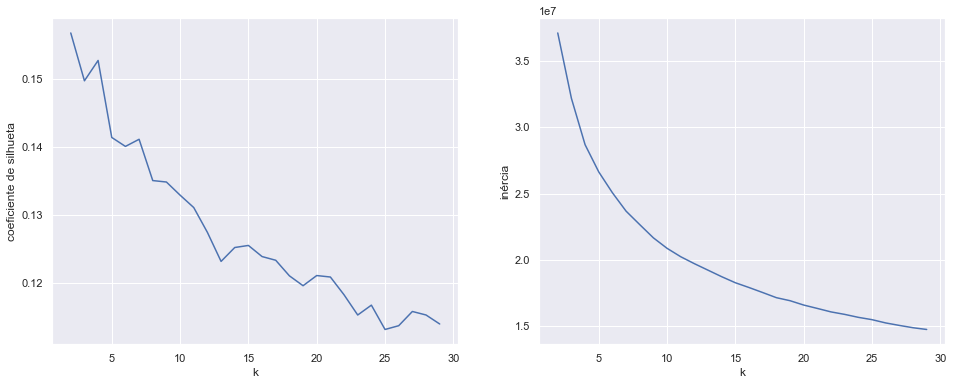

In [21]:
inertia = list()
for i in kmeans:
    inertia.append(i.inertia_)
  
fig = plt.figure(figsize=(16, 6))
ax1 = fig.add_subplot(121)
ax1.set_ylabel('coeficiente de silhueta')
ax1.set_xlabel('k')
sns.lineplot(range_n_clusters,silhouette_avg)

ax2 = fig.add_subplot(122)
ax2.set_ylabel('inércia')
ax2.set_xlabel('k')
sns.lineplot(range_n_clusters,inertia);

### 6. Avalie o gráfico gerado (Silhueta) e escolha o melhor valor de k com base nas informações desse gráfico. Com o valor de k definido, utilize o rótulo obtido para cada amostra, indicando o cluster ao qual ela pertence, para gerar um gráfico de dispersão representando os clusters.

In [22]:
df = pd.DataFrame({'k':range_n_clusters, 'inertia':inertia, 'silhouette':silhouette_avg})
df

,k,inertia,silhouette
0,2,3.712754e+07,0.156791
1,3,3.219117e+07,0.149763
2,4,2.869241e+07,0.152752
3,5,2.663864e+07,0.141438
4,6,2.506494e+07,0.140122
5,7,2.367520e+07,0.141171
6,8,2.265869e+07,0.135103
7,9,2.165860e+07,0.134891
8,10,2.086865e+07,0.132962
9,11,2.023347e+07,0.131138


In [23]:
data_set_np = data_set.to_numpy()

Para n_clusters = 2 O coeficiente de silhueta médio é: 0.15679128480152665


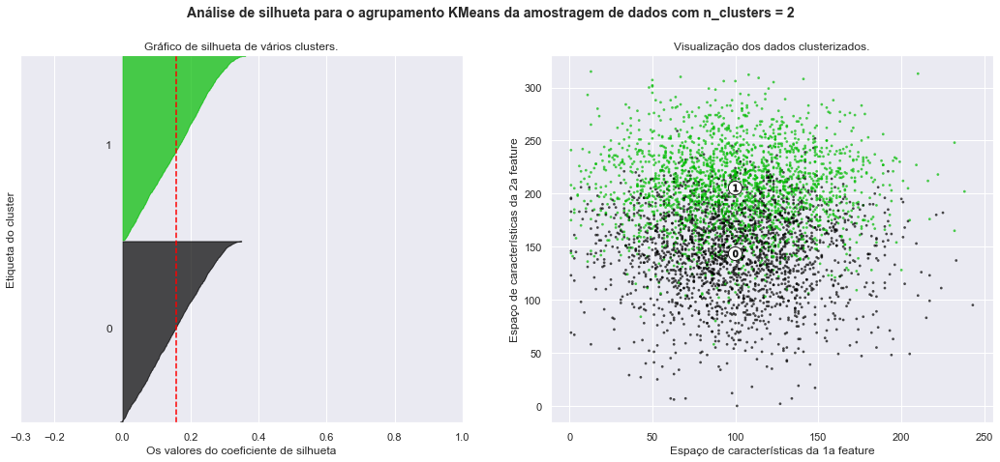

Para n_clusters = 3 O coeficiente de silhueta médio é: 0.14976348561521766


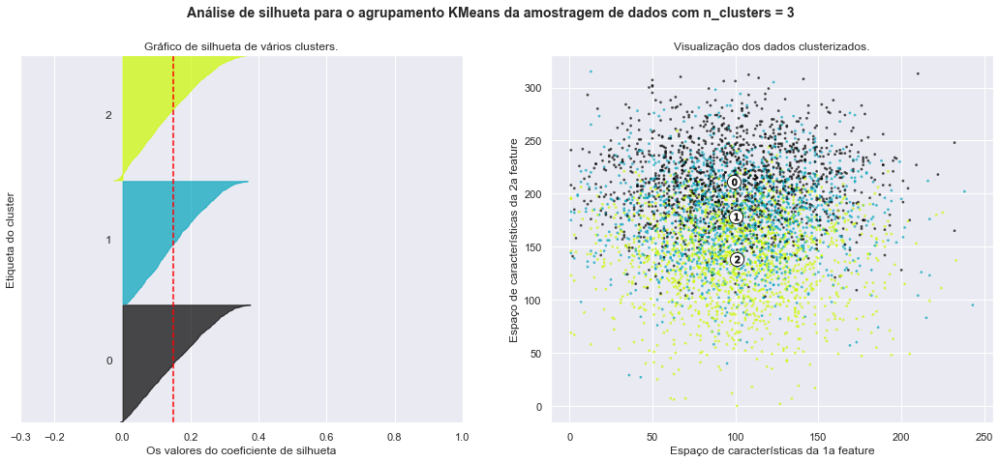

Para n_clusters = 4 O coeficiente de silhueta médio é: 0.15275199629043684


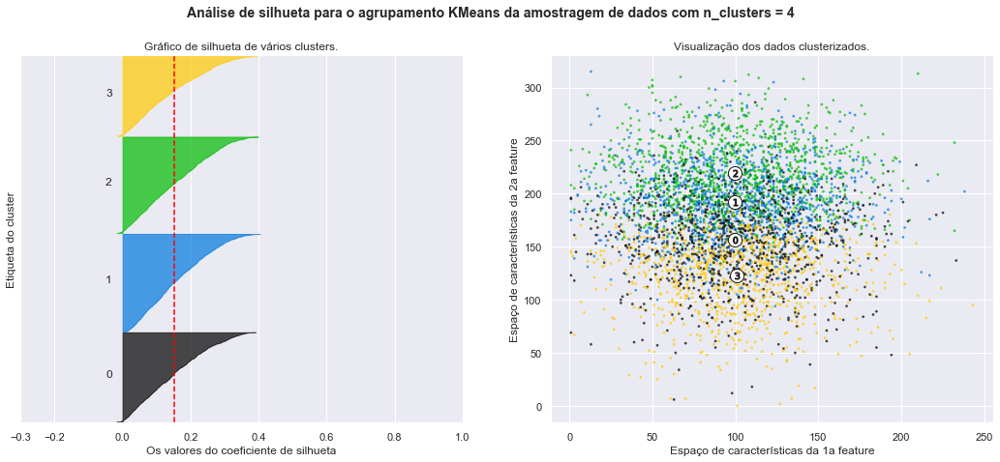

Para n_clusters = 5 O coeficiente de silhueta médio é: 0.14143822555340196


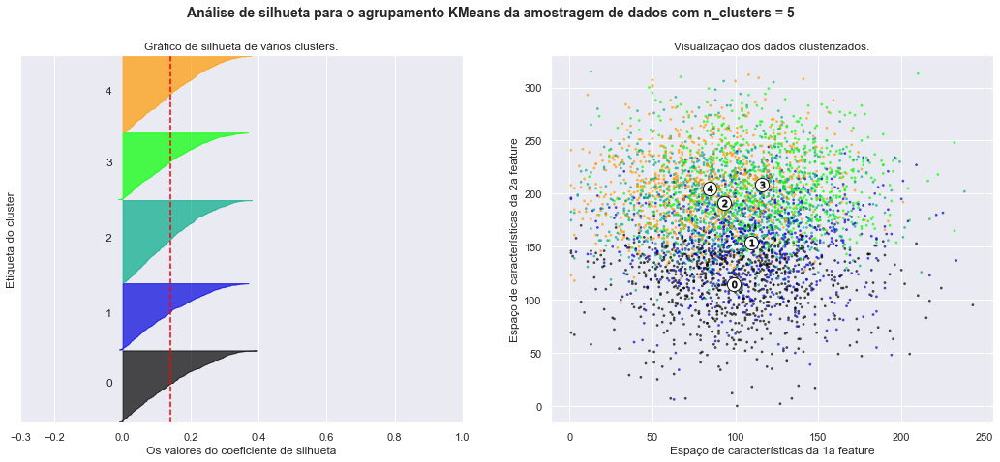

Para n_clusters = 6 O coeficiente de silhueta médio é: 0.14012175365799875


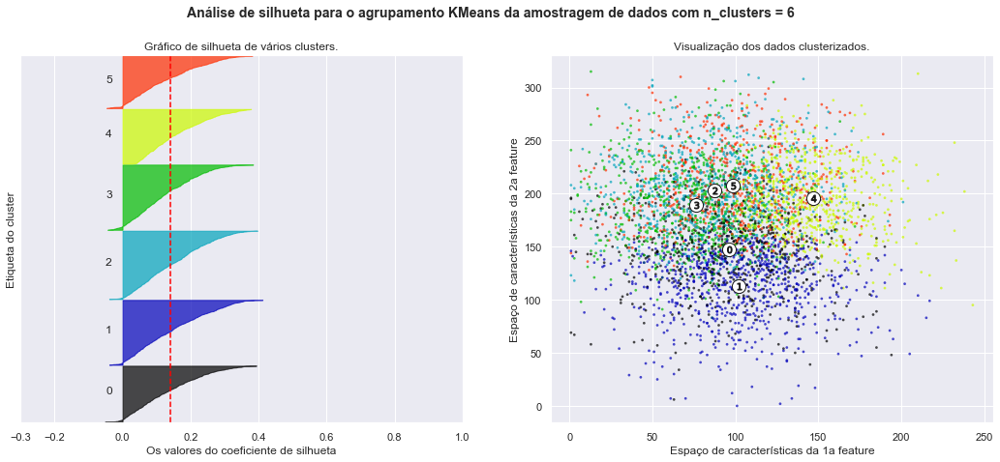

Para n_clusters = 7 O coeficiente de silhueta médio é: 0.14117077799084563


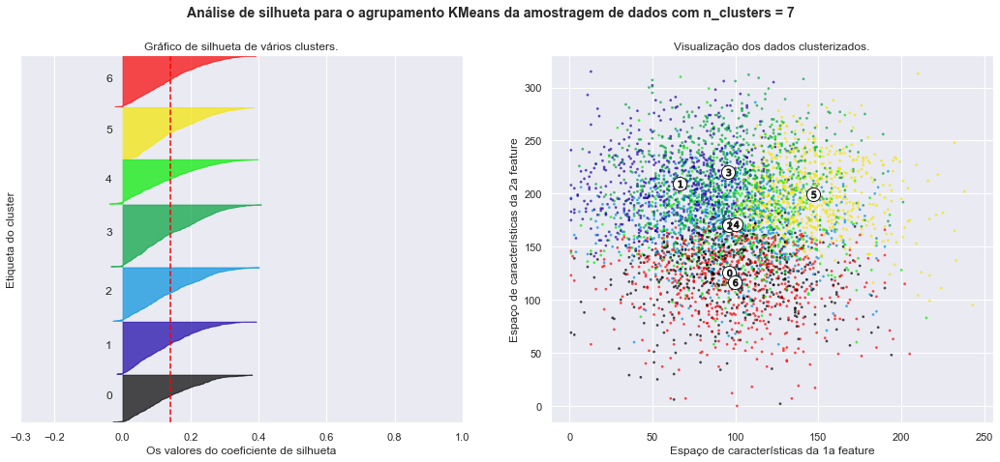

Para n_clusters = 8 O coeficiente de silhueta médio é: 0.13510309056525358


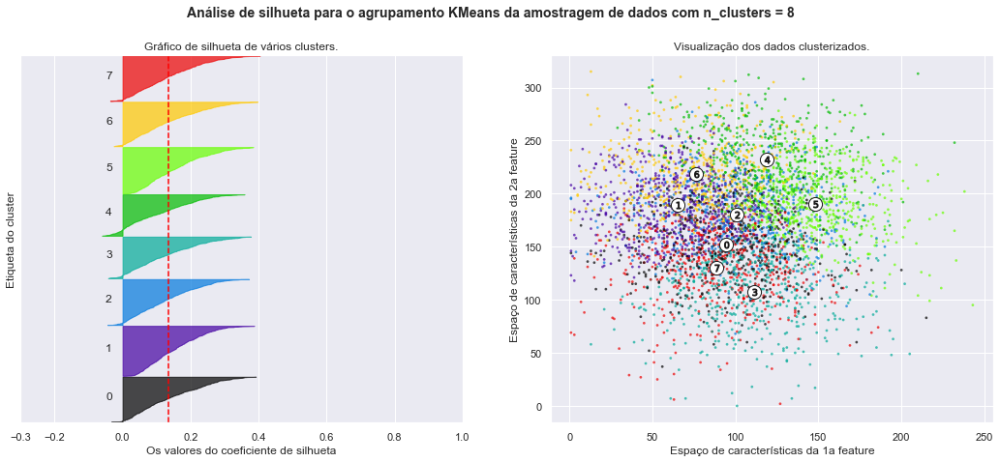

Para n_clusters = 9 O coeficiente de silhueta médio é: 0.13489072554037398


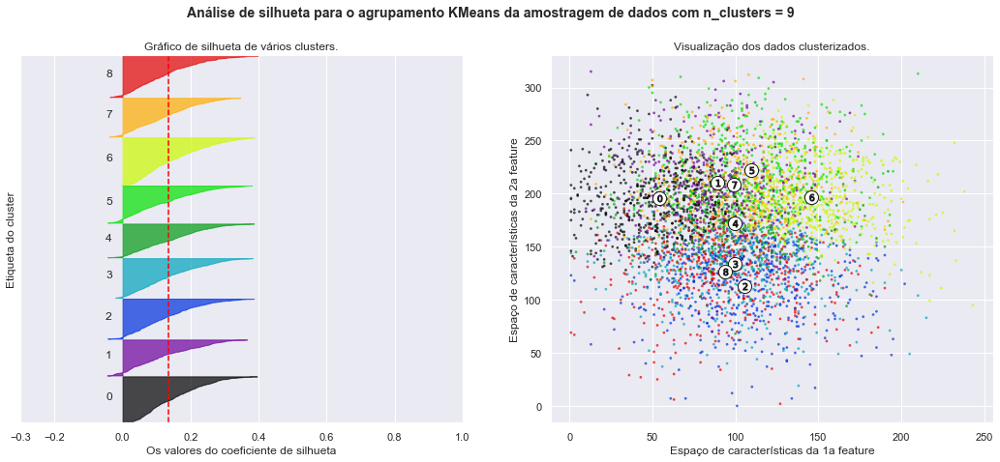

Para n_clusters = 10 O coeficiente de silhueta médio é: 0.1329622055114671


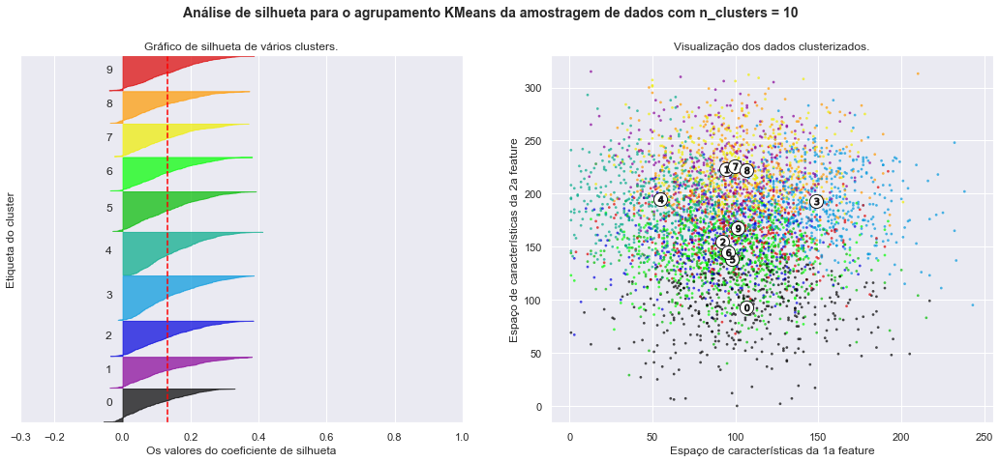

Para n_clusters = 11 O coeficiente de silhueta médio é: 0.13113847338040982


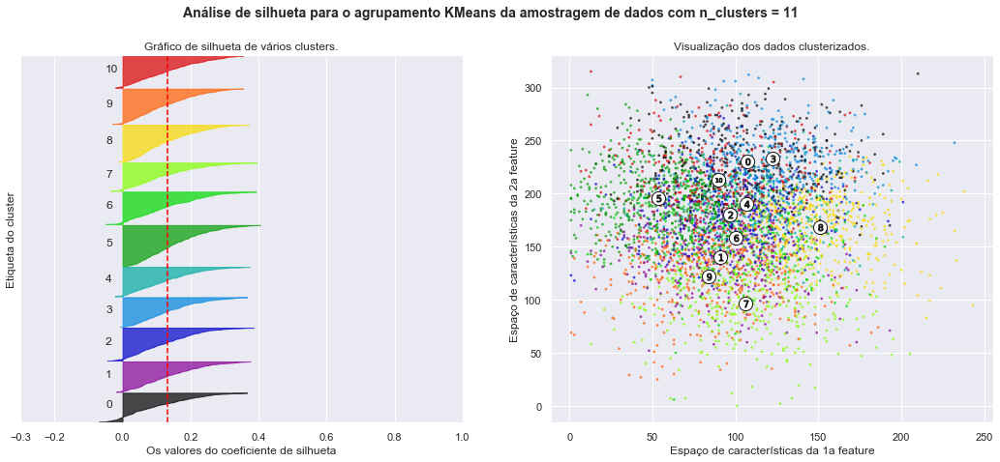

Para n_clusters = 12 O coeficiente de silhueta médio é: 0.1274894460551552


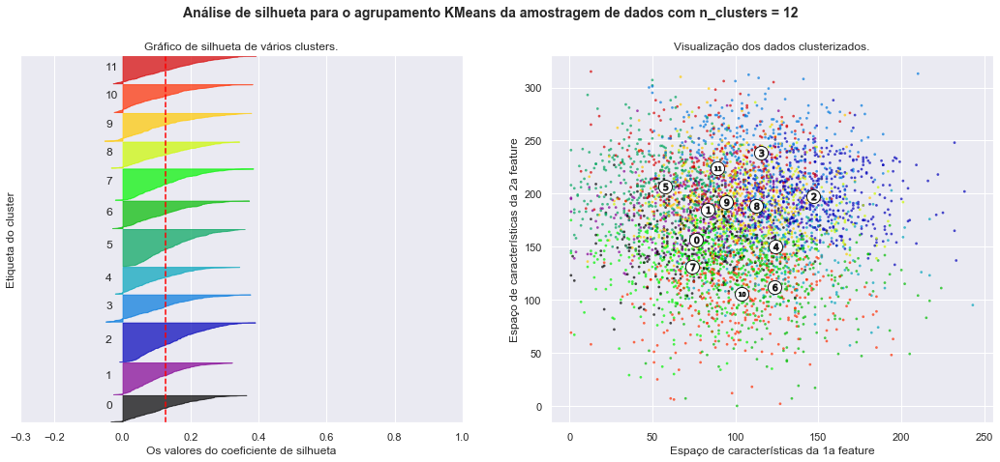

Para n_clusters = 13 O coeficiente de silhueta médio é: 0.12322666230773326


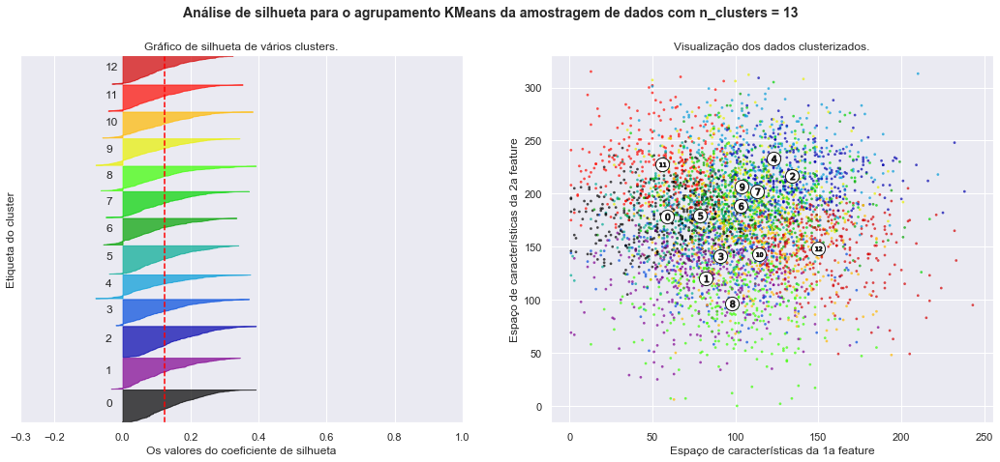

Para n_clusters = 14 O coeficiente de silhueta médio é: 0.12526788295718322


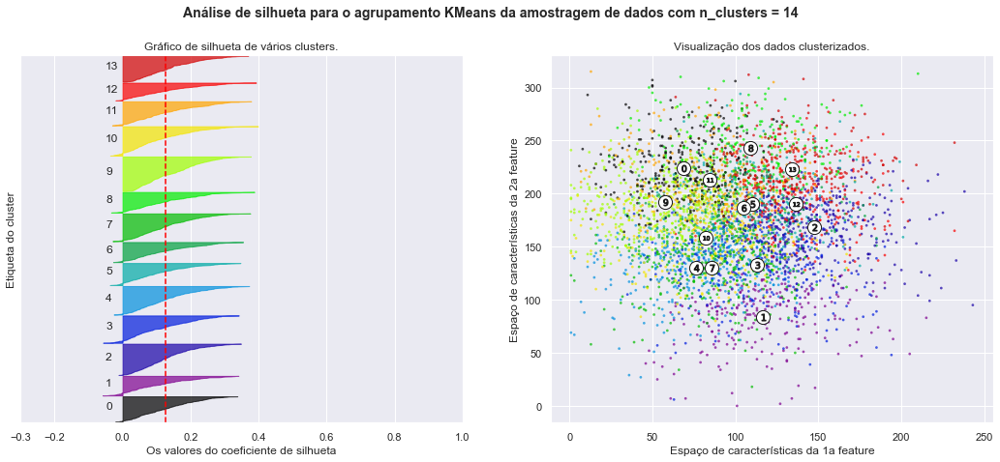

Para n_clusters = 15 O coeficiente de silhueta médio é: 0.12557120536245975


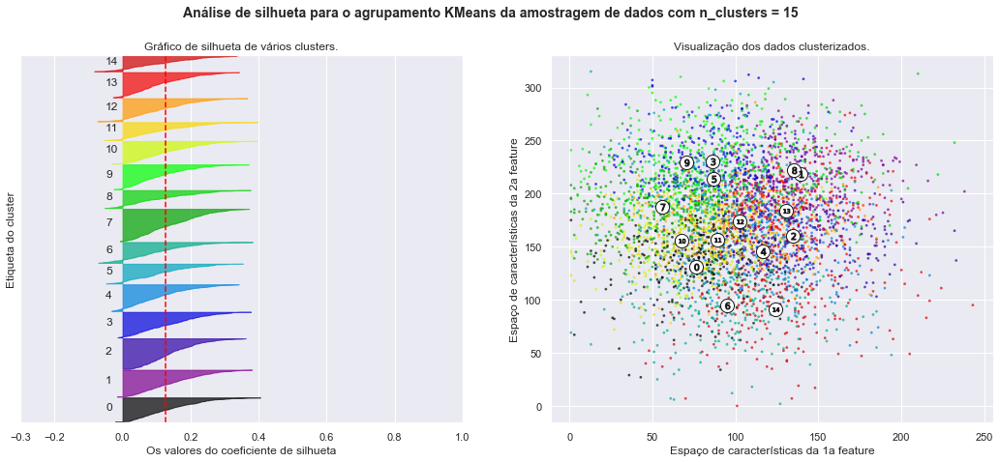

Para n_clusters = 16 O coeficiente de silhueta médio é: 0.12393795527197862


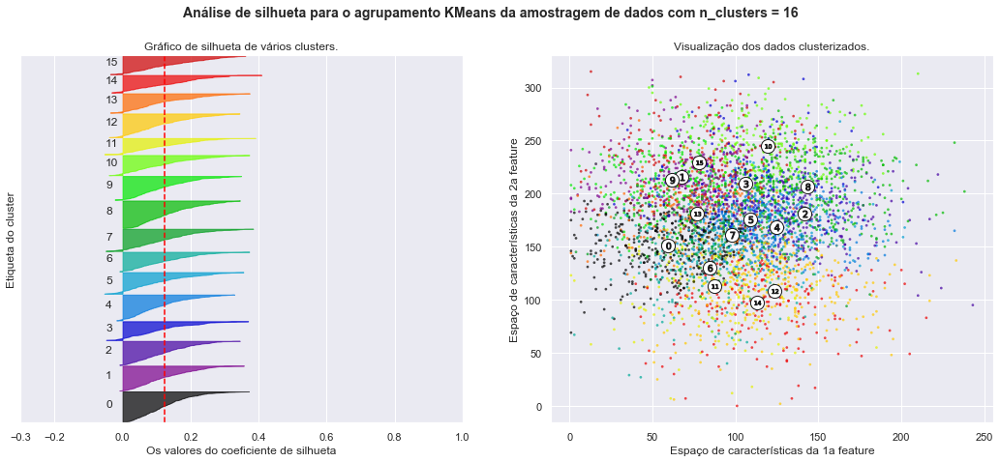

Para n_clusters = 17 O coeficiente de silhueta médio é: 0.12339366233000797


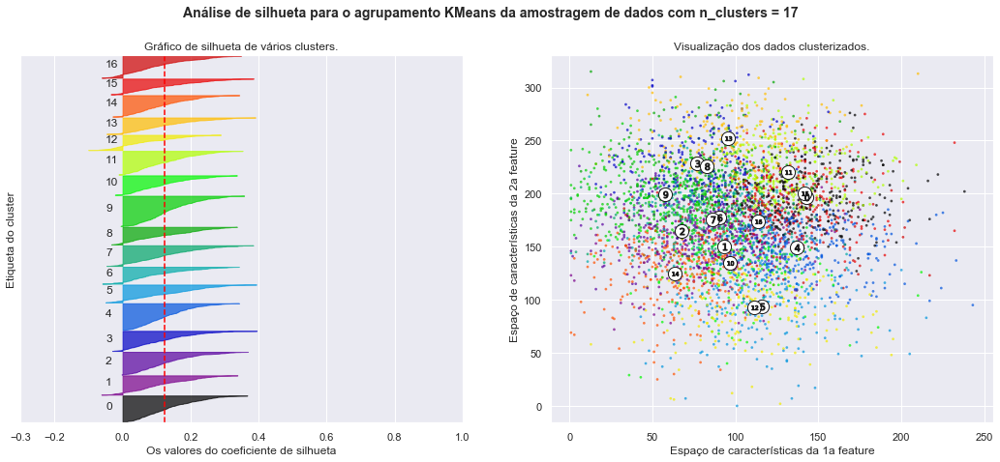

Para n_clusters = 18 O coeficiente de silhueta médio é: 0.12110792391409893


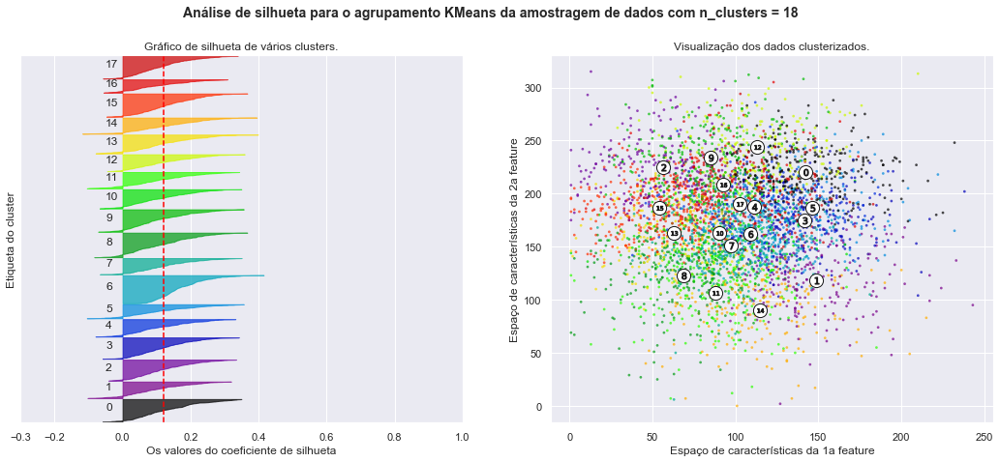

Para n_clusters = 19 O coeficiente de silhueta médio é: 0.11965410877075734


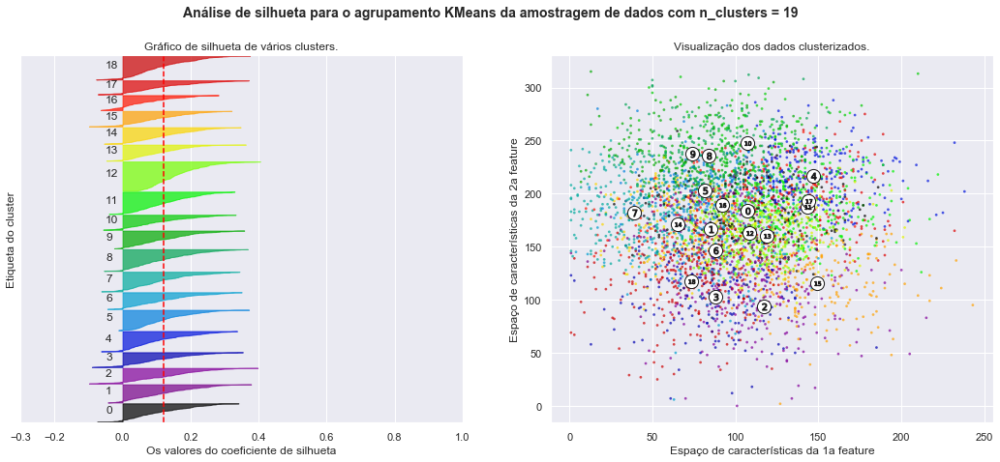

Para n_clusters = 20 O coeficiente de silhueta médio é: 0.12114811877440788


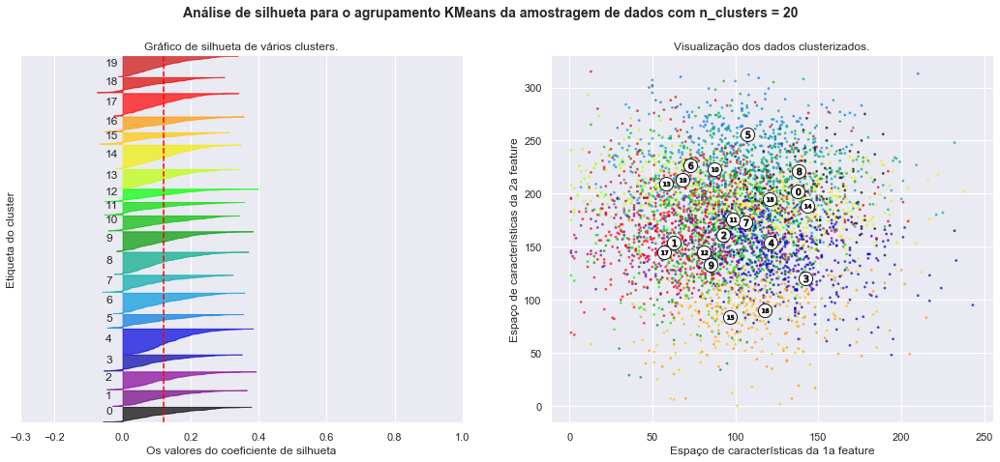

Para n_clusters = 21 O coeficiente de silhueta médio é: 0.1209316279997723


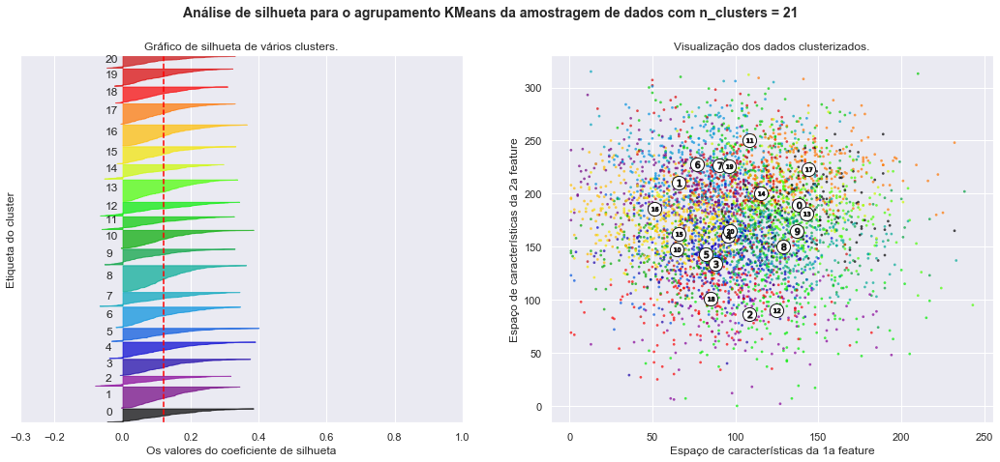

Para n_clusters = 22 O coeficiente de silhueta médio é: 0.11831833176795979


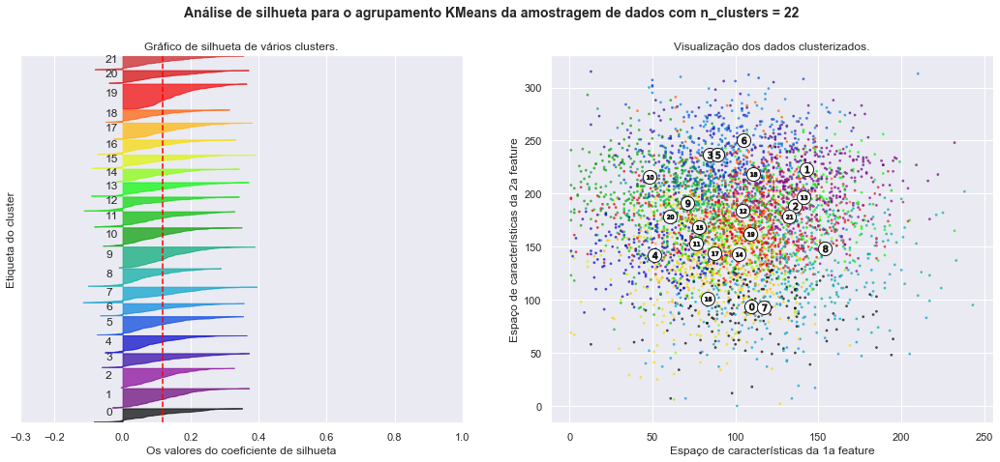

Para n_clusters = 23 O coeficiente de silhueta médio é: 0.11535020179400994


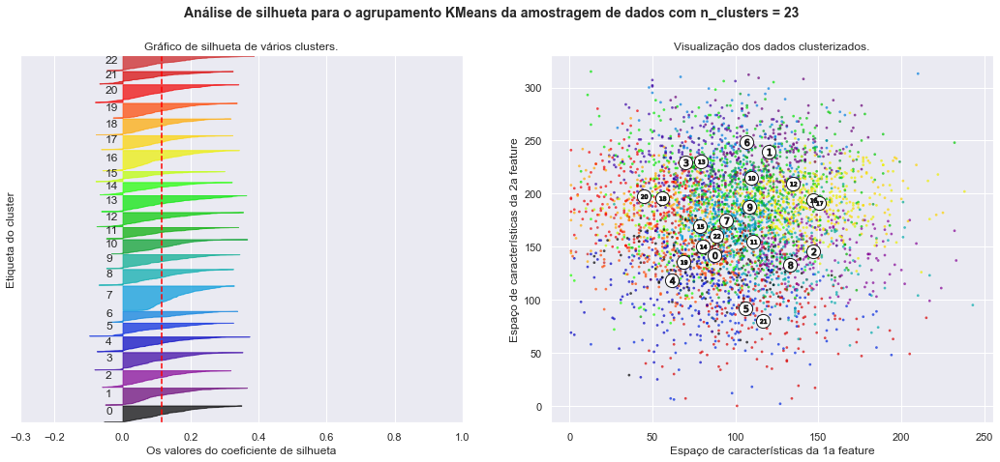

Para n_clusters = 24 O coeficiente de silhueta médio é: 0.11679921872418458


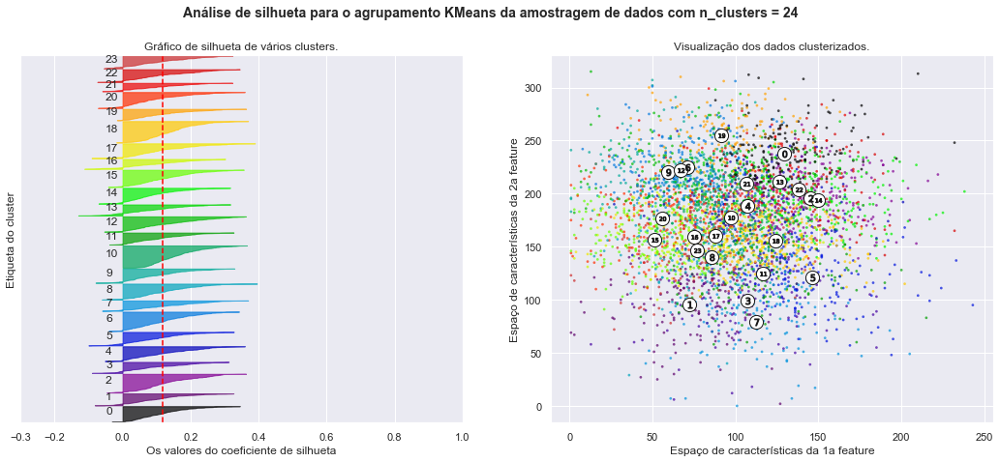

Para n_clusters = 25 O coeficiente de silhueta médio é: 0.11322449573343579


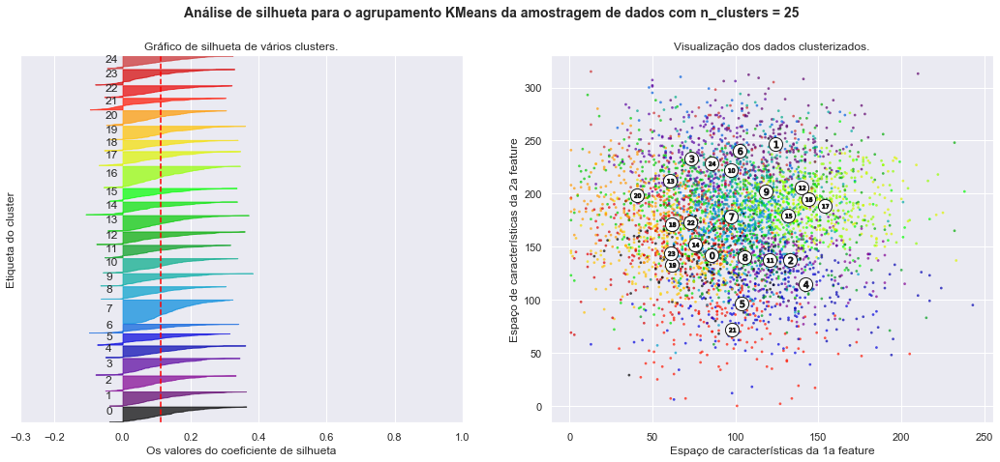

Para n_clusters = 26 O coeficiente de silhueta médio é: 0.11377816302406445


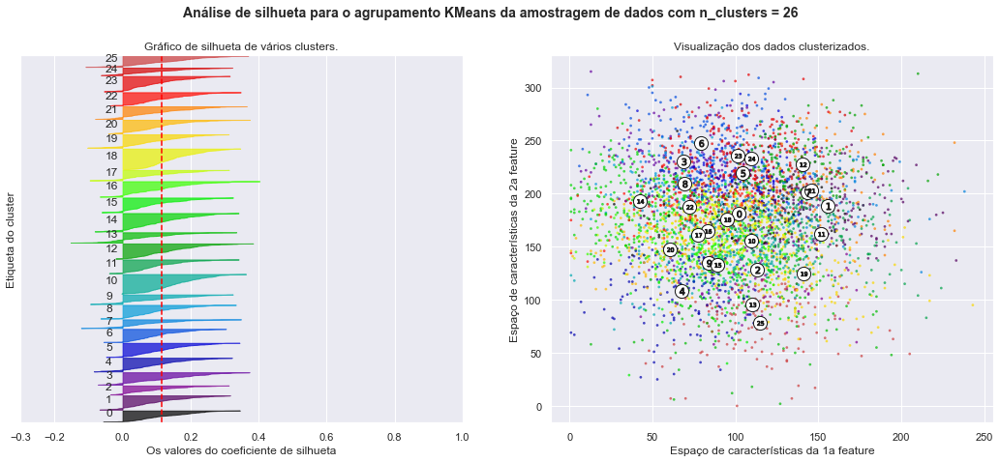

Para n_clusters = 27 O coeficiente de silhueta médio é: 0.11586899033764371


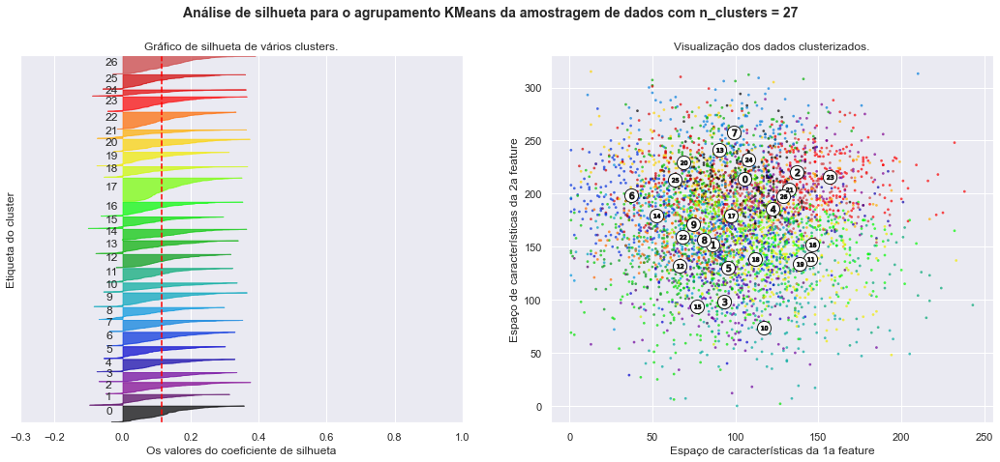

Para n_clusters = 28 O coeficiente de silhueta médio é: 0.11535238272985263


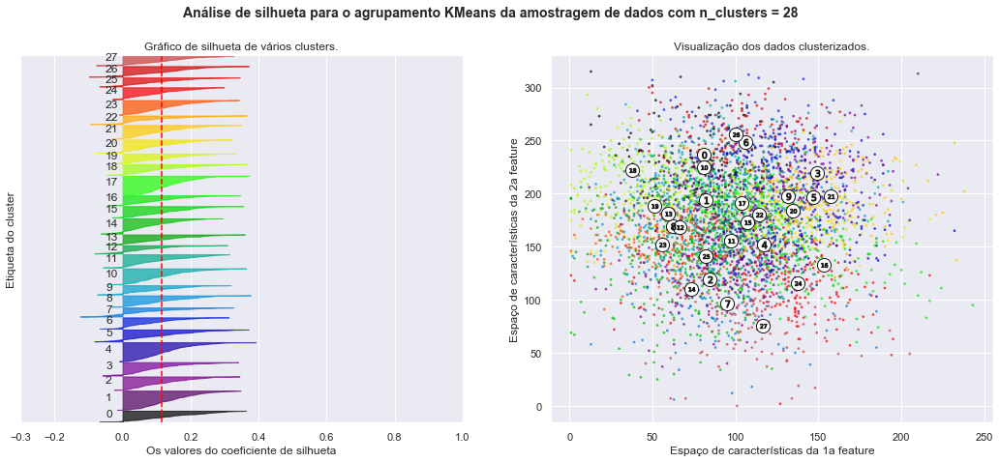

Para n_clusters = 29 O coeficiente de silhueta médio é: 0.11403116362736036


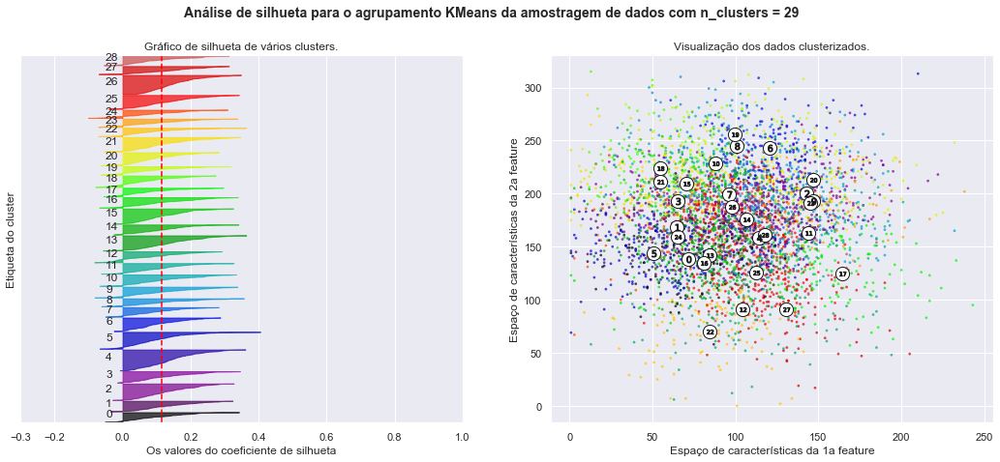

In [24]:
for i,n_clusters in enumerate(range_n_clusters):
    _kmeans_=kmeans[i]
    _cluster_labels_=cluster_labels[i]
    _silhouette_avg_=silhouette_avg[i]
    _sample_silhouette_values_ = sample_silhouette_values[i]
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.3, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_set_np) + (n_clusters + 1) * 10])
    #print('cluster_labels',np.unique(cluster_labels))
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(data_set_np, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "O coeficiente de silhueta médio é:", _silhouette_avg_)

    # Compute the silhouette scores for each sample
    #sample_silhouette_values = silhouette_samples(data_set_np, _cluster_labels_)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
                _sample_silhouette_values_[_cluster_labels_ == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Gráfico de silhueta de vários clusters.")
    ax1.set_xlabel("Os valores do coeficiente de silhueta")
    ax1.set_ylabel("Etiqueta do cluster")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=_silhouette_avg_, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.3, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(_cluster_labels_.astype(float) / n_clusters)
    ax2.scatter(data_set_np[:, 0], data_set_np[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = _kmeans_.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
              c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualização dos dados clusterizados.")
    ax2.set_xlabel("Espaço de características da 1a feature")
    ax2.set_ylabel("Espaço de características da 2a feature")

    plt.suptitle(("Análise de silhueta para o agrupamento KMeans da amostragem de dados "
                  "com n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [25]:
from sklearn.decomposition import PCA

pca_encoder = PCA(n_components=2,random_state=42)
data_set_2f = pca_encoder.fit_transform(data_set_np)
print(data_set_2f.shape)

(4288, 2)


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


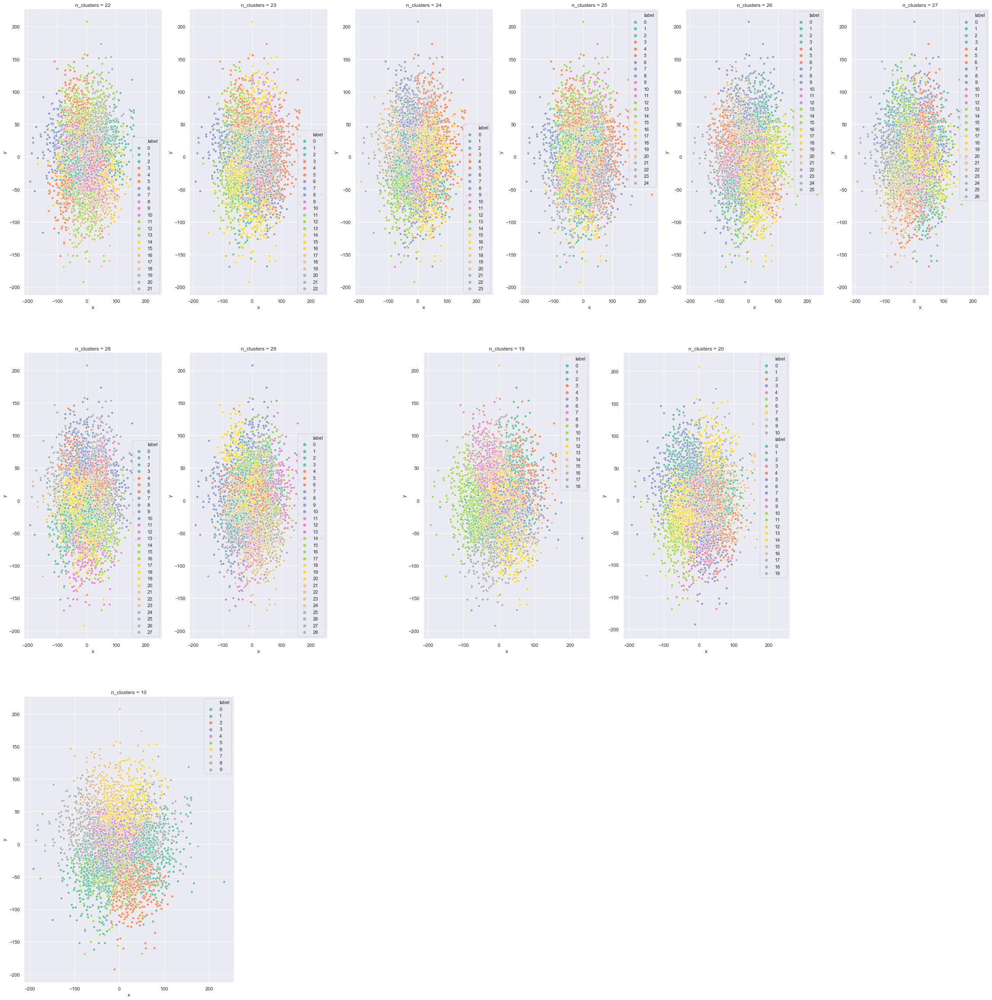

In [26]:
from math import ceil
d2f = pd.DataFrame(data_set_2f,columns=['x','y'])
plt.figure(figsize=(40, 2*len(range_n_clusters)))
cmap = sns.cubehelix_palette(dark=.3, light=.8, as_cmap=True)
for i,n_clusters in enumerate(range_n_clusters):
    # print(i,n_clusters)
    d2f['label'] = cluster_labels[i]
    val = int(30*ceil(len(range_n_clusters)/2)+21+i)
    if val == 450 or val == 460:
        val += i
    # print(val)
    ax=plt.subplot(val)
    ax.set_title("n_clusters = %d" %n_clusters)
    sns.scatterplot(data=d2f, x='x', y='y', hue='label', palette="Set2",legend='full')

### 7. Identifique e descreva as características dominantes de cada um dos grupos formados.

In [27]:
data.corr()['Churn_ True.'].sort_values()

Voice mail Plan_ yes             -0.110698
Num of Voice mail Messages       -0.097633
Total Intl  Calls                -0.046893
Total Night Calls                -0.006861
Total Eve Calls                  -0.006284
Area Code                         0.010099
Total Day Calls                   0.016130
Account Length                    0.021203
Total Night Charge                0.045673
Total Night Minutes               0.045677
Total Intl Charge                 0.063166
Total International Minutes       0.063324
Total Eve Minutes                 0.089222
Total Eve Charge                  0.089305
Total day Charge                  0.207664
Total Day Minutes                 0.207705
Number Customer Service calls     0.212913
International Plan_ yes           0.259123
Churn_ True.                      1.000000
Name: Churn_ True., dtype: float64

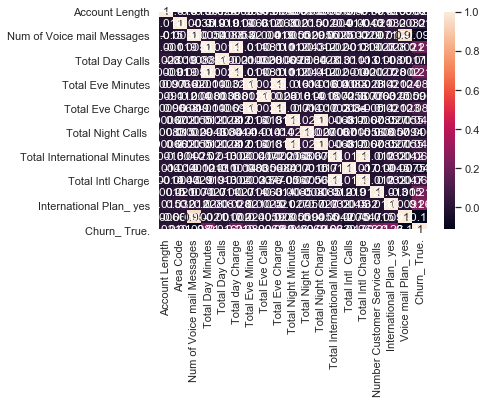

In [28]:
sns.heatmap(data.corr(), annot = True)

Fizemos correlação entre entre todos os atributos do dataframe 
e verificamos que, primeiramente, os atributos booleanos não fariam sentido e nosso contexto, logo após identificamos que alguns atributos enviesam quando rodamos o kmeans, pois seu seus pontos estavam muito abaixo da maioria.
Após a retirada desses valores e a limpeza do dataframe, é possível analisar a separação dos dados nos clusters.
Quanto maior o numero de clusters mais confuso (valores que deveriam estar em outras classes, situam-se nas classes erradas). No Cluster k=2 com apenas dois agrupamentos, foi onde obteve a melhor silhueta. Outro cluster que também teve uma boa amostragem foi o k=5 onde é possível ver que para o gráfico de silhueta pouquíssimos valores estão em grupos errados.